In [1]:
import argparse
from collections import defaultdict
import matplotlib
# matplotlib.use('Agg') 

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.patches import Patch

import os
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

In [ ]:
matplotlib.rcParams.update({'font.size': 14})

In [3]:
def plot_exon(locs,ax,h=0.25,offset = 0,bin_size=400,alpha=1,color="k",ecolor="k"):
#   print("plotting exon")
  ax.add_patch(Rectangle((locs[0], -h + offset), locs[1] - locs[0], 2*h,edgecolor=ecolor,color=color,alpha=alpha,linewidth=0))

def load_gtf(gtf_file,filt_chr):
  gtf = pd.read_csv(gtf_file, names = ["seqname", "source", "feature", "start", "end", "score", "strand", "frame", "attribute"], sep="\t")
  if 'NC_000023.11' in gtf["seqname"].unique():
    can_chrom = [x for x in gtf["seqname"].unique() if x.startswith("NC_")]
    name_dict = {x : "chr" + str(int(x.split("_")[1].split(".")[0])) for x in can_chrom}
    name_dict['NC_000023.11'] = "chrX"
    name_dict['NC_000024.10'] = "chrY"
    name_dict['NC_012920.1'] = "chrM"
    gtf["seqname"] = gtf["seqname"].map(name_dict)
    gtf = gtf[~gtf["seqname"].isna()]
    filt_chr = False
  #   gtf = gtf[gtf["feature"] == "exon"]
  try:
    gtf["gene_id"] = gtf["attribute"].str.split("gene_name").str[1].str.split(";").str[0].str.split('"').str[1]
  except:
    gtf["gene_id"] = gtf["attribute"].str.split("gene_id").str[1].str.split(";").str[0].str.split('"').str[1]
  gtf["transcript_id"] = gtf["attribute"].str.split("transcript_id").str[1].str.split(";").str[0].str.split('"').str[1]
#  filt_chr = True
  if filt_chr:
    # don't include immature scaffolds
    chromosomes = gtf["seqname"].unique()
    chromosomes = [x for x in chromosomes if "_" not in x and not x.startswith("KN")]
#    print("chromosomes",chromosomes)
    gtf = gtf[gtf["seqname"].isin(chromosomes)]
  gtf["chr_gene"] = gtf["seqname"] + gtf["gene_id"]
  return gtf


def annotation_plot(gtf, domains, gene, end,outpath, dataname,zoom=False):
  rev_dict = {"A" : "B","B" : "A"}
#   expand_dict = {"don" : "donor","acc" : "acceptor"}
  # gene = "CALD1"
  # end = 134928754
  don_df = pd.read_csv("{}{}_{}_{}_coords.tsv".format(outpath,dataname,gene,end),sep="\t")
  don_df = don_df.rename(columns={"rank_acc" : "rank", "rank_don" : "rank"}).astype(int)


  if don_df["juncPosR1A"].nunique() == 1:
    let = "A"
  else:
    let = "B"

  shared_ends = list(don_df["juncPosR1" + rev_dict[let]])

#   zoom = True
  # for gene in genes:
  gene_gtf = gtf[gtf["gene_id"] == gene]
  gene_gtf = gene_gtf[gene_gtf["feature"].isin(["exon"])]

  legend = True

  if don_df["juncPosR1" + rev_dict[let]].nunique() > 1:

    colors = [u'#1f77b4', u'#ff7f0e', u'#2ca02c', u'#d62728', u'#9467bd', u'#8c564b', u'#e377c2', u'#7f7f7f', u'#bcbd22', u'#17becf',u'#1f77b4', u'#ff7f0e', u'#2ca02c', u'#d62728', u'#9467bd', u'#8c564b', u'#e377c2', u'#7f7f7f', u'#bcbd22', u'#17becf']
    someX, someY = 0.5, 0.5
    plt.figure(figsize=(12, 6))
    h = 1
    offset = 1
    currentAxis = plt.gca()
    count = 1
    y_labels = []
    arc_height = 10
    y_ticks = []
    arcs = False
    chromosome = gene_gtf["seqname"].iloc[0]
    gene_min_all = gene_gtf["start"].min()
    gene_max_all = gene_gtf["end"].max()

    legend_elements = []

    gene_domains = domains[(domains[1] == chromosome) & (domains[2] < gene_max_all) & (domains[3] > gene_min_all)]

    # if arcs:
    # count = 1
    if gene_gtf["strand"].iloc[0] == "+":
      asc = True
    else:
      asc = False

  #   plt.text(row["juncPosR1" + rev_dict[let]],gene_gtf["transcript_id"].nunique() + 1,row["rank"],horizontalalignment="center")
    for ind, row in don_df.iterrows():
        plt.text(row["juncPosR1" + rev_dict[let]],gene_gtf["transcript_id"].nunique() + 1,row["rank"],horizontalalignment="center")
        plt.plot([row["juncPosR1" + rev_dict[let]],row["juncPosR1" + rev_dict[let]]],[ -0.5,gene_gtf["transcript_id"].nunique() + 0.5],color="red")
    plt.plot([row["juncPosR1" + let],row["juncPosR1" + let]],[ -0.5,gene_gtf["transcript_id"].nunique() + 0.5],color="blue")


    count = 0
    for transcript, trans_df in gene_gtf.groupby("transcript_id"):
      y_labels.append(transcript)
      y_ticks.append(count * offset)
      gene_min = trans_df["start"].min()
      gene_max = trans_df["end"].max()
      plt.plot([gene_min,gene_max],[offset * count,offset * count],color="k")

      for exons in set([tuple(x) for x in trans_df[["start","end"]].to_numpy()]):
        plot_exon(exons,currentAxis,offset = count * offset)
      i = 0
      for d in set([tuple(x) for x in gene_domains[[2,3,4]].to_numpy()]):
#         print("domain",d)
        plot_exon(d[:2],currentAxis,offset = count * offset,alpha = 0.4,color=colors[i],ecolor=None,h=0.5)
        legend_elements.append(Patch(facecolor=colors[i], edgecolor=None,label=d[2],alpha=0.4))
        i += 1

      count += 1

    if arcs:
      plt.ylim([-1,gene_gtf["transcript_id"].nunique() + arc_height + 1])
    else:
      plt.ylim([-1,gene_gtf["transcript_id"].nunique() + 2])

    currentAxis.ticklabel_format(useOffset=False,style="plain")
    if legend:
      currentAxis.legend(handles=legend_elements[:gene_domains.shape[0]],bbox_to_anchor=(1., 1.0))
    plt.yticks(y_ticks,y_labels)
  #   plt.xlim([gene_min_all,gene_max_all])
    if zoom:
      print("end",end,"shared_ends",shared_ends)
      buff = max([abs(x - end) for x in shared_ends]) * 2
      plt.xlim(min([end] + shared_ends) - buff,max([end] + shared_ends) + buff)
    else:
      plt.xlim([gene_min_all,gene_max_all])

    plt.title("{} {} {}".format(gene,chromosome,end))
    print("{}{}{}_{}_don_ann.png".format(outpath,dataname,gene,end))
    plt.savefig("{}{}{}_{}_don_ann.png".format(outpath,dataname,gene,end),bbox_inches = "tight")
    plt.show()
    return chromosome
#     except Exception as e:
#       print(e)

## create a color dictionary for donors
#def compartment_colors(compartments):
#    
#    import matplotlib.colors as pltcolors
#    
#    cmap = plt.cm.get_cmap("YlOrRd")
#        
#    compartment_color_dict = {}
#    j=1/len(compartments)
#    for c in compartments:
#        compartment_color_dict[c] = pltcolors.to_hex(cmap(j))
#        j+=1/len(compartments)
#        
#    return compartment_color_dict

# create a color dictionary for donors (our colors)
def compartment_colors(compartments):
    compartment_color_dict = {comp : col for comp, col in zip(compartments,sns.color_palette("deep",len(compartments)))}
    return compartment_color_dict


def tissue_colors():
    
    tissue_color_dict = {'Bladder': '#e7969c',
             'Blood': '#d6616b',
             'Bone_Marrow': '#cedb9c',
#              'Fat': '#e7cb94',
#              'Heart': '#637939',
             'Kidney': '#7b4173',
             'Large_Intestine': '#31a354',
             'Lung': '#3182bd',
             'Lymph_Node': '#8c6d31',
             'Muscle': '#e7ba52',
             'Pancreas': '#fd8d3c',
             'Skin': '#ce6dbd',
             'Small_Intestine': '#6baed6',
             'Spleen': '#393b79',
             'Thymus': '#9c9ede',
             'Trachea': '#969696',
             'Vasculature': '#843c39'}
    
    return tissue_color_dict

def get_args():
  parser = argparse.ArgumentParser(description="make box plots for each donor and acceptor")
  parser.add_argument("--dataname",help="name of dataset to use")
  parser.add_argument("--letter",help="which letter; donor: A, acceptor: B")
  parser.add_argument("--params",help="file of parameters to make plots for")



  args = parser.parse_args()
  return args

def dot_plot(don_df, let, let_dict, palette, onts, outpath, gene, don, tiss, dataname, rev_dict, domains,gtf, alpha,split_col):
#  print("in dot")
  expand_dict = {"don" : "donor","acc" : "acceptor"}
  don_df["ontology_rank"] = don_df["ontology"] + don_df["rank_" + let_dict[let]].astype(str)
  don_df["rank_count"] = don_df["ontology_rank"].map(don_df.groupby("ontology_rank")["numReads"].sum())
  ont_dict = {o : i for o, i in zip(sorted(onts),reversed(range(1,don_df["ontology"].nunique() + 1)))}
  
  don_df["ont_num"] = don_df["ontology"].map(ont_dict)
  
  pdf = don_df.drop_duplicates("ontology_rank")
  pdf["rank_sum"] = pdf["ontology"].map(pdf.groupby("ontology")["rank_count"].sum())
  pdf["frac_rank"] = pdf["rank_count"] / pdf["rank_sum"]
  print("ranks",pdf["rank_" + let_dict[let]].value_counts())
  pdf["rank_" + let_dict[let]] = pdf["rank_" + let_dict[let]].astype(int)

  ann_dict = pd.Series(pdf.splice_ann.values,index=pdf["rank_" + let_dict[let]]).to_dict() 
  coords = pdf.drop_duplicates("rank_" + let_dict[let])[["rank_" + let_dict[let],"juncPosR1A","juncPosR1B"]]
  coords = coords[coords["rank_" + let_dict[let]].isin(range(1,int(coords["rank_" + let_dict[let]].max() + 1)))].sort_values("rank_" + let_dict[let])
  end = int(coords["juncPosR1" + let].iloc[0])
  coords.to_csv("{}{}_{}_{}_coords.tsv".format(outpath,dataname,gene,end),sep="\t",index=False)
  chromosome = annotation_plot(gtf, domains, gene, end,outpath, dataname)

  print("ann_dict",ann_dict)
#  pdf["rank_sum"] = pdf["ontology"].map(pdf.groupby("ontology")["scaled_rank"].sum())
#  pdf["scaled_rank"] = pdf["scaled_rank"] / pdf["rank_sum"]
  g = sns.relplot(x="rank_" + let_dict[let], y="ont_num", size="frac_rank",
              sizes=(10, 400), alpha=alpha, palette=palette,hue="compartment",
              height=max(4,pdf["ontology"].nunique()*0.3), data=pdf).set_axis_labels(expand_dict[let_dict[let]] + "s","----- pseudotime ----->").set(yticklabels=[])
  
  #   g.axes.set_ylabel('')
  
#   g.axes.set_xlabel(expand_dict[let_dict[let]] + "s")
#   for tick_label in g.ax.get_xticklabels():
#     try:
#       if float(tick_label.get_text()) in ann_dict.keys():
#         if ann_dict[int(float(tick_label.get_text()))]:
#           tick_label.set_color("blue")
#         else:
#           tick_label.set_color("red")
#     except Exception as e:
#       print(e)

#     onts = []
#     vals = []
#     for key, value in ont_dict.items():
#       onts.append(key)
#       vals.append(value)
#   plt.yticks(range(1,don_df["ontology"].nunique() + 1),onts)
  plt.title("{} {} {} {} {}".format(gene,tiss, chromosome, don[:len(gene)], expand_dict[let_dict[rev_dict[let]]]))
  plt.savefig("{}{}_{}_{}_{}_{}_{}_dot.png".format(outpath, gene, don, tiss, dataname, let_dict[rev_dict[let]],split_col),bbox_inches="tight")
#  print("saved")
  plt.show()
  return 0

def plot_df(df, let, cell_lim, outpath, gene, dataname, let_dict, palette, rev_dict, don,tiss, don_df, comp_sort, split_col):
#    df["num_cells"] = df["ontology"].map(df.groupby("ontology")["cell"].nunique())
#
#    df = df[df["num_cells"] > cell_lim]
    expand_dict = {"don" : "donor","acc" : "acceptor"}
    # calculate ontology-wide values to sort on
    df["ont_rank"] = df["ontology_" + let_dict[rev_dict[let]]].map(df.groupby("ontology_" + let_dict[rev_dict[let]])["avg_rank"].median())
    df["ont_75"] = df["ontology_" + let_dict[rev_dict[let]]].map(df.groupby("ontology_" + let_dict[rev_dict[let]])["avg_rank"].quantile(0.75))
    df["ont_25"] = df["ontology_" + let_dict[rev_dict[let]]].map(df.groupby("ontology_" + let_dict[rev_dict[let]])["avg_rank"].quantile(0.25))

    df["ont_max"] = df["ontology_" + let_dict[rev_dict[let]]].map(df.groupby("ontology_" + let_dict[rev_dict[let]])["avg_rank"].max())
    df["ont_min"] = df["ontology_" + let_dict[rev_dict[let]]].map(df.groupby("ontology_" + let_dict[rev_dict[let]])["avg_rank"].min())
    if comp_sort:
      df = df.sort_values("compartment")
    else:
      df = df.sort_values(["ont_rank","ont_75","ont_25","ont_max","ont_min"])
    df = df.sort_values(split_col)
    ann_dict = pd.Series(df.splice_ann.values,index=df["rank_" + let_dict[let]]).to_dict() 

    num_cells = list(df.drop_duplicates("ontology")["num_cells"])
    medians = list(df.drop_duplicates("ontology")["ont_rank"])
    if df.shape[0] > 0:
      fig,(ax2) = plt.subplots(1)
      g = sns.boxplot(x="avg_rank", y="ontology",hue="compartment",dodge=False,
                       data=df,
                       orient="h", palette=palette)
      g.axes.set_ylabel('') 
      g.axes.set_xlabel('average {} rank per cell'.format(expand_dict[let_dict[let]])) 
#    for tick_label in g.ax.get_xticklabels():
#     for i in range(len(ax2.get_xticklabels())):
#       try:
#         if ax2.get_xticks()[i] in ann_dict.keys():
#           if ann_dict[int(float(tick_label.get_text()))]:
#             ax2.get_xticklabels()[i].set_color("blue")
#           else:
#             ax2.get_xticklabels()[i].set_color("blue")
#       except Exception as e:
#         print(Exception)

# #    for tick_label in ax2.get_xticks():

#       try:
#         if float(tick_label.get_text()) in ann_dict.keys():
#           if ann_dict[int(float(tick_label.get_text()))]:
#             tick_label.set_color("blue")
#           else:
#             tick_label.set_color("red")
#       except Exception as e:
#         print(Exception)

      for i,artist in enumerate(ax2.artists):
          # Set the linecolor on the artist to the facecolor, and set the facecolor to None
          col = artist.get_facecolor()
          artist.set_edgecolor(col)
          artist.set_facecolor('None')

          # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
          # Loop over them here, and use the same colour as above
          for j in range(i*6,i*6+6):
              line = ax2.lines[j]
              line.set_color(col)
              line.set_mfc(col)
              line.set_mec(col)
    
      # Also fix the legend
#       for legpatch in ax2.get_legend().get_patches():
#           col = legpatch.get_facecolor()
#           legpatch.set_edgecolor(col)
#           legpatch.set_linewidth(10)
#           legpatch.set_facecolor('None')
#         medians = df.groupby("ontology")["avg_rank"].median()
      for i in range(len(num_cells)):
        plt.text(df["avg_rank"].max() + (df["avg_rank"].max() - df["avg_rank"].min())/12,i, num_cells[i])


#         plt.scatter([medians[len(num_cells) - i - 1]],[i],color = "k",s=20,zorder=100)
        if split_col == "dev_stage":
          plt.scatter([medians[i]],[i],color = "k",s=20,zorder=100)
        elif split_col == "binned_pt":
          plt.scatter([medians[len(num_cells) - i - 1]],[i],color = "k",s=20,zorder=100)
      g.legend_.remove()
      plt.title("{} {} {} {}\nmean: {:0.2f} median: {:0.2f}".format(gene,tiss, don[:len(gene)], expand_dict[let_dict[rev_dict[let]]], don_df["avg_rank"].mean(), don_df["avg_rank"].median()))
#       plt.legend(bbox_to_anchor=(1.5, 1.05))
      plt.savefig("{}{}_{}_{}_{}_{}_{}.png".format(outpath, gene, don, tiss, dataname, let_dict[rev_dict[let]],split_col),bbox_inches="tight")
      plt.show()
      return df


def box(df, let, cell_lim, outpath, gene, dataname, let_dict, palette, rev_dict, domains, gtf, alpha, comp_sort,split_col):

  for don, don_df in df.groupby("pos{}_group".format(let)):
    temp = plot_df(don_df.drop_duplicates("pos{}_cell".format(let)), let, cell_lim, outpath, gene, dataname, let_dict, palette, rev_dict, don,"all", don_df, comp_sort,split_col)
    if not temp is None:
      if temp["ontology"].nunique() > 0:
        onts = list(temp.sort_values(["ont_rank","ont_75","ont_25","ont_max","ont_min"]).drop_duplicates("ontology")["ontology"].unique())
        onts.reverse()
        response = dot_plot(don_df, let, let_dict, palette,onts, outpath, gene, don, "all", dataname, rev_dict,domains,gtf, alpha,split_col)
    for tiss, tiss_df in don_df.groupby("tissue"):
      temp = plot_df(tiss_df.drop_duplicates("pos{}_cell".format(let)), let, cell_lim, outpath, gene, dataname, let_dict, palette, rev_dict, don,tiss, don_df, comp_sort,split_col)
      if not temp is None:
        if temp["ontology"].nunique() > 0:
          onts = list(temp.sort_values(["ont_rank","ont_75","ont_25","ont_max","ont_min"]).drop_duplicates("ontology")["ontology"].unique())
          onts.reverse()
          response = dot_plot(tiss_df, let, let_dict, palette,onts,outpath, gene, don, tiss, dataname, rev_dict, domains,gtf, alpha,split_col)
          if type(response) != int:
            print("ERROR")
            return response

In [4]:
outpath = "output/plot_human_spermatogenesis/"

domains = pd.read_csv("../util_files/ucscGenePfam.txt",sep="\t",header=None)
gtf_file = "../util_files/GRCh38_latest_genomic.gtf"
gtf = load_gtf(gtf_file,True)

In [5]:
gtf[gtf["gene_id"] == "MTFR1"]

,seqname,source,feature,start,end,score,strand,frame,attribute,gene_id,transcript_id,chr_gene
1489990,chr8,Gnomon,exon,65643873,65643976,.,+,.,"transcript_id ""rna-XM_006716484.2""; gene_id ""g...",MTFR1,rna-XM_006716484.2,chr8MTFR1
1489991,chr8,Gnomon,exon,65669873,65670018,.,+,.,"transcript_id ""rna-XM_006716484.2""; gene_id ""g...",MTFR1,rna-XM_006716484.2,chr8MTFR1
1489992,chr8,Gnomon,exon,65682353,65682451,.,+,.,"transcript_id ""rna-XM_006716484.2""; gene_id ""g...",MTFR1,rna-XM_006716484.2,chr8MTFR1
1489993,chr8,Gnomon,exon,65693644,65693759,.,+,.,"transcript_id ""rna-XM_006716484.2""; gene_id ""g...",MTFR1,rna-XM_006716484.2,chr8MTFR1
1489994,chr8,Gnomon,exon,65704694,65704929,.,+,.,"transcript_id ""rna-XM_006716484.2""; gene_id ""g...",MTFR1,rna-XM_006716484.2,chr8MTFR1
...,...,...,...,...,...,...,...,...,...,...,...,...
1490084,chr8,Gnomon,CDS,65693644,65693759,.,+,0,"transcript_id ""rna-XM_011517628.2""; gene_id ""g...",MTFR1,rna-XM_011517628.2,chr8MTFR1
1490085,chr8,Gnomon,CDS,65704694,65704929,.,+,1,"transcript_id ""rna-XM_011517628.2""; gene_id ""g...",MTFR1,rna-XM_011517628.2,chr8MTFR1
1490086,chr8,Gnomon,CDS,65707010,65707256,.,+,2,"transcript_id ""rna-XM_011517628.2""; gene_id ""g...",MTFR1,rna-XM_011517628.2,chr8MTFR1
1490087,chr8,Gnomon,CDS,65707843,65708011,.,+,1,"transcript_id ""rna-XM_011517628.2""; gene_id ""g...",MTFR1,rna-XM_011517628.2,chr8MTFR1


In [11]:
gtf[(gtf["gene_id"] == "MTFR1") & (gtf["end"] == 65719380)]

,seqname,source,feature,start,end,score,strand,frame,attribute,gene_id,transcript_id,chr_gene


In [19]:
df = pd.read_csv("/oak/stanford/groups/horence/Roozbeh/single_cell_project/processed_files/zscores/zcontrib_files/spermatogenesis_human_10x_unselected_zcontribs_all_sym_S_0.1_z_0.0_b_5.tsv",sep="\t")

In [20]:
df["binned_pt"] = pd.cut(x=df["Pseudotime"],bins=np.linspace(df["Pseudotime"].min(),df["Pseudotime"].max(),10),labels=[x for x in reversed(range(9))])

In [21]:
df["juncPosR1A"] = df["refName_newR1"].str.split(":").str[2].astype(int)
df["juncPosR1B"] = df["refName_newR1"].str.split(":").str[5].astype(int)

In [22]:
df["splice_ann"] = True
df["compartment"] = "germ"
df["tissue"] = "testes"

4    1490229
0     724729
8     648866
1     340991
3     315954
2     310485
5     233497
6     117168
7      91186
Name: binned_pt, dtype: int64

4    1490229
0     724729
8     648866
1     340991
3     315954
2     310485
5     233497
6     117168
7      91186
Name: binned_pt, dtype: int64

4    1469947
0     708095
8     636301
1     326516
2     293967
3     293206
5     219040
6     108251
7      83033
Name: binned_pt, dtype: int64

  0%|          | 0/5 [00:00<?, ?it/s]

gene FAM71E1


4    2416
0    1097
1     519
3     493
2     464
5     354
8     117
7      66
6      37
Name: binned_pt, dtype: int64

size before sub (5563, 30)


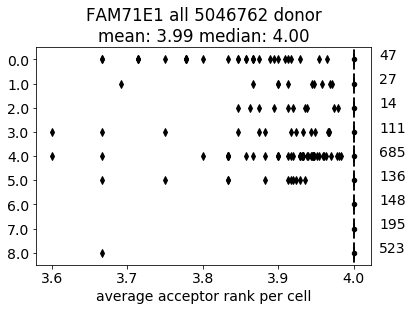

ranks 4.0    9
2.0    7
3.0    4
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50467622_don_ann.png


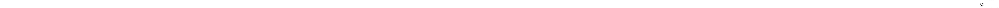

ann_dict {4: True, 2: True, 3: True, 1: True}


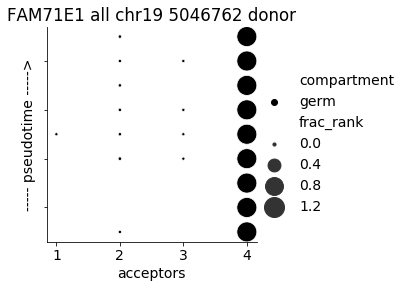

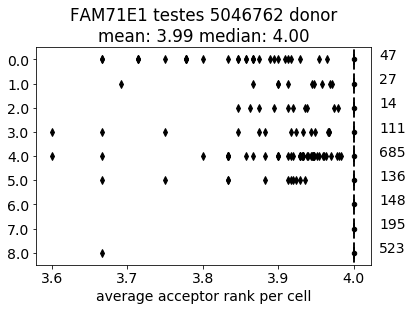

ranks 4.0    9
2.0    7
3.0    4
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50467622_don_ann.png


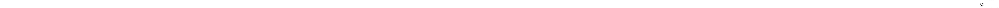

ann_dict {4: True, 2: True, 3: True, 1: True}


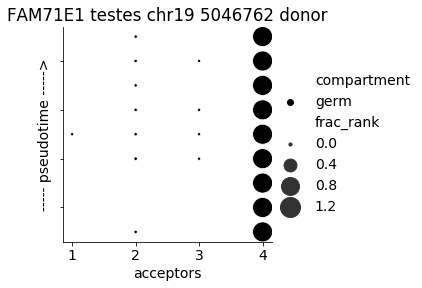

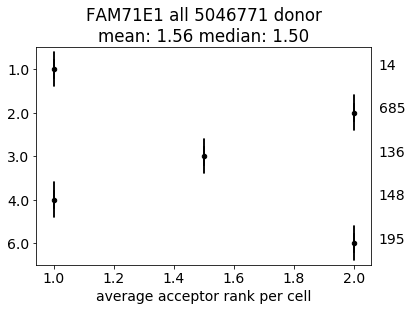

ranks 2.0    3
1.0    3
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50467711_don_ann.png


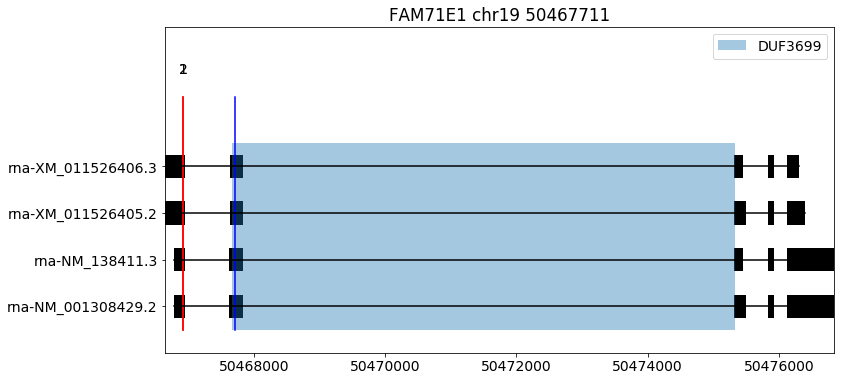

ann_dict {1: True, 2: True}


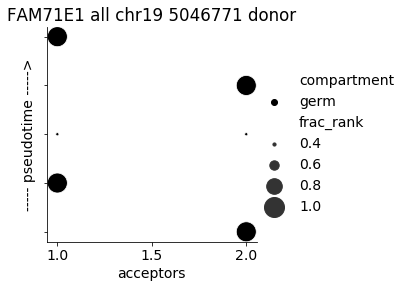

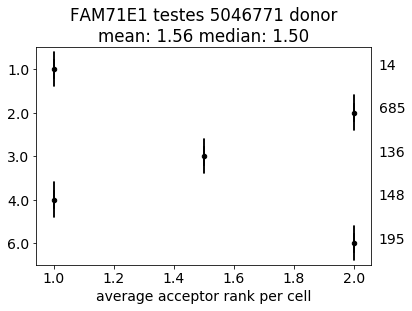

ranks 2.0    3
1.0    3
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50467711_don_ann.png


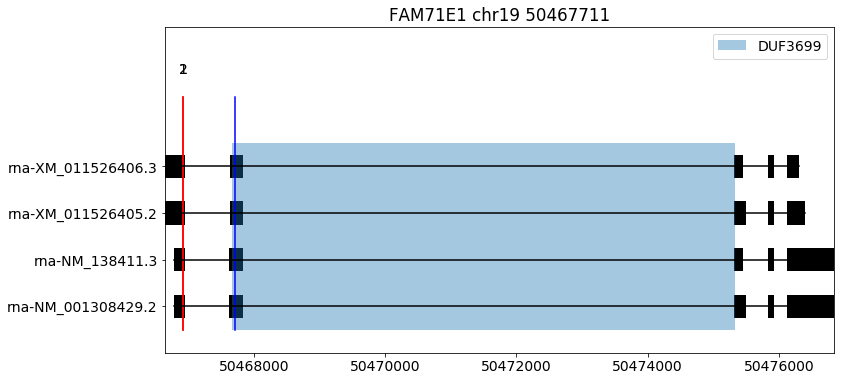

ann_dict {1: True, 2: True}


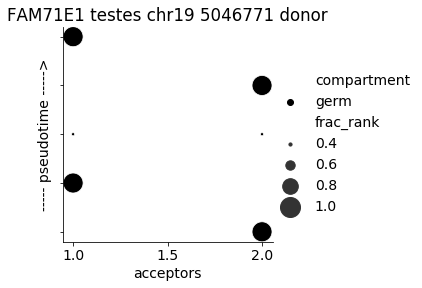

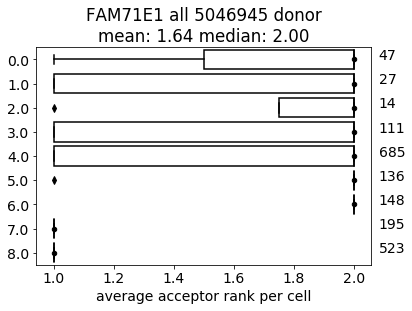

ranks 1.0    8
2.0    7
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50469452_don_ann.png


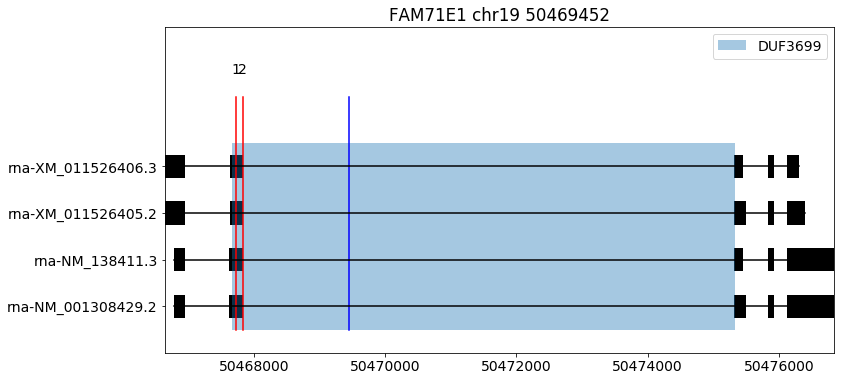

ann_dict {2: True, 1: True}


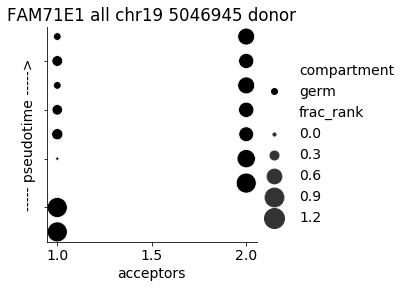

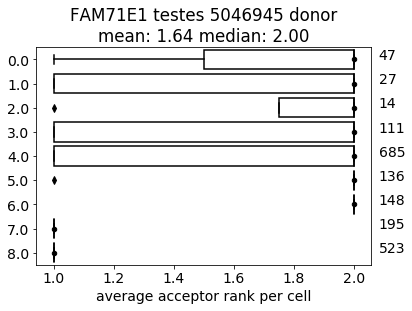

ranks 1.0    8
2.0    7
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50469452_don_ann.png


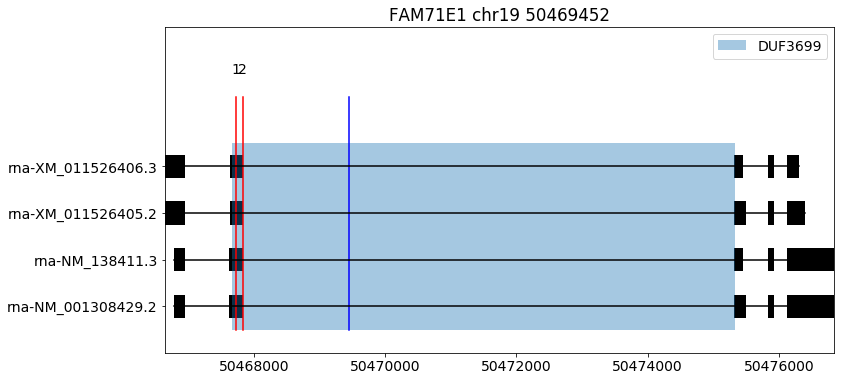

ann_dict {2: True, 1: True}


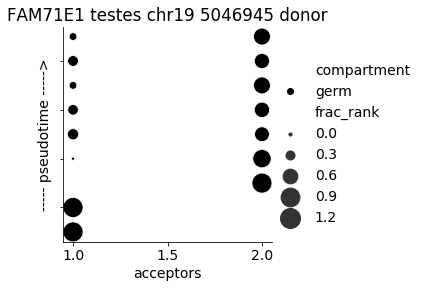

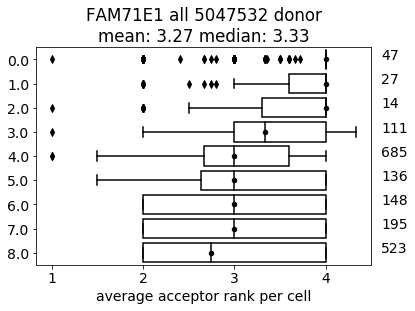

ranks 2.0    9
4.0    9
1.0    7
3.0    3
6.0    3
5.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50475325_don_ann.png


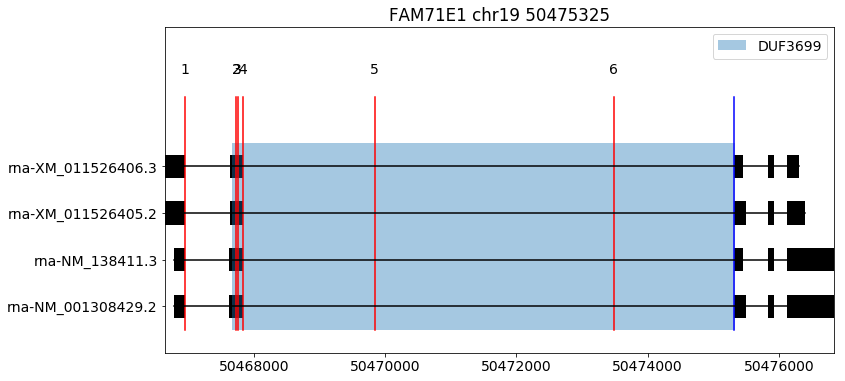

ann_dict {4: True, 2: True, 1: True, 6: True, 3: True, 5: True}


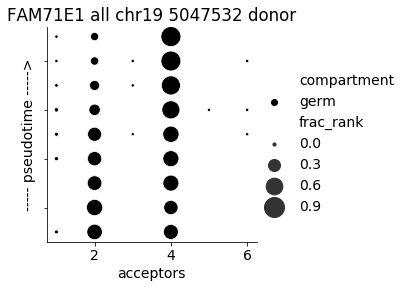

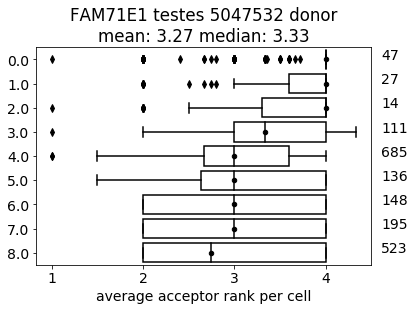

ranks 2.0    9
4.0    9
1.0    7
3.0    3
6.0    3
5.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50475325_don_ann.png


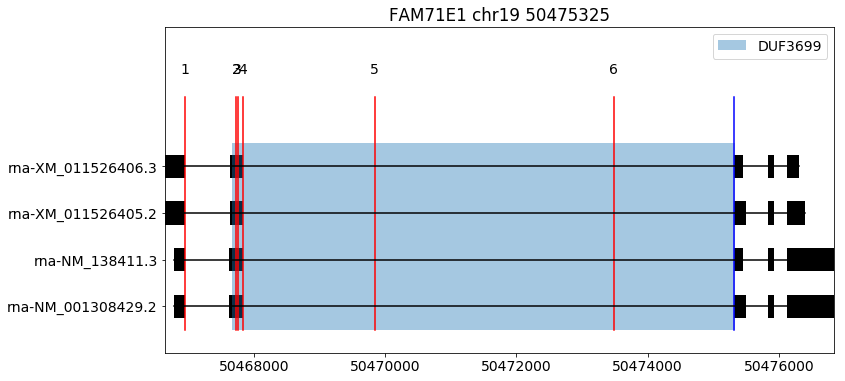

ann_dict {4: True, 2: True, 1: True, 6: True, 3: True, 5: True}


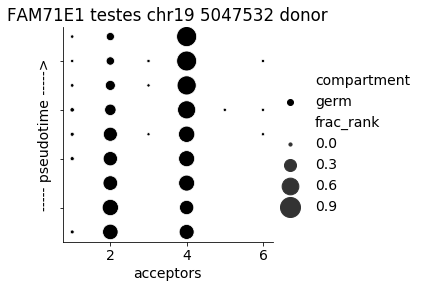

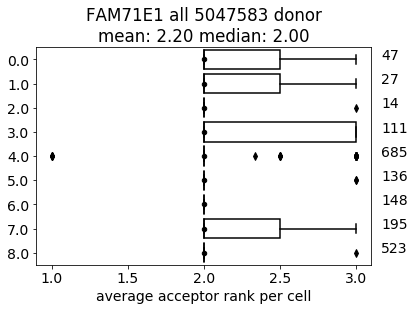

ranks 2.0    9
3.0    8
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50475833_don_ann.png


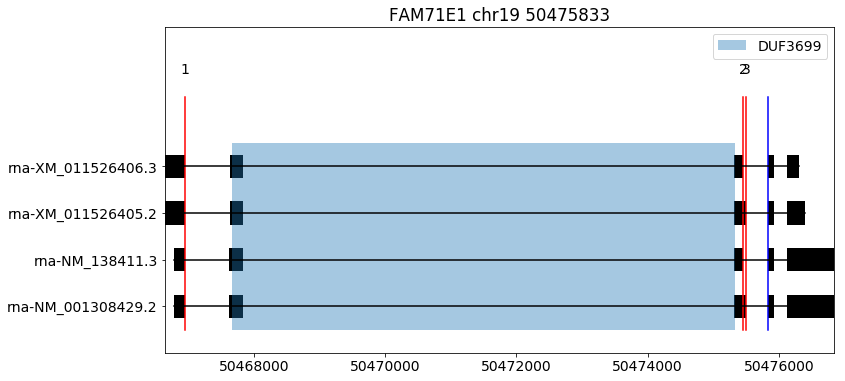

ann_dict {2: True, 3: True, 1: True}


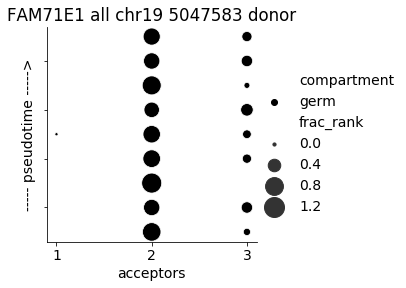

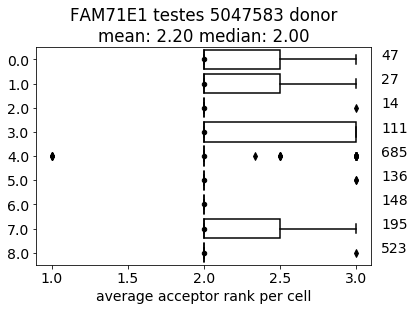

ranks 2.0    9
3.0    8
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50475833_don_ann.png


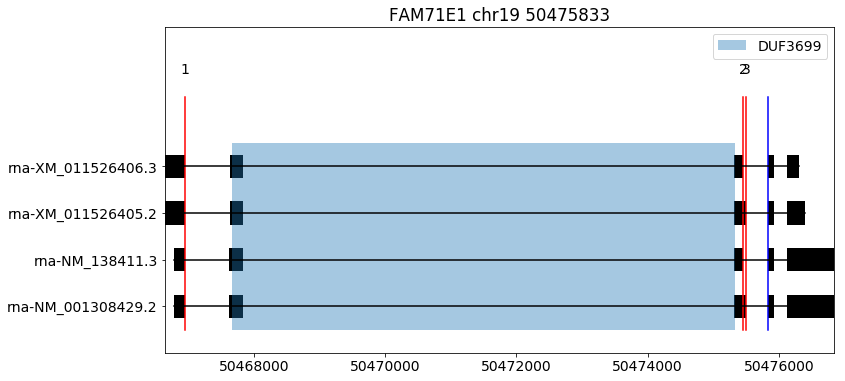

ann_dict {2: True, 3: True, 1: True}


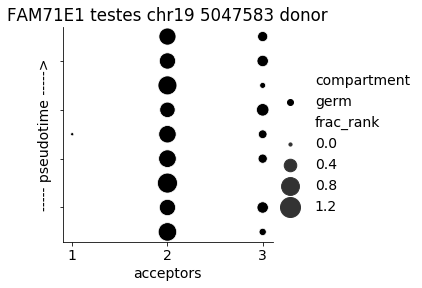

 20%|██        | 1/5 [00:38<02:34, 38.66s/it]

gene MLF1


0    3227
4    2879
8    1671
1     992
2     817
3     704
5     504
7     164
6     144
Name: binned_pt, dtype: int64

size before sub (11102, 30)


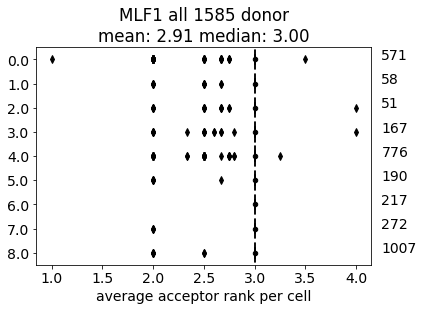

ranks 3.0    9
2.0    8
4.0    4
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158571347_don_ann.png


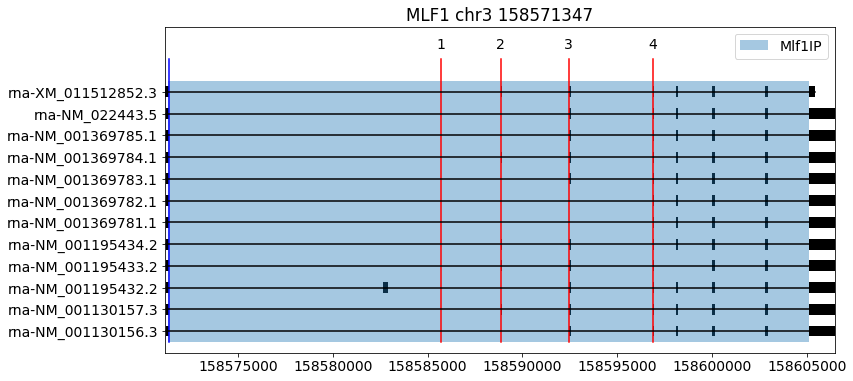

ann_dict {3: True, 2: True, 4: True, 1: True}


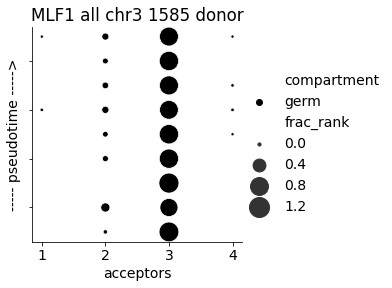

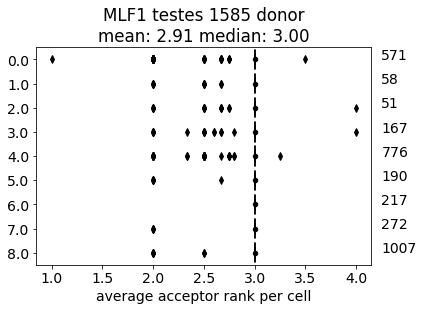

ranks 3.0    9
2.0    8
4.0    4
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158571347_don_ann.png


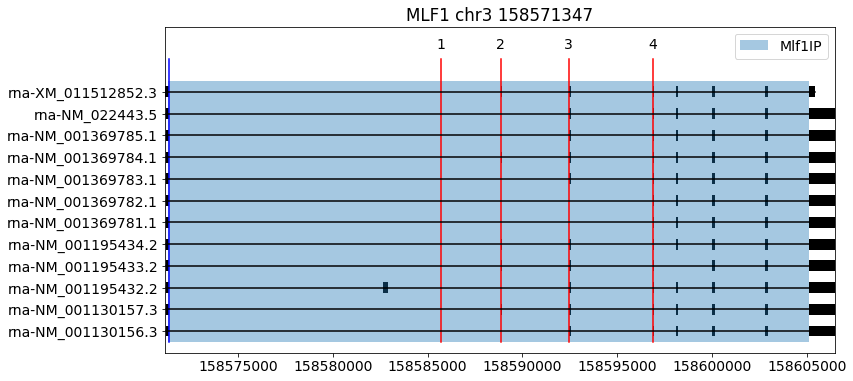

ann_dict {3: True, 2: True, 4: True, 1: True}


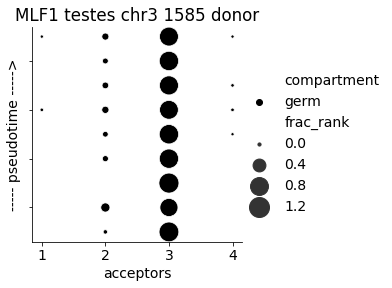

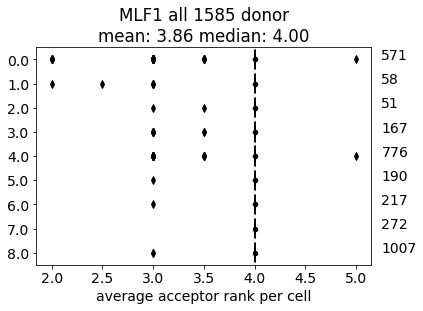

ranks 4.0    9
3.0    8
5.0    2
2.0    2
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158571391_don_ann.png


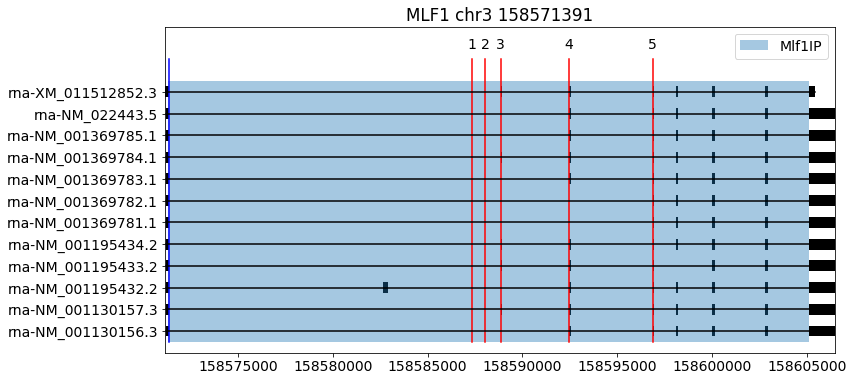

ann_dict {3: True, 4: True, 2: True, 1: True, 5: True}


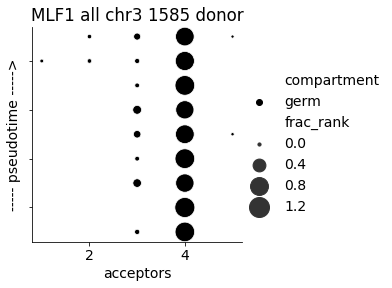

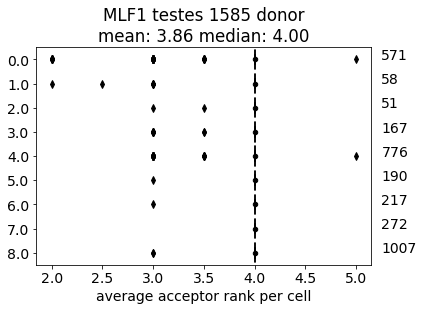

ranks 4.0    9
3.0    8
5.0    2
2.0    2
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158571391_don_ann.png


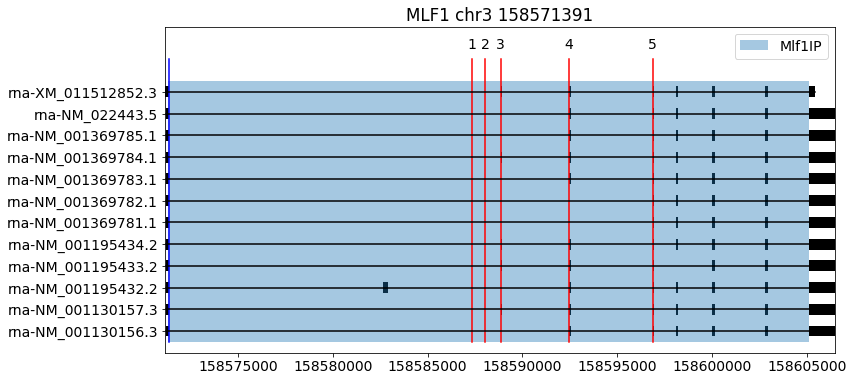

ann_dict {3: True, 4: True, 2: True, 1: True, 5: True}


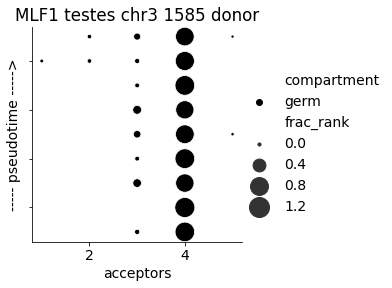

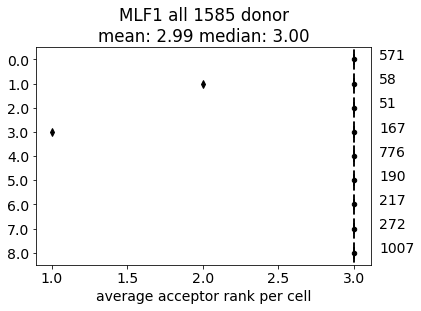

ranks 3.0    9
1.0    1
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158588924_don_ann.png


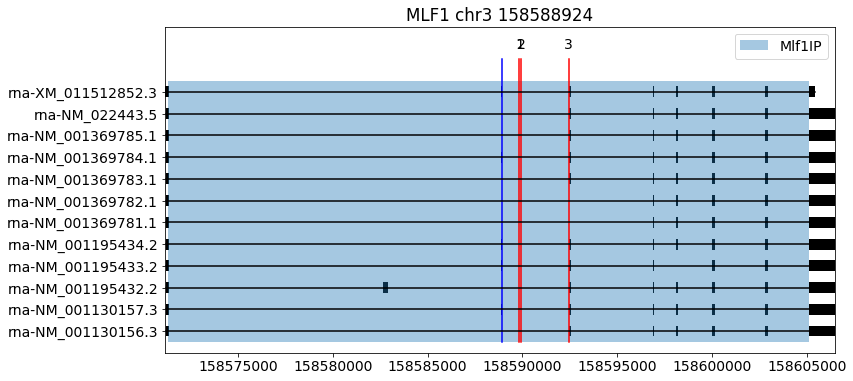

ann_dict {3: True, 2: True, 1: True}


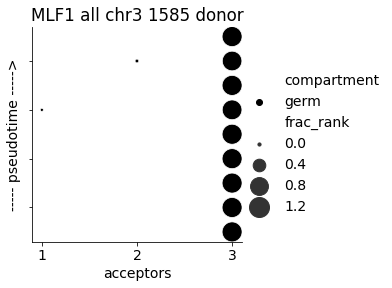

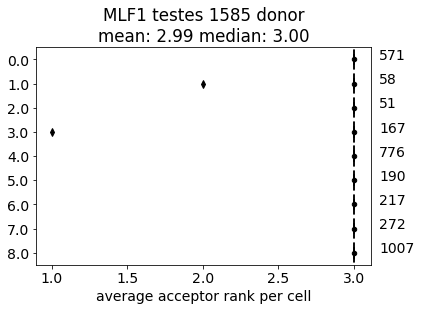

ranks 3.0    9
1.0    1
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158588924_don_ann.png


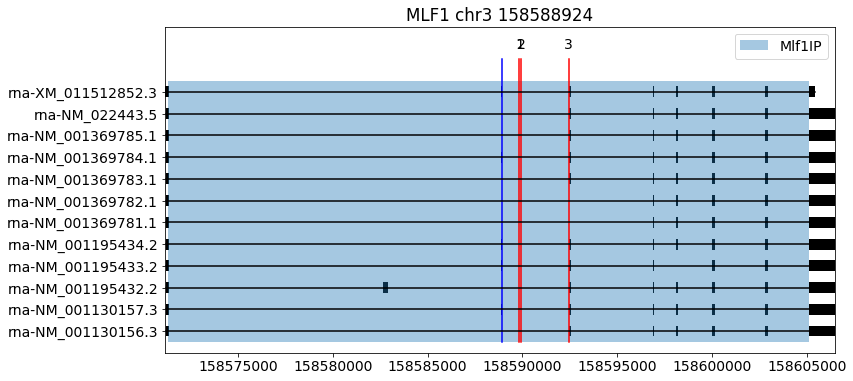

ann_dict {3: True, 2: True, 1: True}


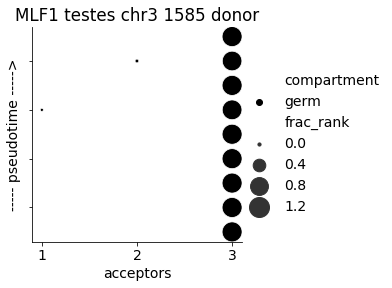

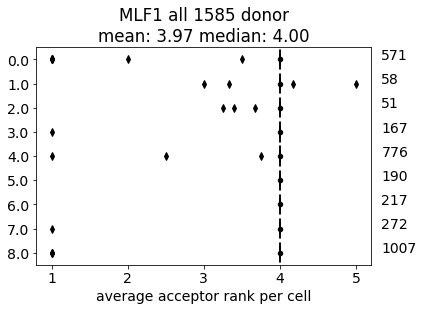

ranks 4.0    9
1.0    7
2.0    2
3.0    2
6.0    1
5.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158592581_don_ann.png


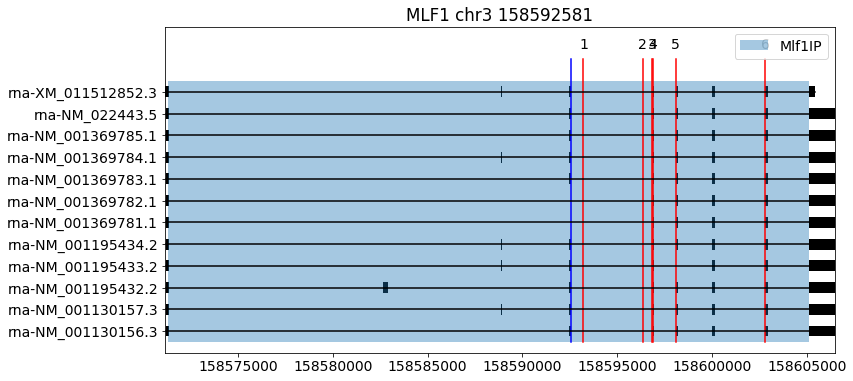

ann_dict {4: True, 1: True, 3: True, 5: True, 2: True, 6: True}


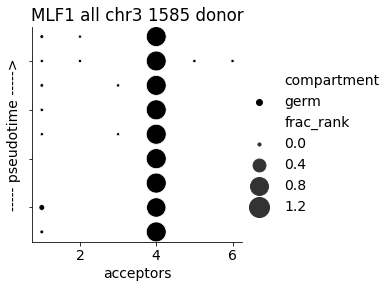

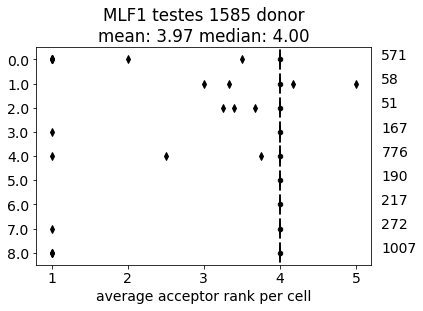

ranks 4.0    9
1.0    7
2.0    2
3.0    2
6.0    1
5.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158592581_don_ann.png


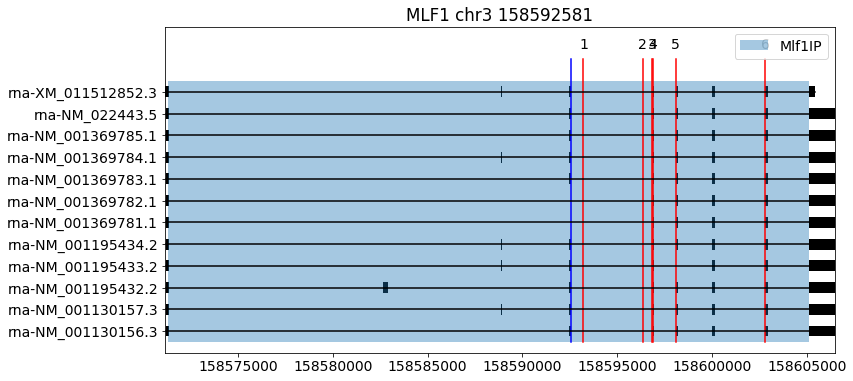

ann_dict {4: True, 1: True, 3: True, 5: True, 2: True, 6: True}


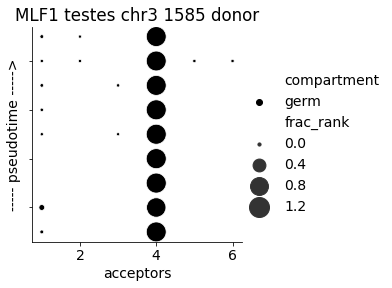

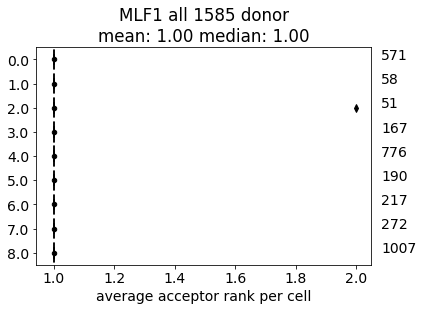

ranks 1.0    9
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158596945_don_ann.png


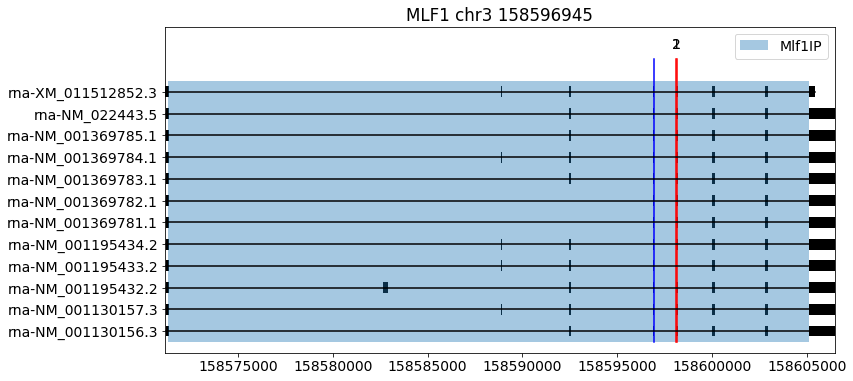

ann_dict {1: True, 2: True}


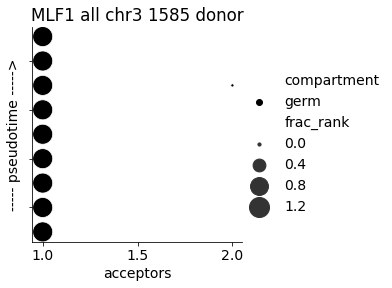

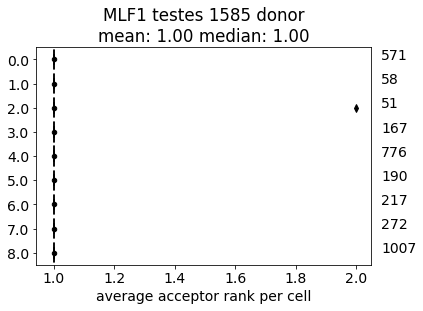

ranks 1.0    9
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158596945_don_ann.png


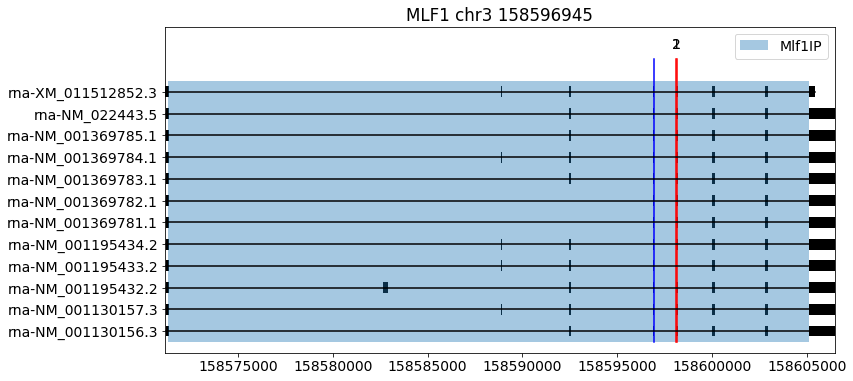

ann_dict {1: True, 2: True}


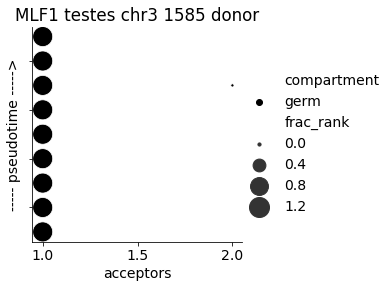

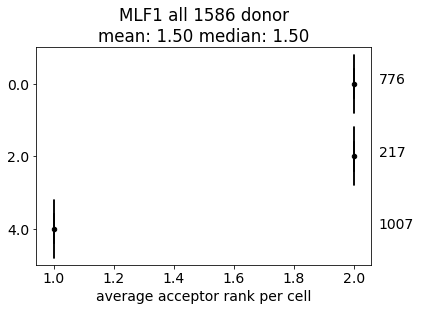

ranks 2.0    2
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158600172_don_ann.png


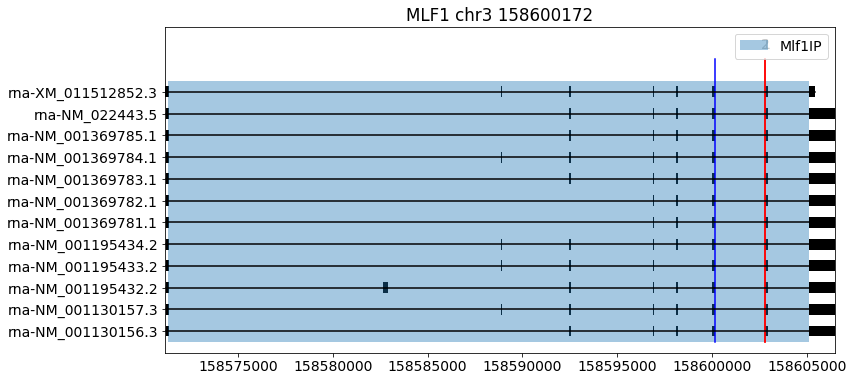

ann_dict {2: True, 1: True}


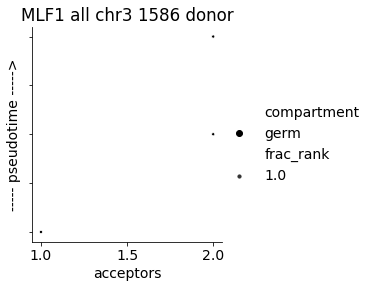

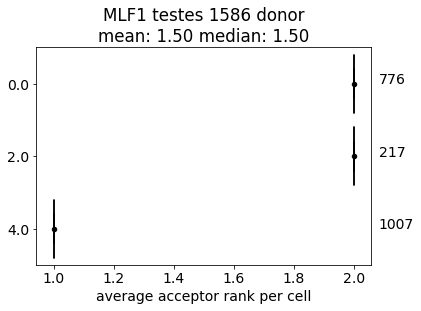

ranks 2.0    2
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158600172_don_ann.png


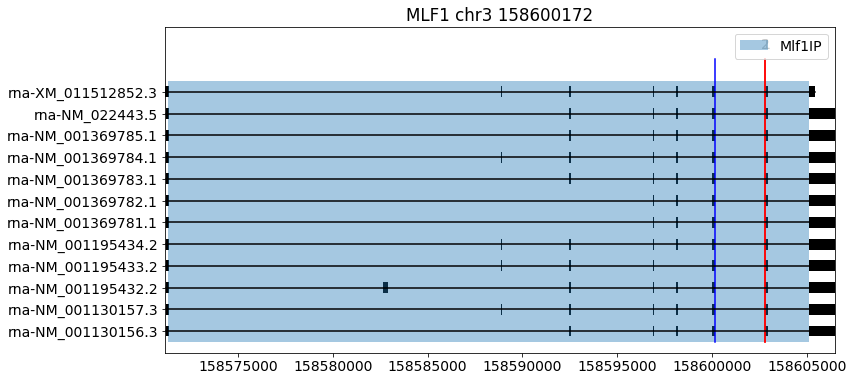

ann_dict {2: True, 1: True}


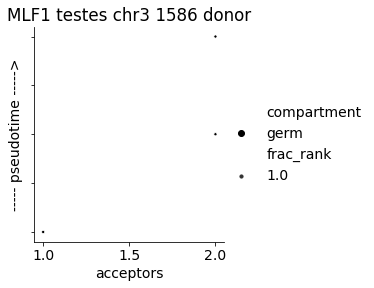

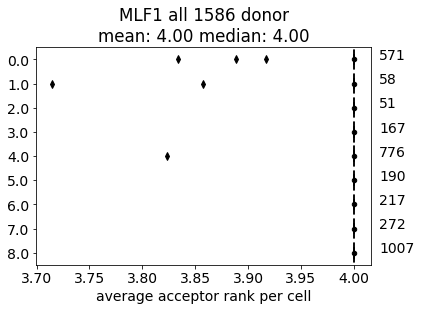

ranks 4.0    9
1.0    2
2.0    1
3.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158600173_don_ann.png


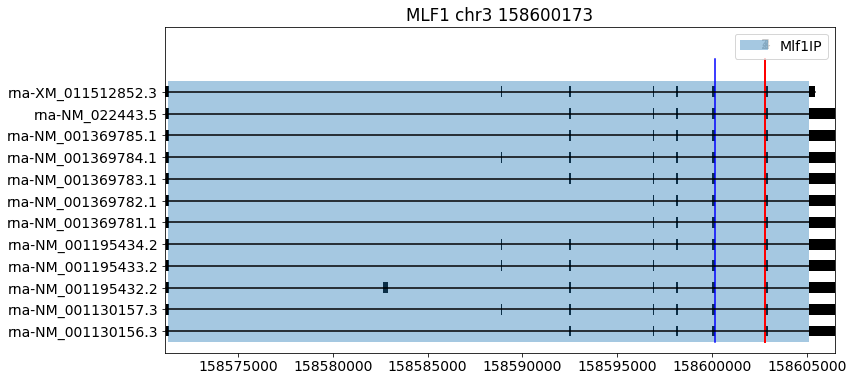

ann_dict {4: True, 1: True, 3: True, 2: True}


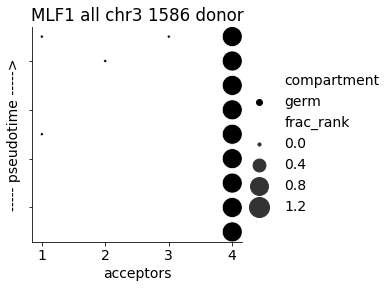

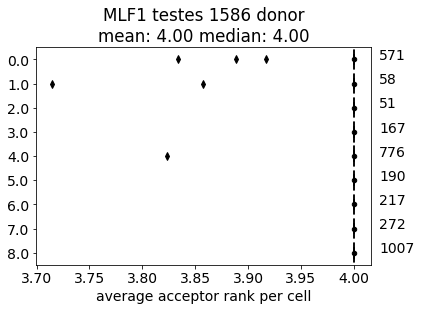

ranks 4.0    9
1.0    2
2.0    1
3.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158600173_don_ann.png


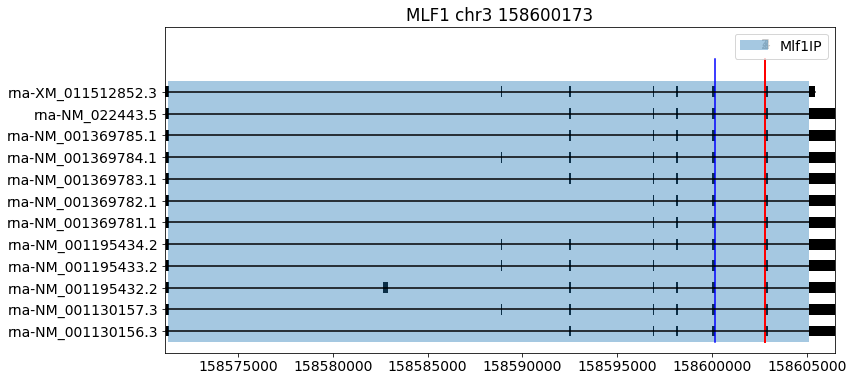

ann_dict {4: True, 1: True, 3: True, 2: True}


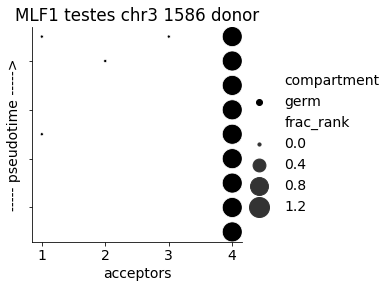

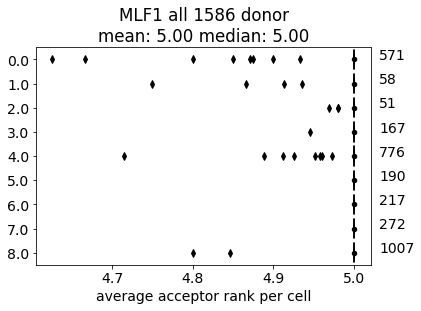

ranks 5.0    9
1.0    6
3.0    3
2.0    2
4.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158602939_don_ann.png


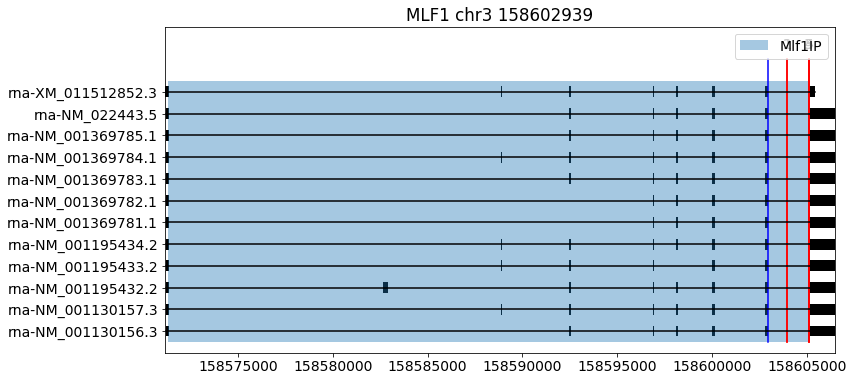

ann_dict {5: True, 2: True, 3: True, 1: True, 4: True}


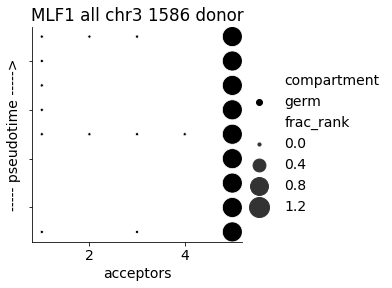

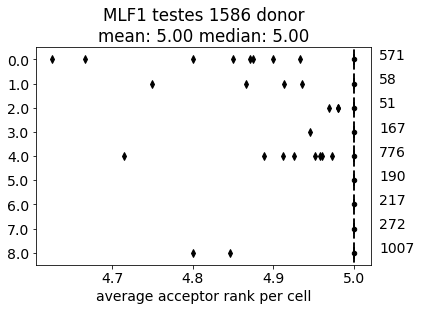

ranks 5.0    9
1.0    6
3.0    3
2.0    2
4.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158602939_don_ann.png


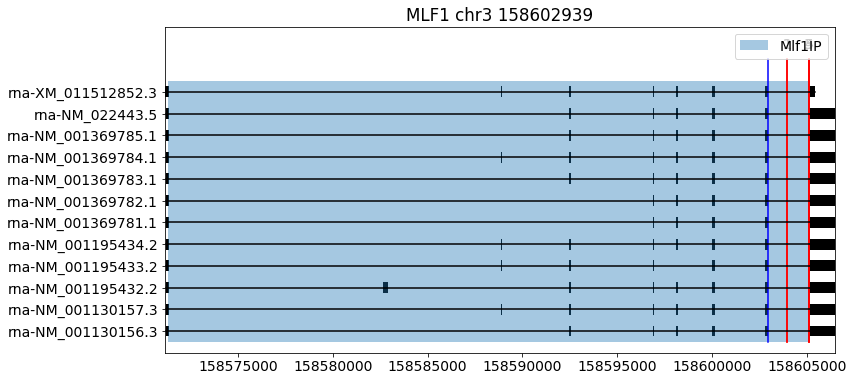

ann_dict {5: True, 2: True, 3: True, 1: True, 4: True}


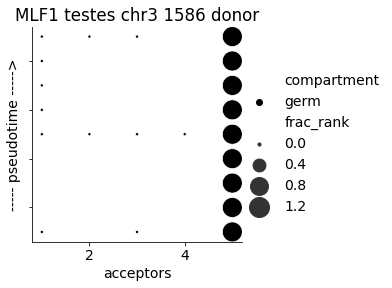

 40%|████      | 2/5 [01:29<02:06, 42.30s/it]

gene MTFR1


4    847
0    566
2    502
1    489
3    415
5      0
6      0
7      0
8      0
Name: binned_pt, dtype: int64

size before sub (2819, 30)


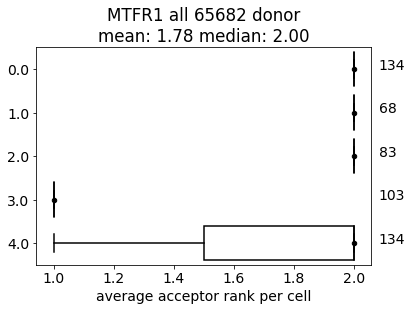

ranks 2.0    4
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65682451_don_ann.png


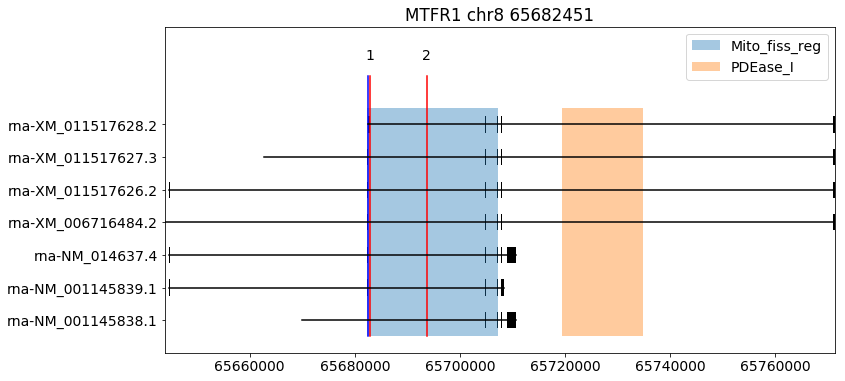

ann_dict {1: True, 2: True}


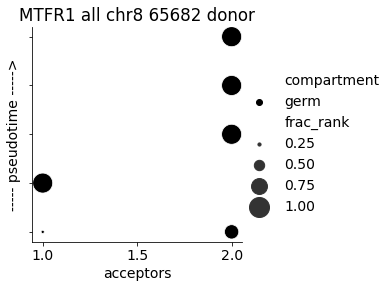

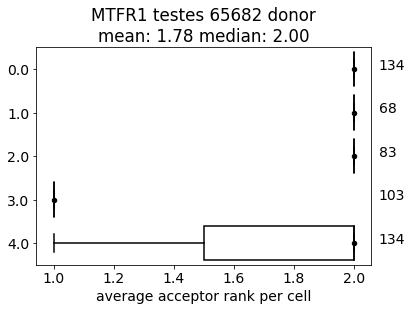

ranks 2.0    4
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65682451_don_ann.png


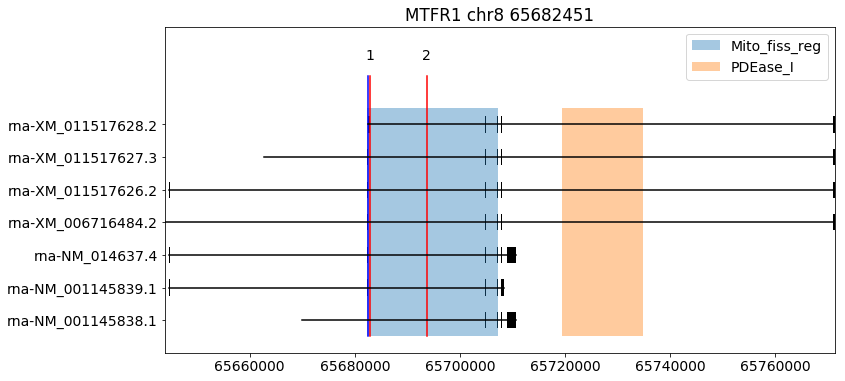

ann_dict {1: True, 2: True}


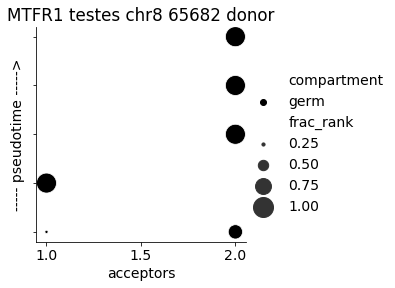

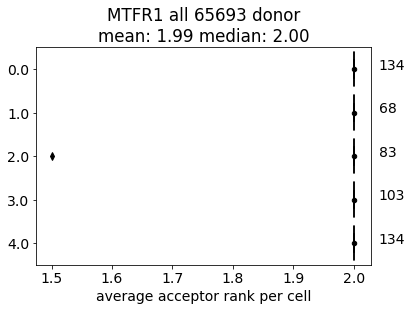

ranks 2.0    5
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65693759_don_ann.png


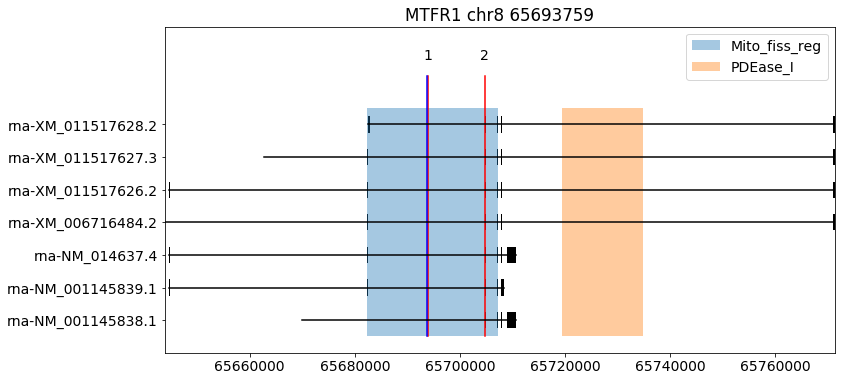

ann_dict {2: True, 1: True}


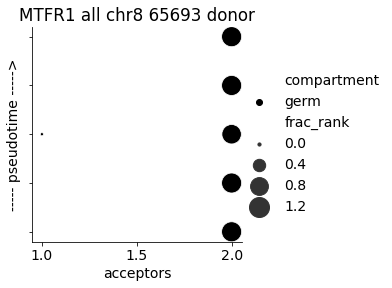

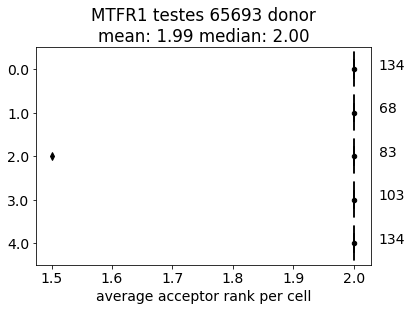

ranks 2.0    5
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65693759_don_ann.png


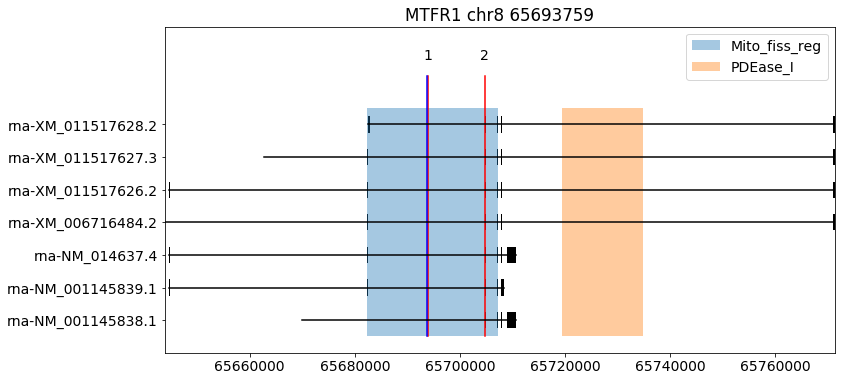

ann_dict {2: True, 1: True}


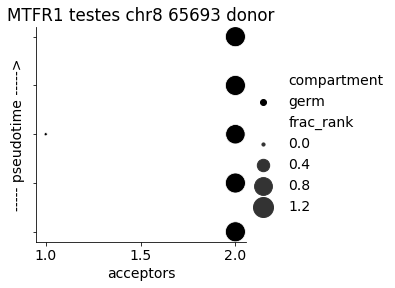

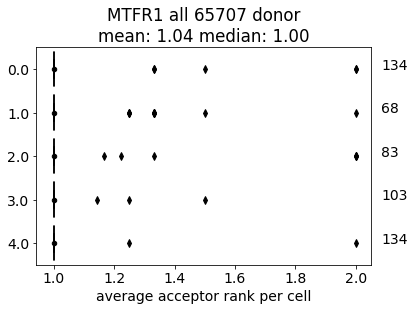

ranks 2.0    5
1.0    5
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65707256_don_ann.png


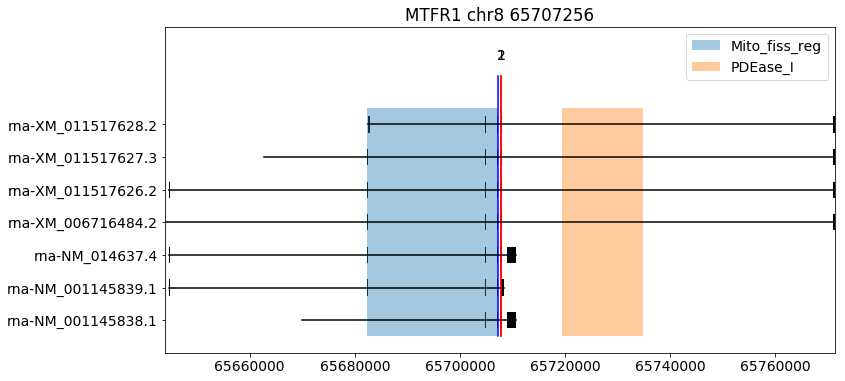

ann_dict {1: True, 2: True}


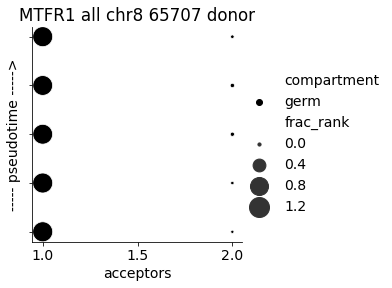

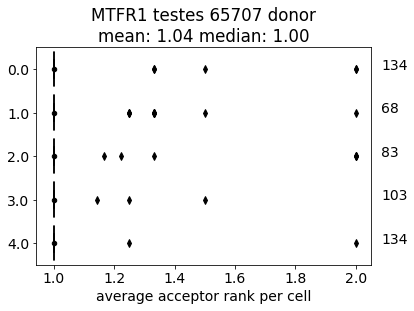

ranks 2.0    5
1.0    5
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65707256_don_ann.png


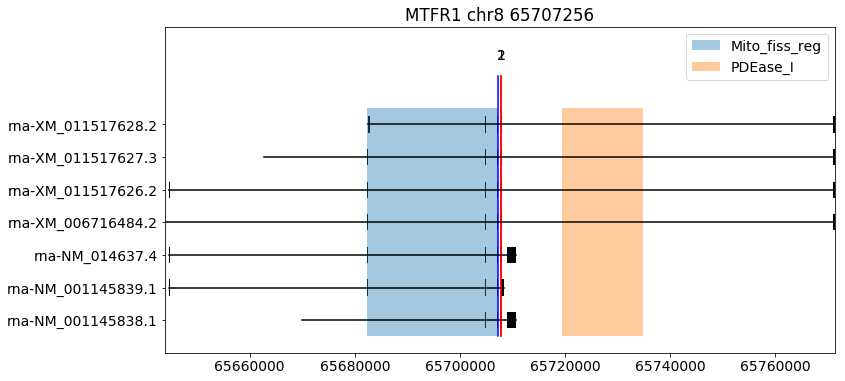

ann_dict {1: True, 2: True}


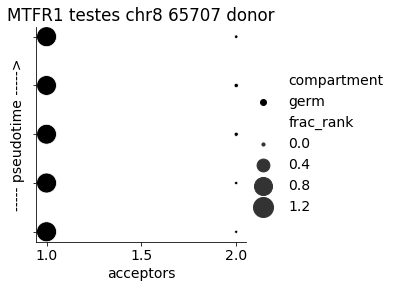

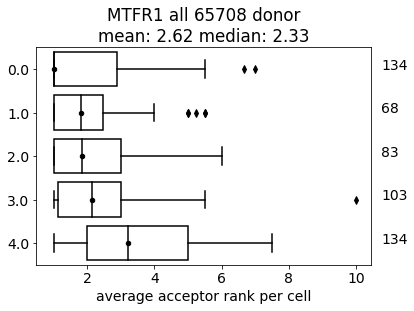

ranks 7.0     5
10.0    5
5.0     5
1.0     5
4.0     3
9.0     2
8.0     1
6.0     1
3.0     1
2.0     1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65708011_don_ann.png


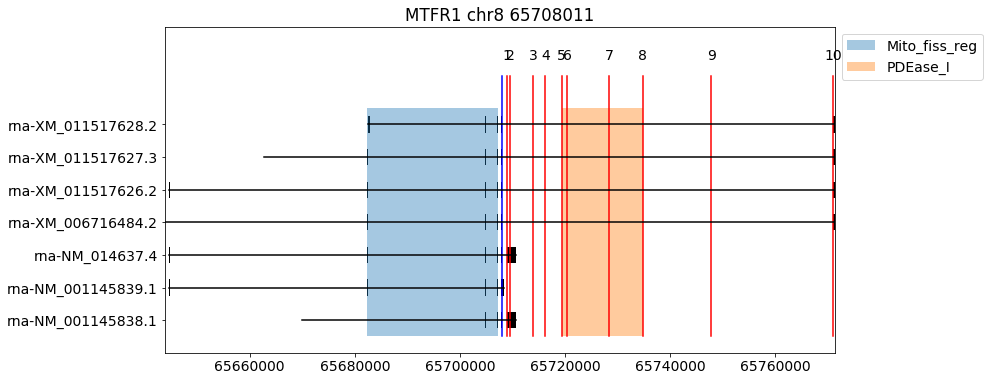

ann_dict {1: True, 5: True, 10: True, 7: True, 9: True, 4: True, 2: True, 3: True, 6: True, 8: True}


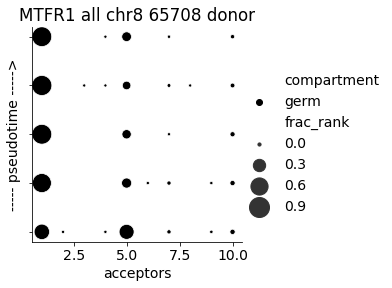

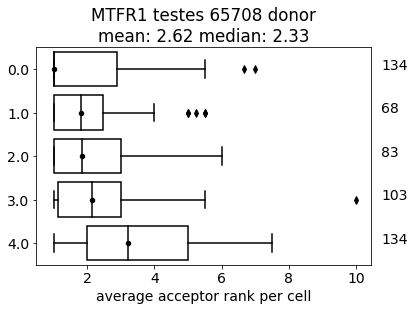

ranks 7.0     5
10.0    5
5.0     5
1.0     5
4.0     3
9.0     2
8.0     1
6.0     1
3.0     1
2.0     1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65708011_don_ann.png


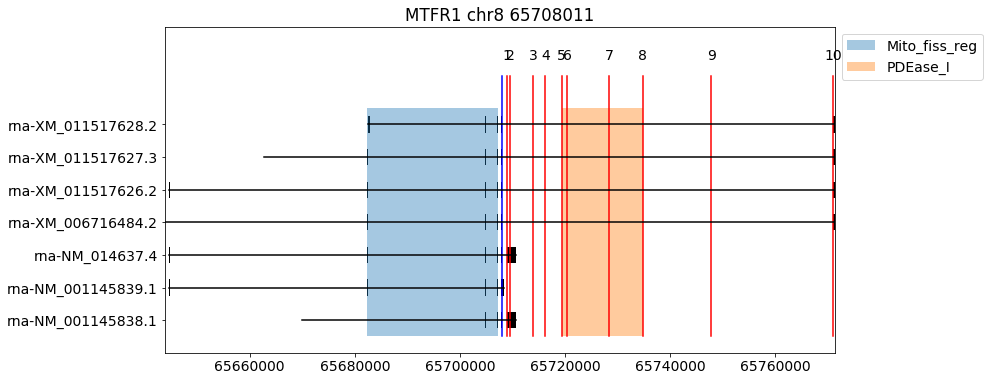

ann_dict {1: True, 5: True, 10: True, 7: True, 9: True, 4: True, 2: True, 3: True, 6: True, 8: True}


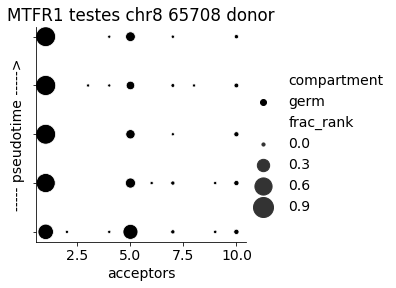

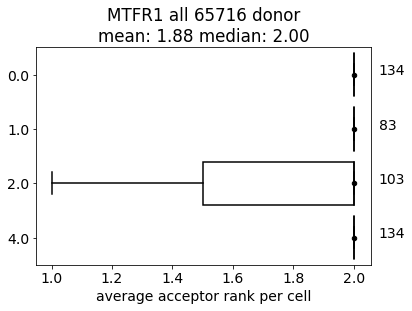

ranks 2.0    4
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65716369_don_ann.png


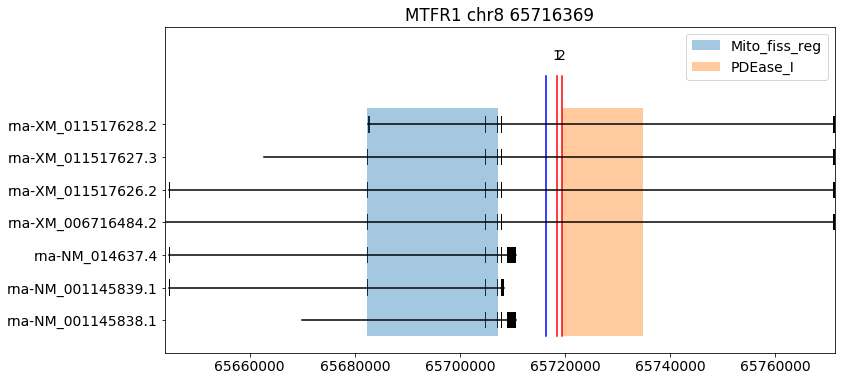

ann_dict {2: True, 1: True}


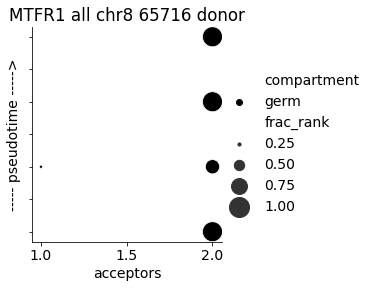

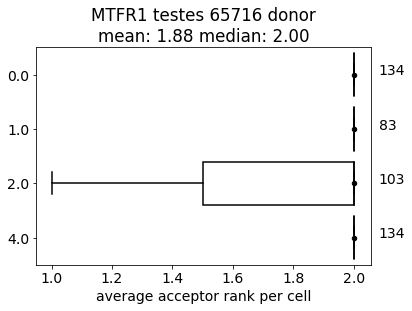

ranks 2.0    4
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65716369_don_ann.png


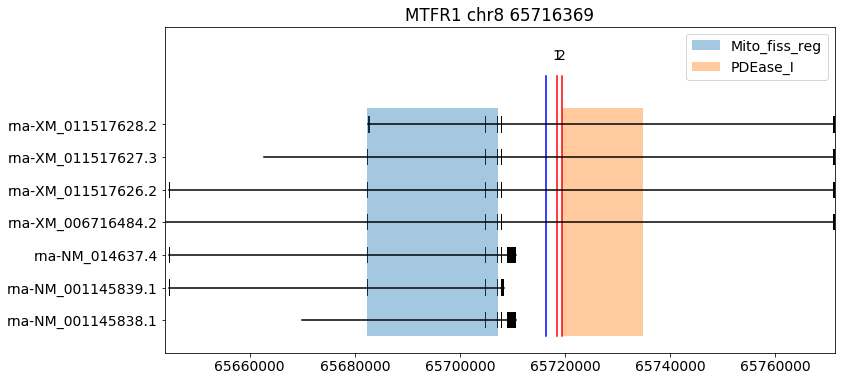

ann_dict {2: True, 1: True}


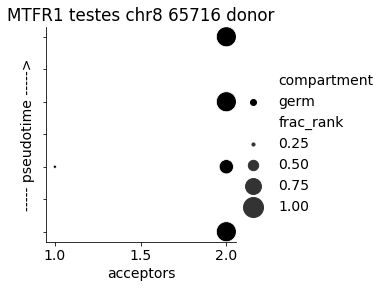

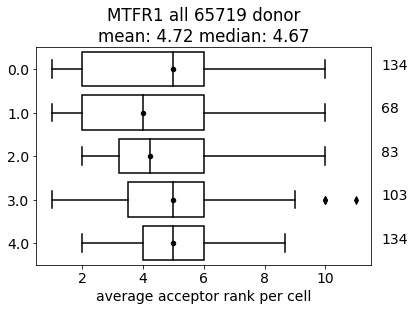

ranks 1.0     5
5.0     5
6.0     5
2.0     5
10.0    5
9.0     4
7.0     3
11.0    2
4.0     1
8.0     1
3.0     1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65719481_don_ann.png


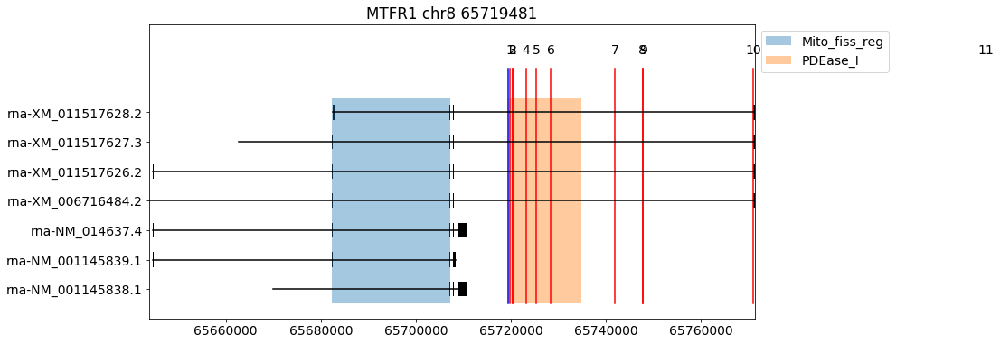

ann_dict {10: True, 2: True, 6: True, 5: True, 1: True, 7: True, 9: True, 11: True, 3: True, 8: True, 4: True}


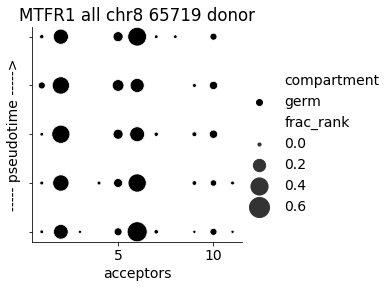

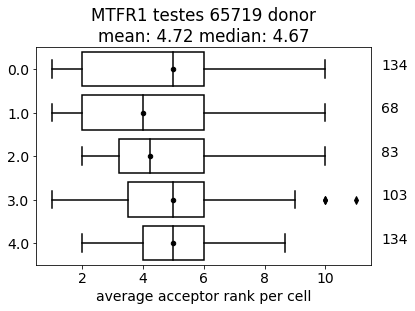

ranks 1.0     5
5.0     5
6.0     5
2.0     5
10.0    5
9.0     4
7.0     3
11.0    2
4.0     1
8.0     1
3.0     1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65719481_don_ann.png


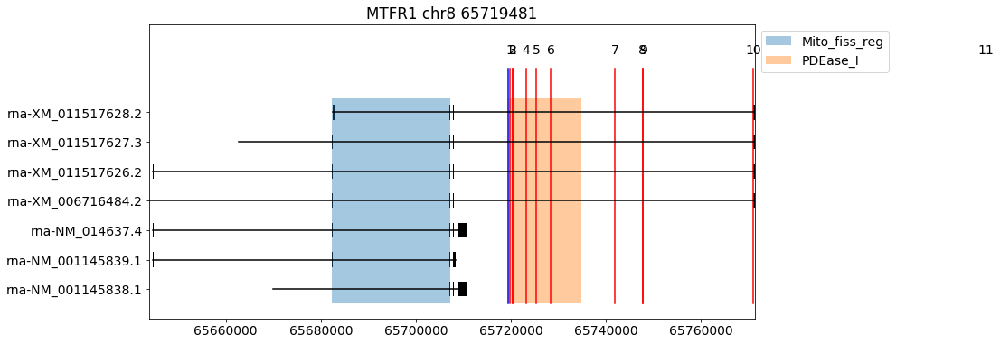

ann_dict {10: True, 2: True, 6: True, 5: True, 1: True, 7: True, 9: True, 11: True, 3: True, 8: True, 4: True}


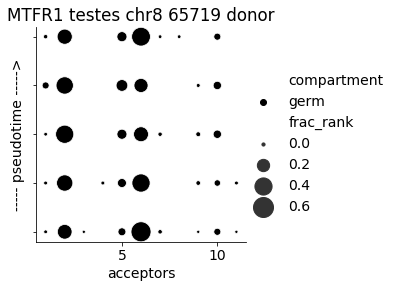

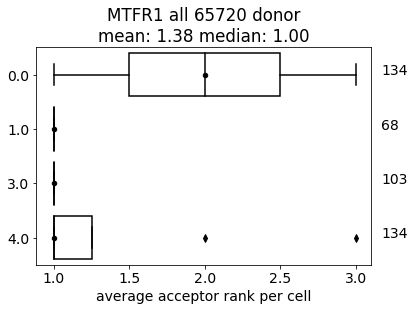

ranks 1.0    4
3.0    2
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65720512_don_ann.png


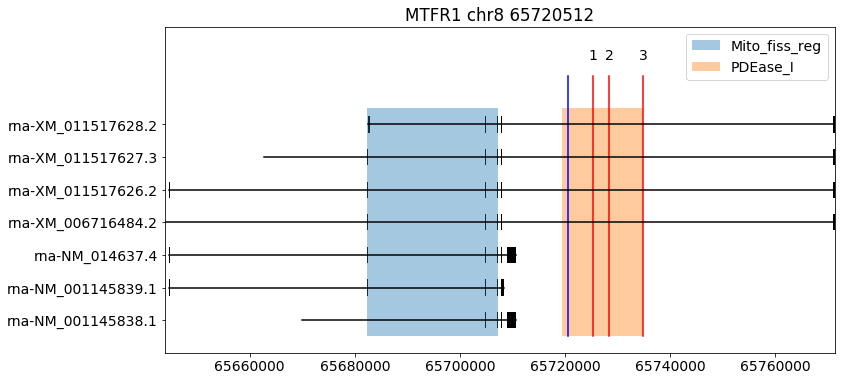

ann_dict {1: True, 3: True, 2: True}


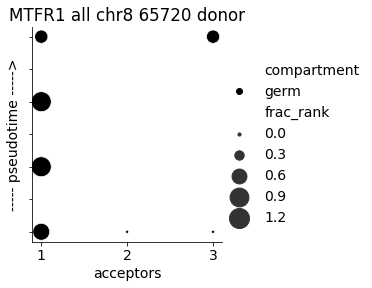

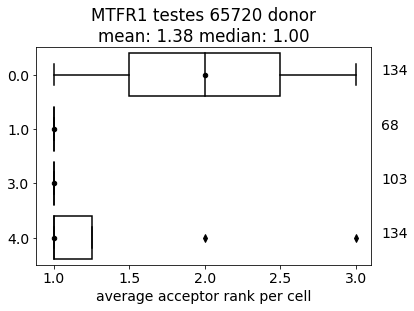

ranks 1.0    4
3.0    2
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65720512_don_ann.png


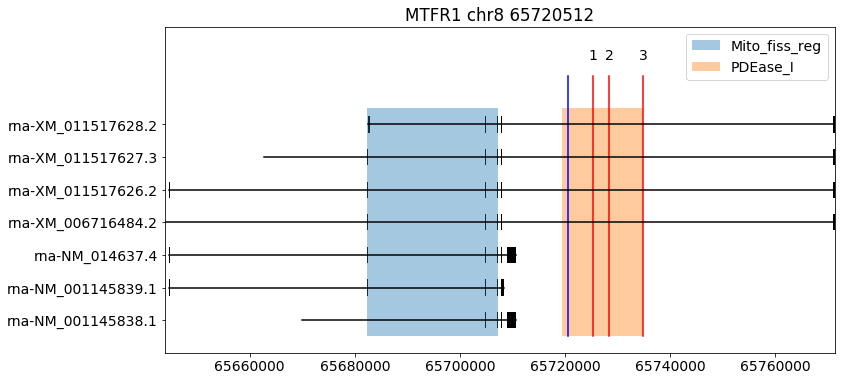

ann_dict {1: True, 3: True, 2: True}


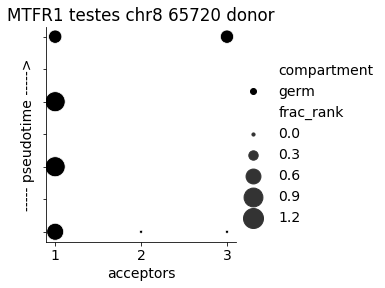

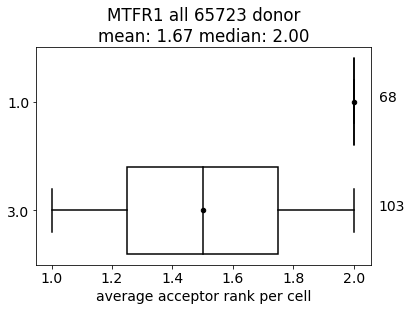

ranks 2.0    2
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65723407_don_ann.png


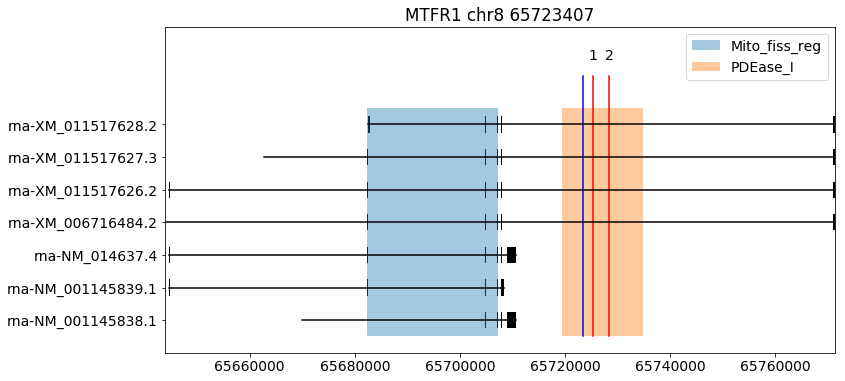

ann_dict {2: True, 1: True}


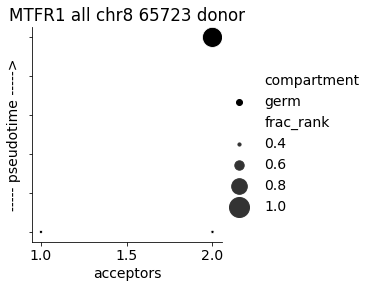

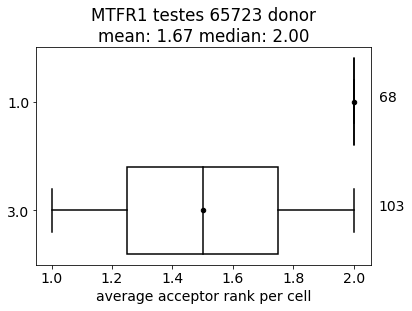

ranks 2.0    2
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65723407_don_ann.png


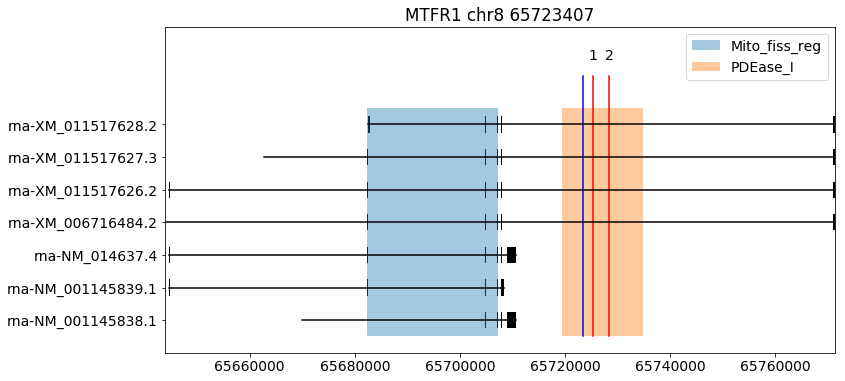

ann_dict {2: True, 1: True}


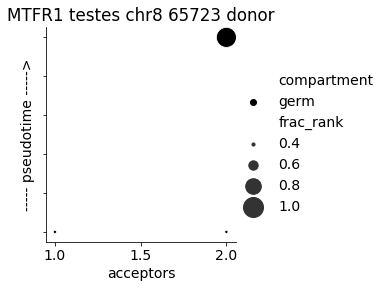

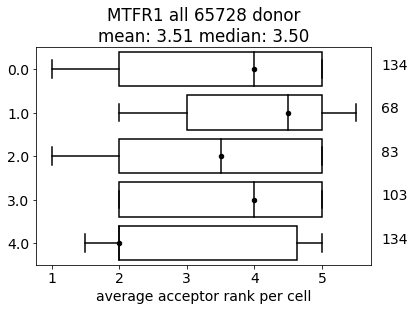

ranks 3.0    5
2.0    5
4.0    5
5.0    5
1.0    3
6.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65728450_don_ann.png


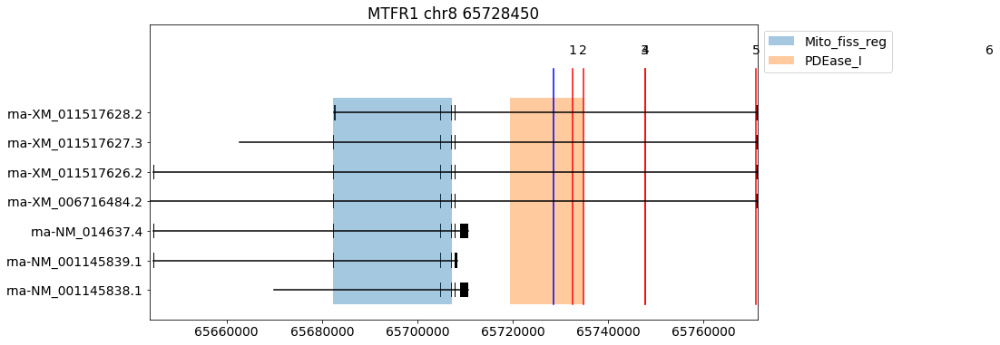

ann_dict {5: True, 4: True, 2: True, 1: True, 3: True, 6: True}


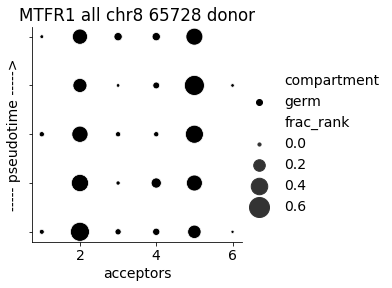

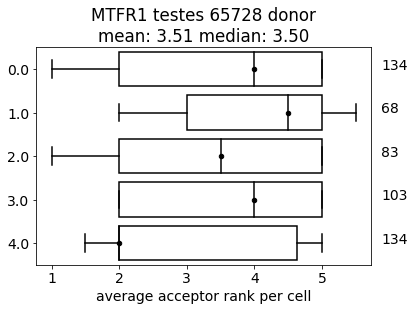

ranks 3.0    5
2.0    5
4.0    5
5.0    5
1.0    3
6.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65728450_don_ann.png


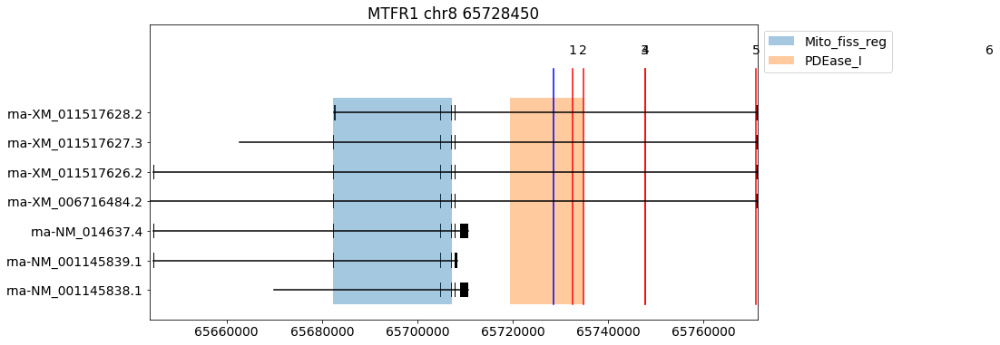

ann_dict {5: True, 4: True, 2: True, 1: True, 3: True, 6: True}


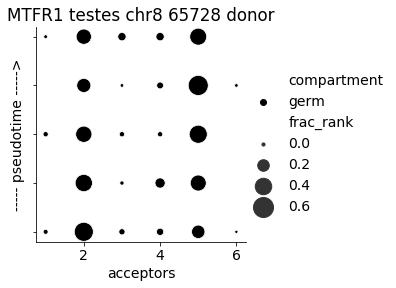

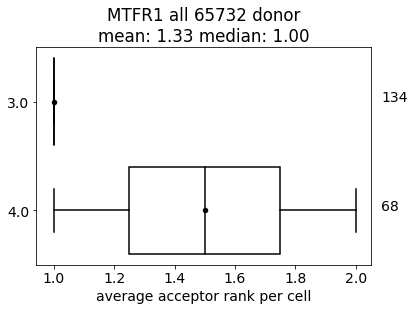

ranks 1.0    2
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65732656_don_ann.png


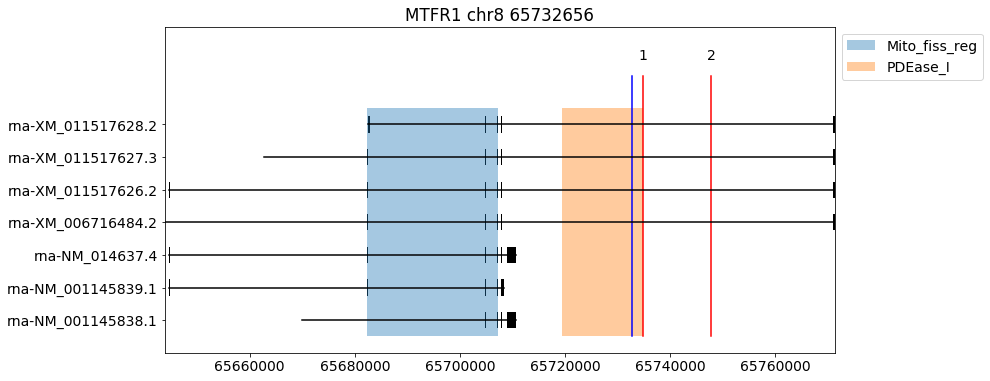

ann_dict {1: True, 2: True}


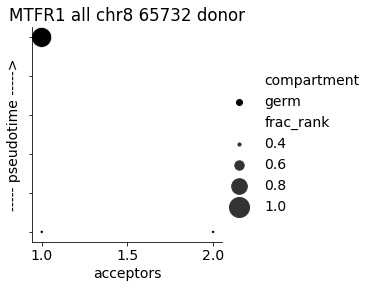

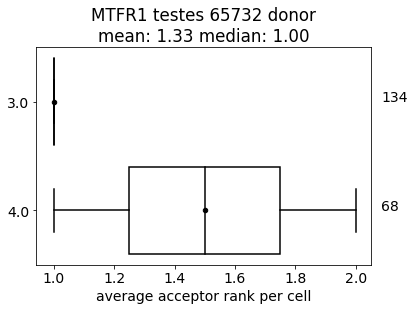

ranks 1.0    2
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65732656_don_ann.png


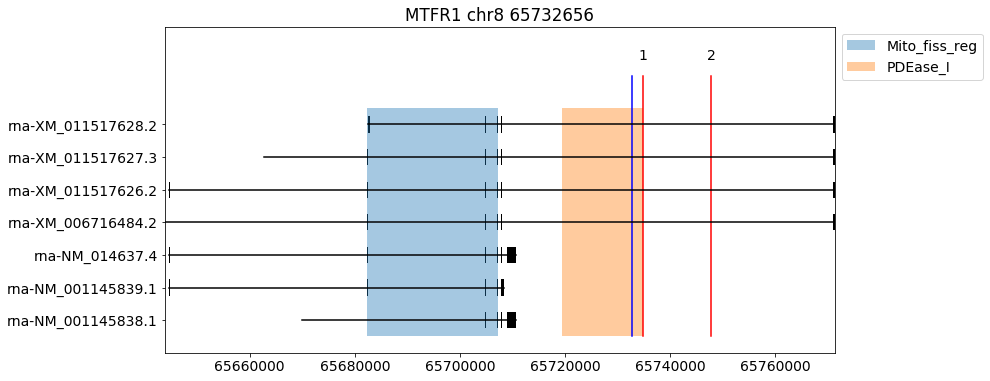

ann_dict {1: True, 2: True}


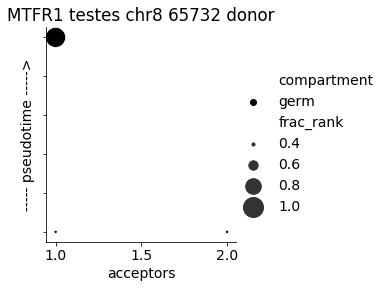

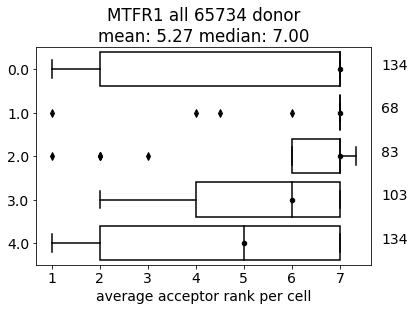

ranks 7.0    5
1.0    5
2.0    5
6.0    4
5.0    4
8.0    2
3.0    2
4.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65734856_don_ann.png


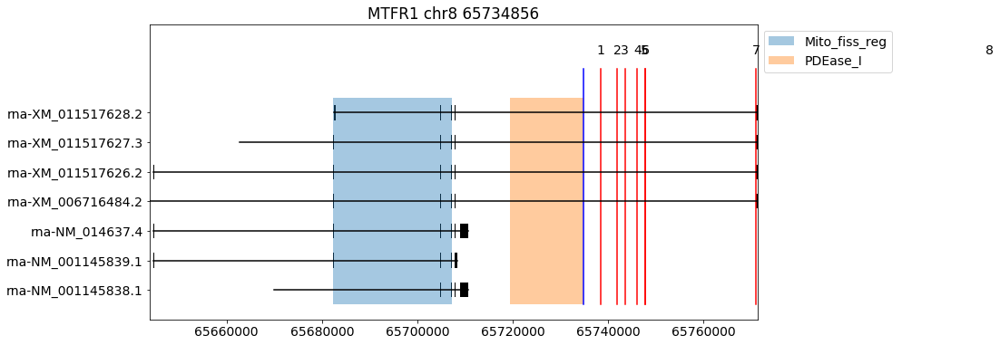

ann_dict {4: True, 2: True, 1: True, 7: True, 5: True, 3: True, 6: True, 8: True}


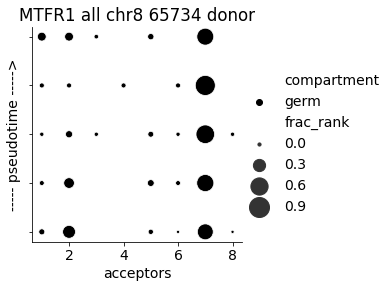

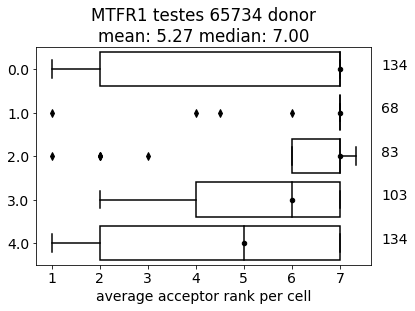

ranks 7.0    5
1.0    5
2.0    5
6.0    4
5.0    4
8.0    2
3.0    2
4.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65734856_don_ann.png


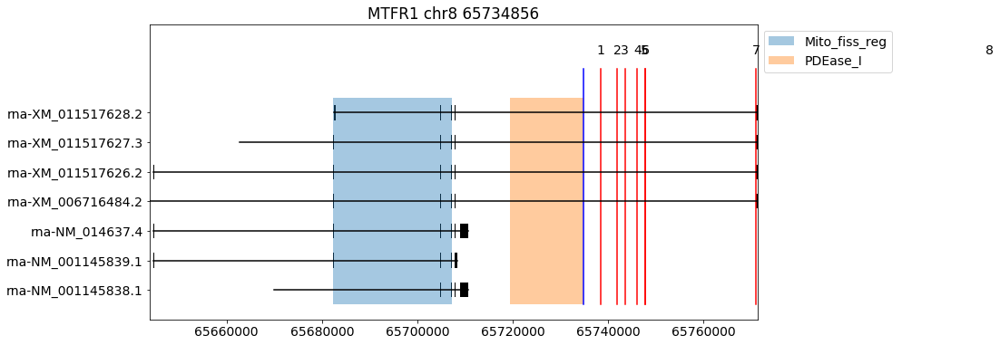

ann_dict {4: True, 2: True, 1: True, 7: True, 5: True, 3: True, 6: True, 8: True}


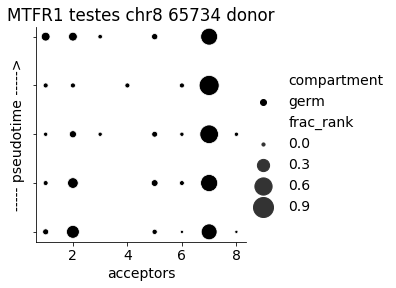

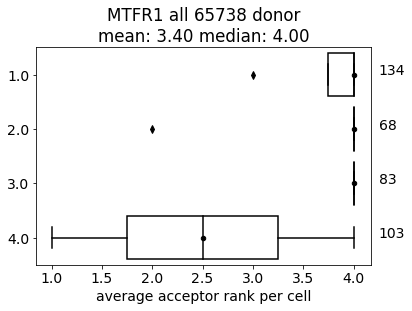

ranks 4.0    4
3.0    2
2.0    2
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65738592_don_ann.png


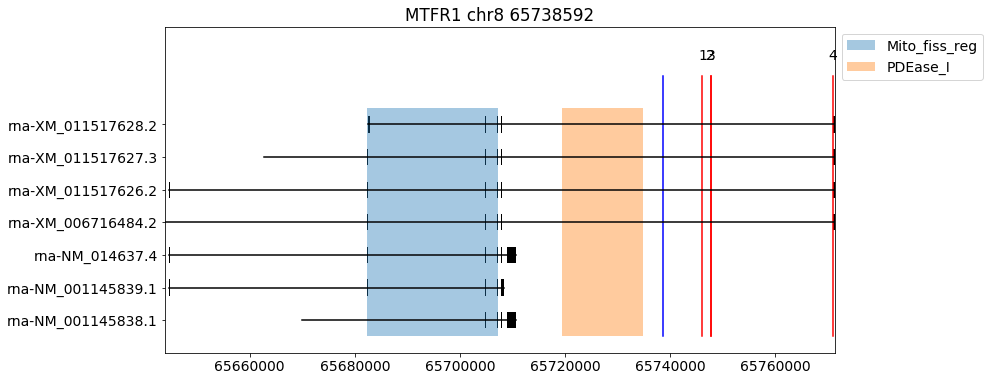

ann_dict {4: True, 2: True, 3: True, 1: True}


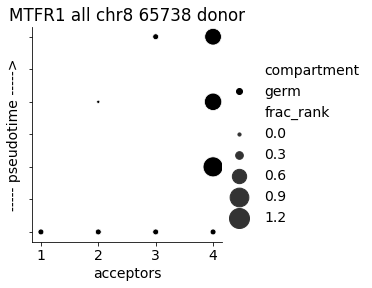

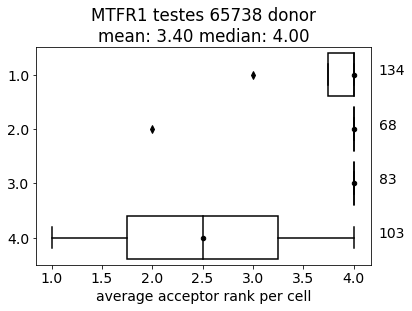

ranks 4.0    4
3.0    2
2.0    2
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65738592_don_ann.png


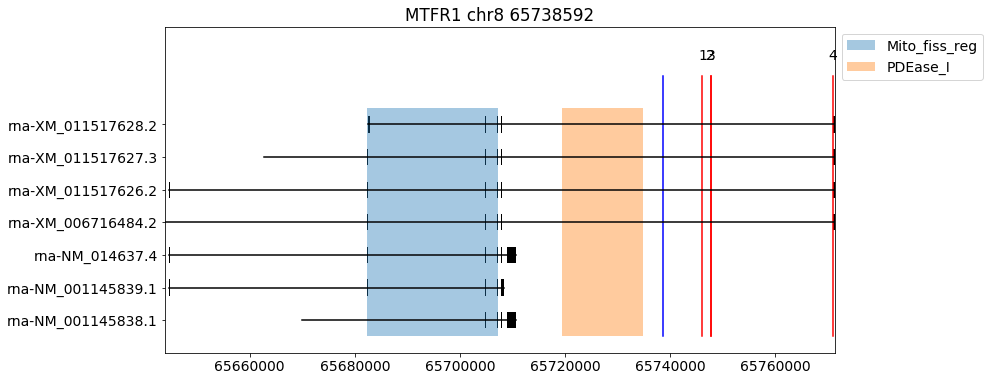

ann_dict {4: True, 2: True, 3: True, 1: True}


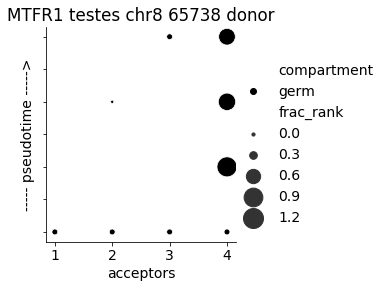

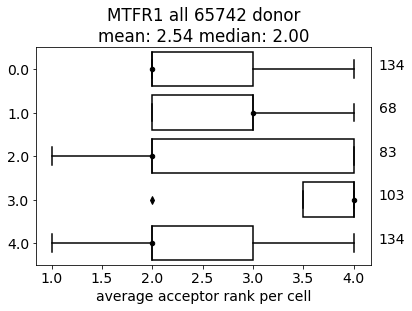

ranks 4.0    5
2.0    5
3.0    3
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65742037_don_ann.png


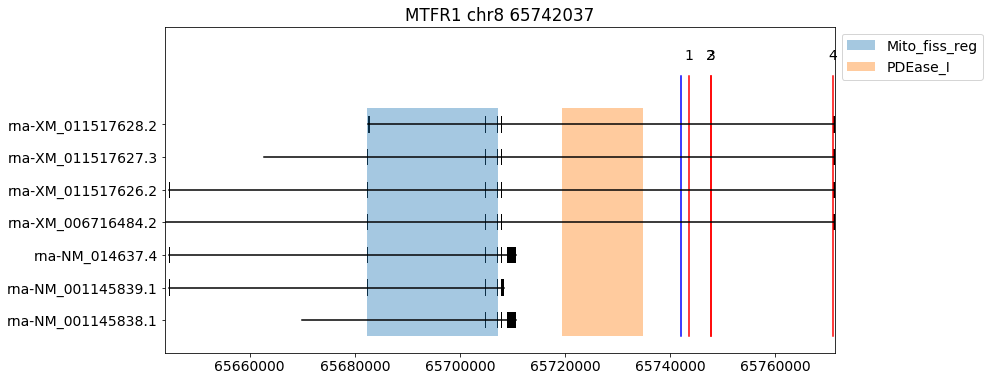

ann_dict {2: True, 4: True, 3: True, 1: True}


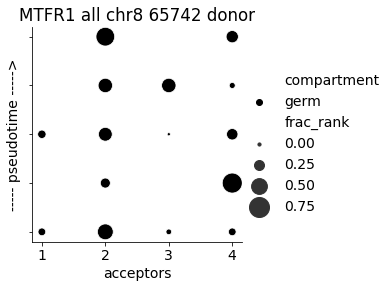

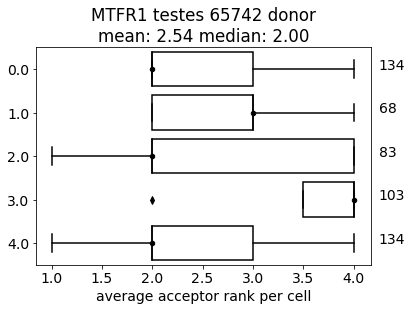

ranks 4.0    5
2.0    5
3.0    3
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65742037_don_ann.png


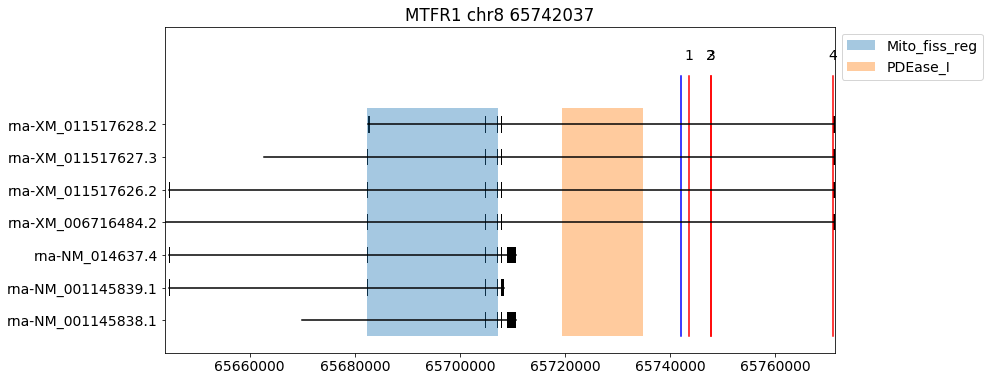

ann_dict {2: True, 4: True, 3: True, 1: True}


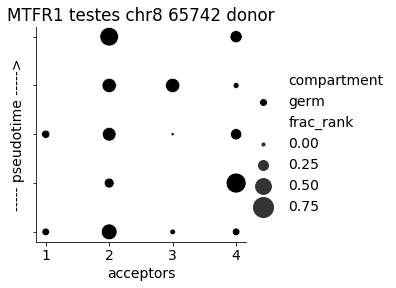

 60%|██████    | 3/5 [02:41<01:42, 51.25s/it]

gene SPATA42


0    657
4    485
3    281
1    227
2    212
5     42
6      0
7      0
8      0
Name: binned_pt, dtype: int64

size before sub (1904, 30)


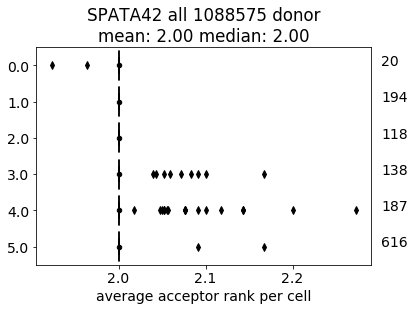

ranks 2.0    6
3.0    3
4.0    1
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/SPATA42/Spermatogenesis dataSPATA42_108857501_don_ann.png


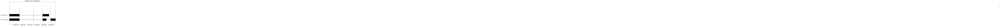

ann_dict {2: True, 3: True, 1: True, 4: True}


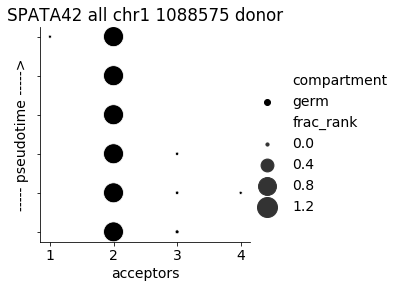

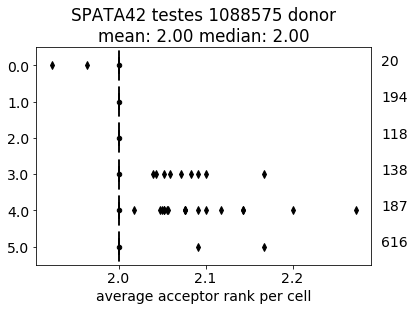

ranks 2.0    6
3.0    3
4.0    1
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/SPATA42/Spermatogenesis dataSPATA42_108857501_don_ann.png


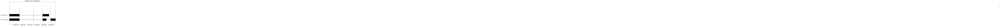

ann_dict {2: True, 3: True, 1: True, 4: True}


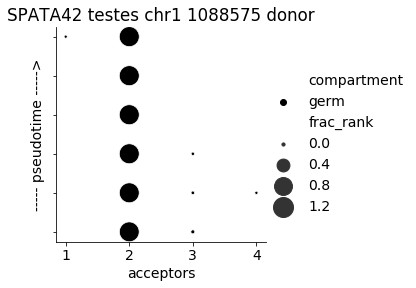

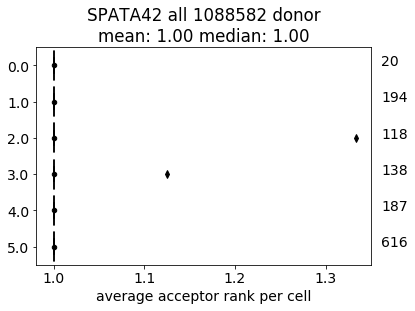

ranks 1.0    6
2.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/SPATA42/Spermatogenesis dataSPATA42_108858267_don_ann.png


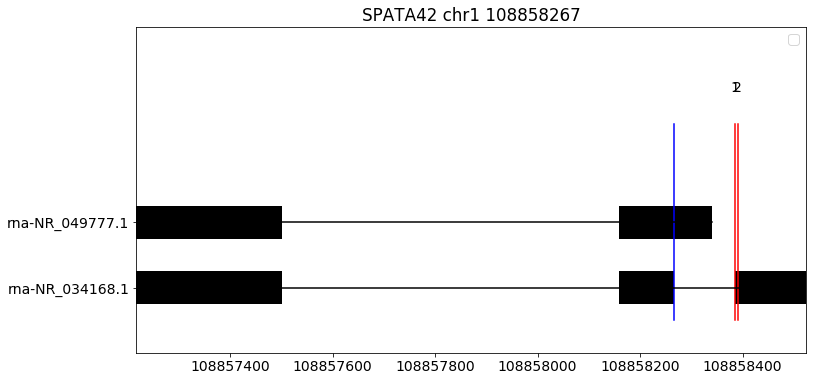

ann_dict {1: True, 2: True}


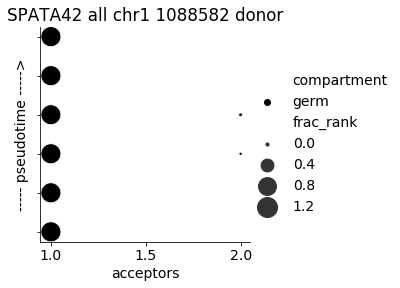

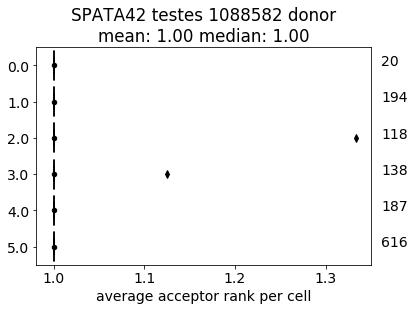

ranks 1.0    6
2.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/SPATA42/Spermatogenesis dataSPATA42_108858267_don_ann.png


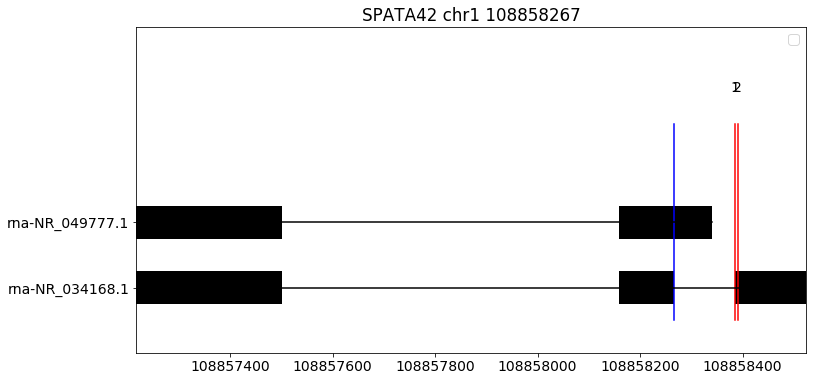

ann_dict {1: True, 2: True}


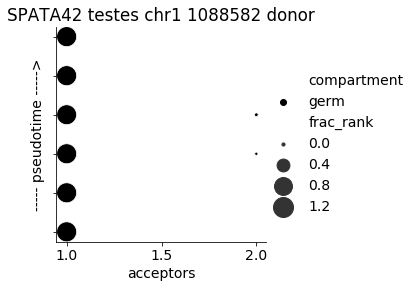

 80%|████████  | 4/5 [02:55<00:39, 39.93s/it]

gene TPPP2


4    1754
0    1205
1     567
2     465
3     407
5     228
6       0
7       0
8       0
Name: binned_pt, dtype: int64

size before sub (4626, 30)


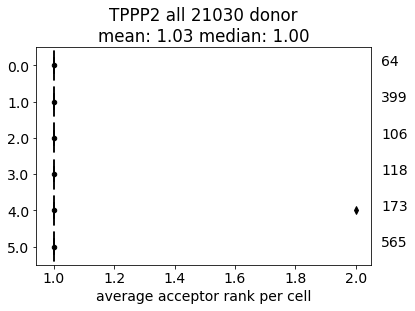

ranks 1.0    6
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21030304_don_ann.png


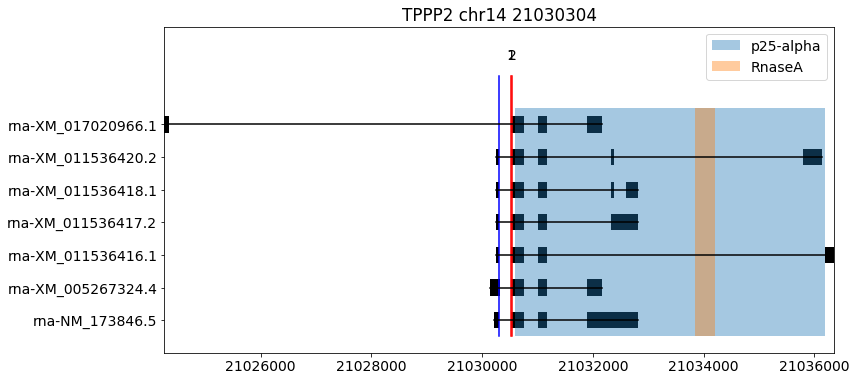

ann_dict {1: True, 2: True}


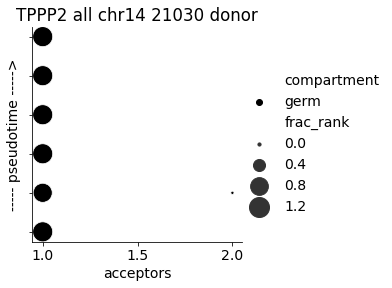

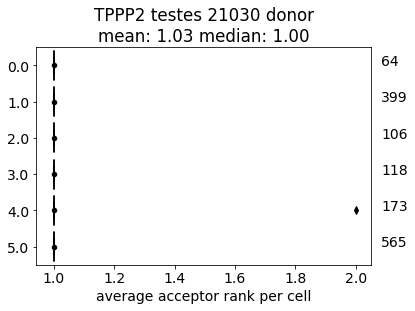

ranks 1.0    6
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21030304_don_ann.png


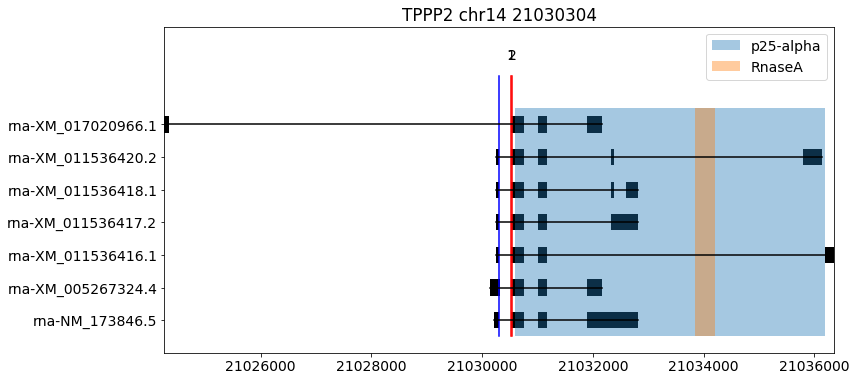

ann_dict {1: True, 2: True}


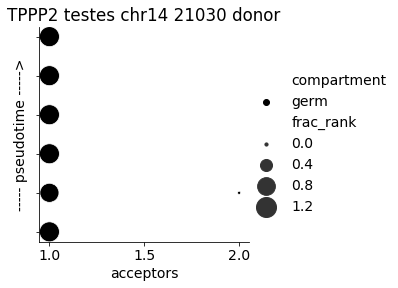

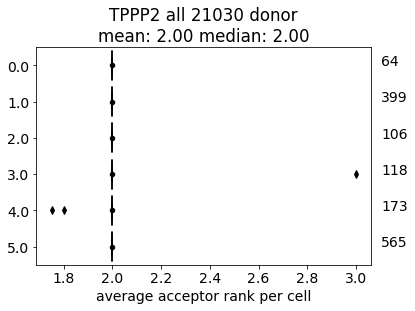

ranks 2.0    6
3.0    1
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21030754_don_ann.png


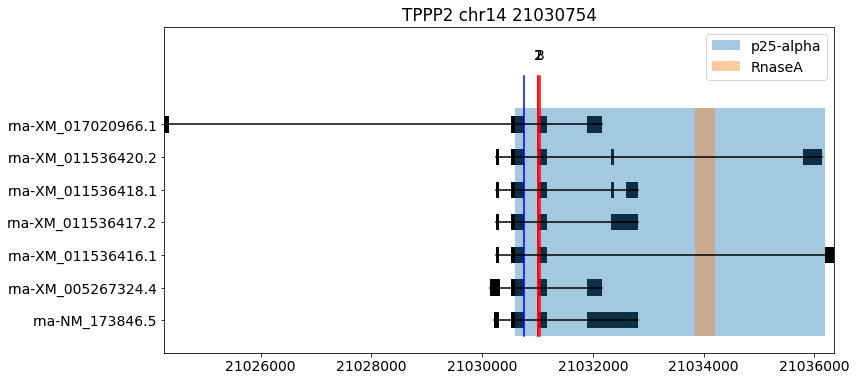

ann_dict {2: True, 1: True, 3: True}


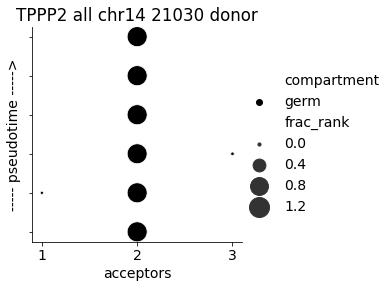

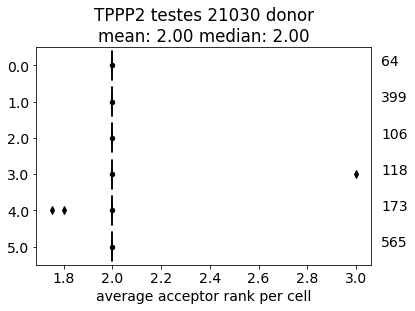

ranks 2.0    6
3.0    1
1.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21030754_don_ann.png


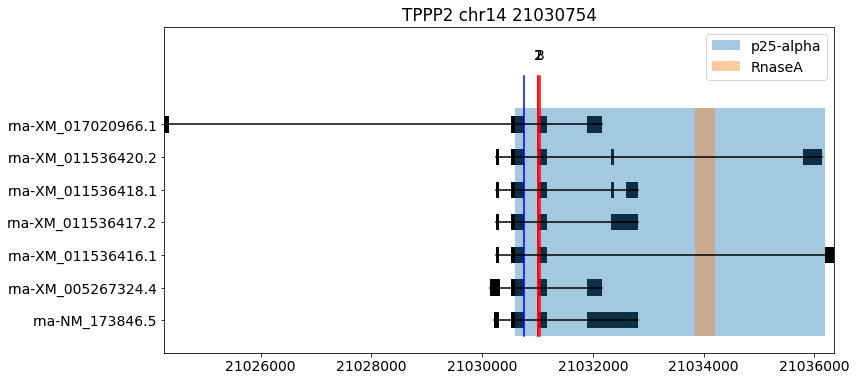

ann_dict {2: True, 1: True, 3: True}


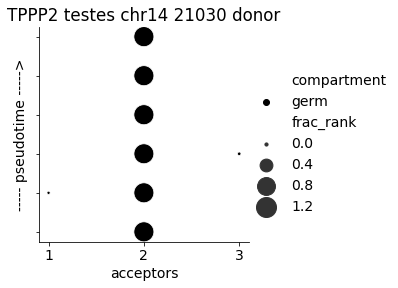

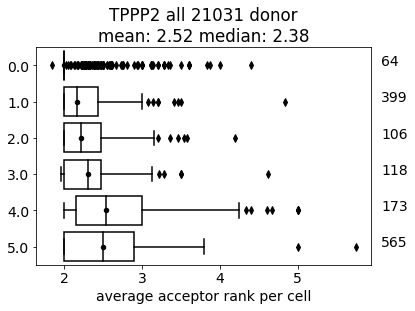

ranks 6.0     6
7.0     6
10.0    6
11.0    6
5.0     6
8.0     6
2.0     6
12.0    5
4.0     3
1.0     3
3.0     3
9.0     1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21031165_don_ann.png


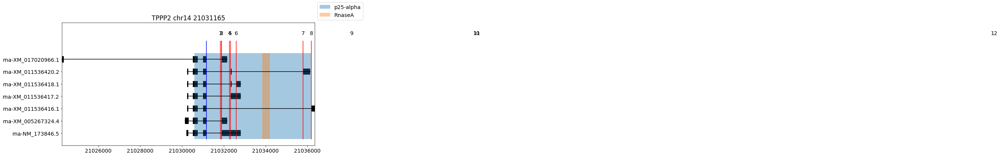

ann_dict {2: True, 8: True, 5: True, 11: True, 10: True, 7: True, 6: True, 3: True, 1: True, 4: True, 12: True, 9: True}


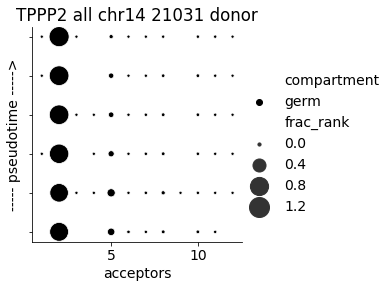

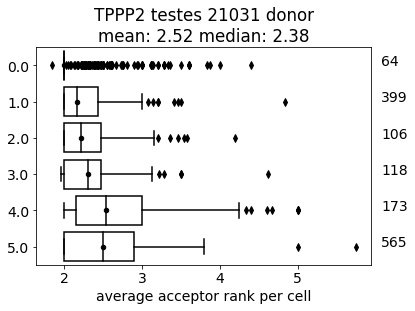

ranks 6.0     6
7.0     6
10.0    6
11.0    6
5.0     6
8.0     6
2.0     6
12.0    5
4.0     3
1.0     3
3.0     3
9.0     1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21031165_don_ann.png


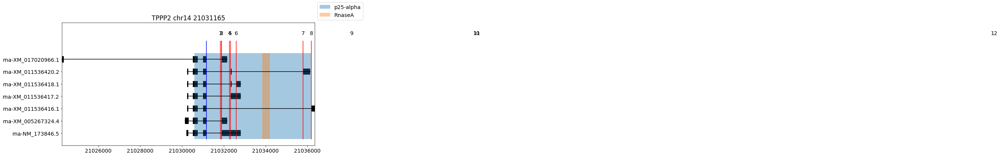

ann_dict {2: True, 8: True, 5: True, 11: True, 10: True, 7: True, 6: True, 3: True, 1: True, 4: True, 12: True, 9: True}


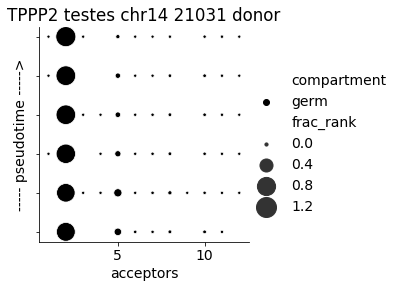

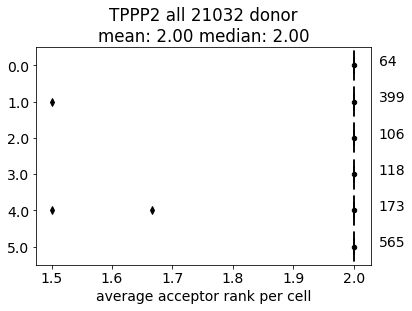

ranks 2.0    6
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032029_don_ann.png


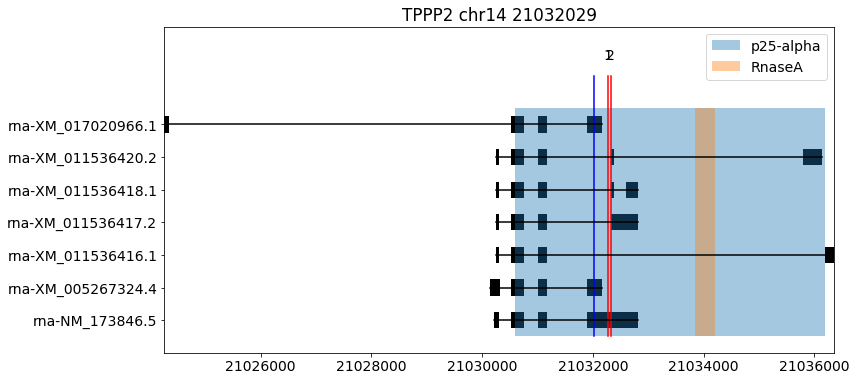

ann_dict {2: True, 1: True}


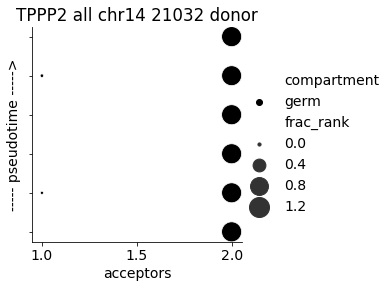

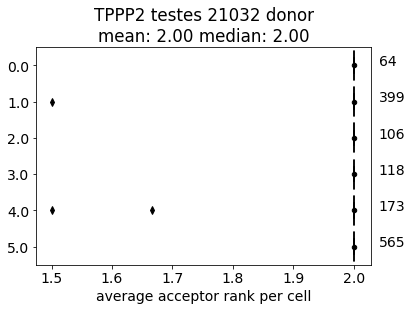

ranks 2.0    6
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032029_don_ann.png


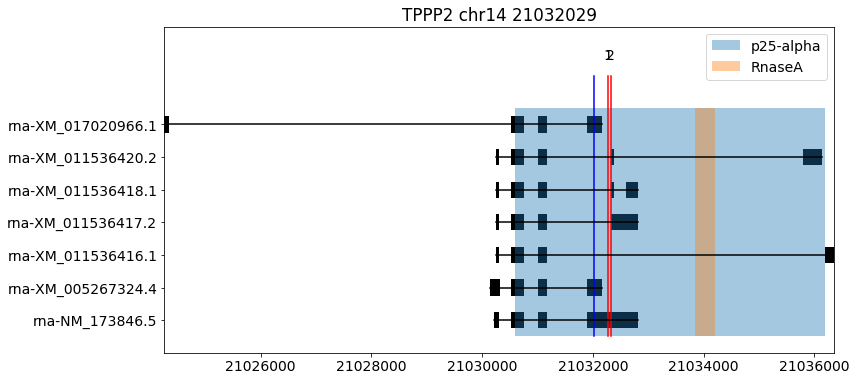

ann_dict {2: True, 1: True}


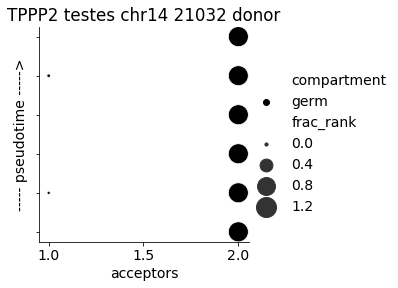

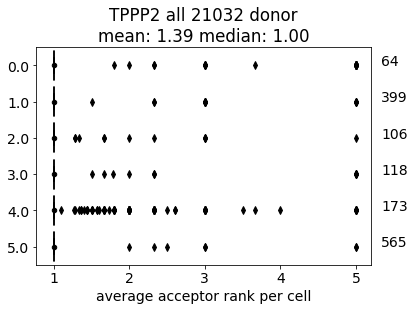

ranks 5.0    6
1.0    6
3.0    4
4.0    2
6.0    1
7.0    1
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032380_don_ann.png


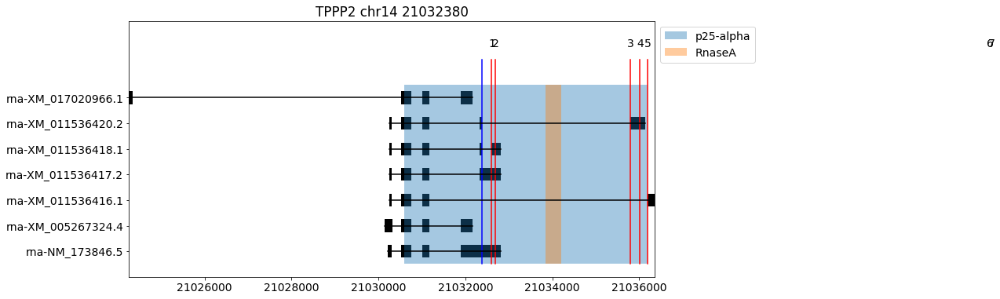

ann_dict {1: True, 5: True, 3: True, 4: True, 2: True, 7: True, 6: True}


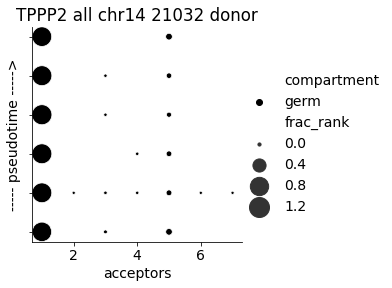

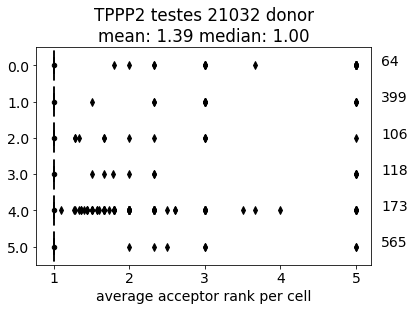

ranks 5.0    6
1.0    6
3.0    4
4.0    2
6.0    1
7.0    1
2.0    1
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032380_don_ann.png


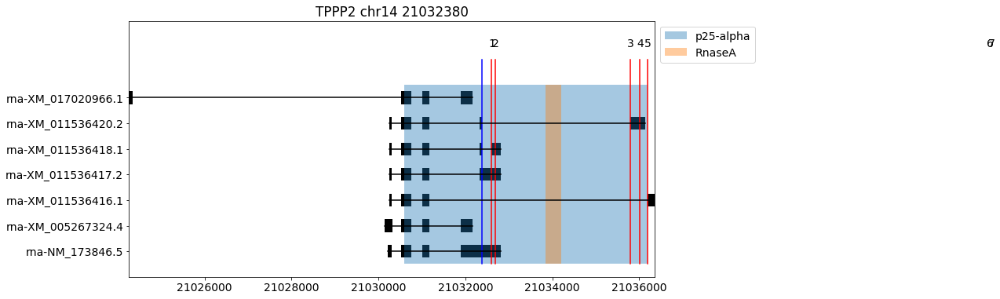

ann_dict {1: True, 5: True, 3: True, 4: True, 2: True, 7: True, 6: True}


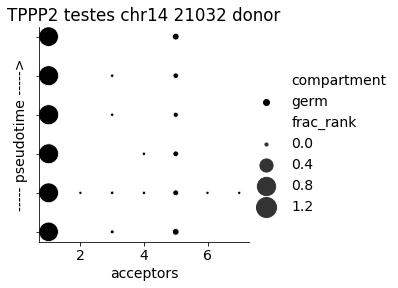

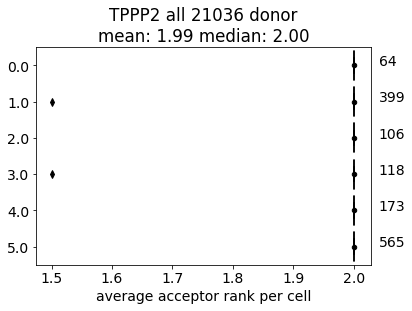

ranks 2.0    6
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21036092_don_ann.png


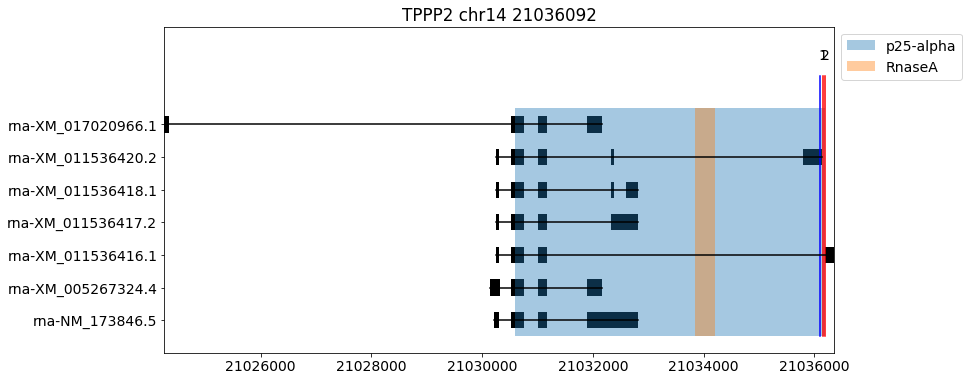

ann_dict {2: True, 1: True}


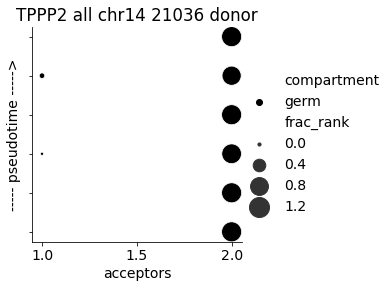

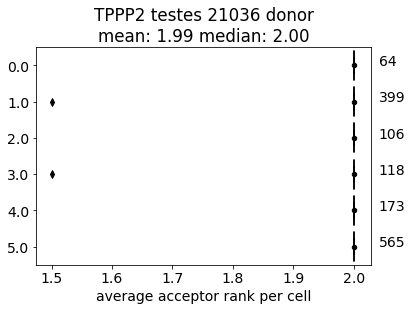

ranks 2.0    6
1.0    2
Name: rank_acc, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21036092_don_ann.png


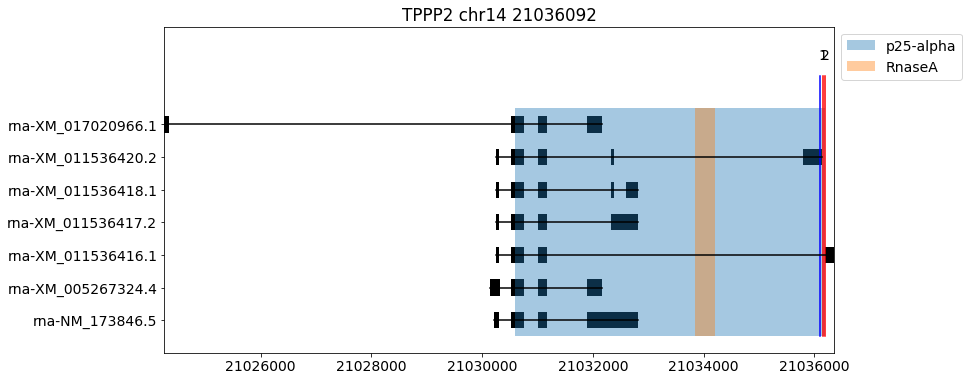

ann_dict {2: True, 1: True}


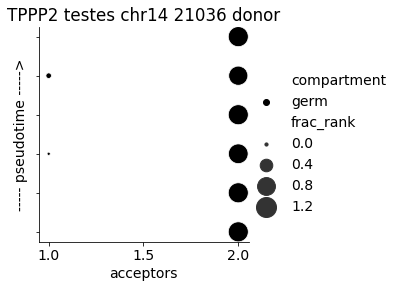

100%|██████████| 5/5 [03:25<00:00, 41.18s/it]


4    1469947
0     708095
8     636301
1     326516
2     293967
3     293206
5     219040
6     108251
7      83033
Name: binned_pt, dtype: int64

4    1469947
0     708095
8     636301
1     326516
2     293967
3     293206
5     219040
6     108251
7      83033
Name: binned_pt, dtype: int64

4    1469947
0     708095
8     636301
1     326516
2     293967
3     293206
5     219040
6     108251
7      83033
Name: binned_pt, dtype: int64

  0%|          | 0/5 [00:00<?, ?it/s]

gene FAM71E1


4    2416
0    1097
1     519
3     493
2     464
5     354
8     117
7      66
6      37
Name: binned_pt, dtype: int64

size before sub (5563, 30)


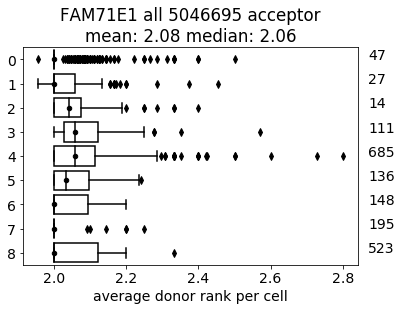

ranks 3.0    9
2.0    9
6.0    7
1.0    6
4.0    6
5.0    1
7.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50466955_don_ann.png


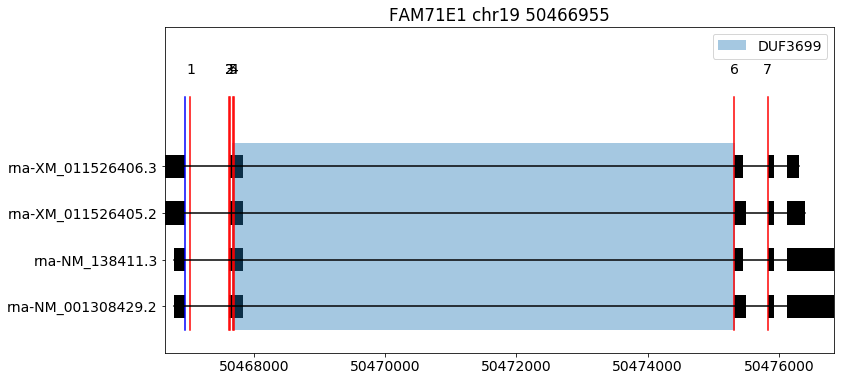

ann_dict {2: True, 3: True, 4: True, 7: True, 6: True, 1: True, 5: True}


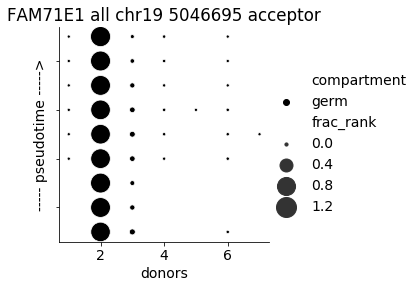

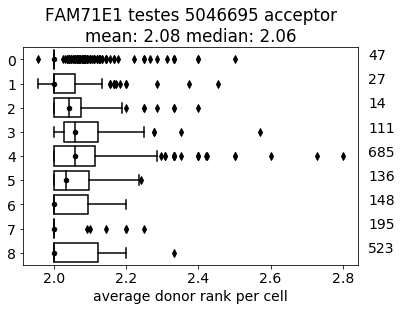

ranks 3.0    9
2.0    9
6.0    7
1.0    6
4.0    6
5.0    1
7.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50466955_don_ann.png


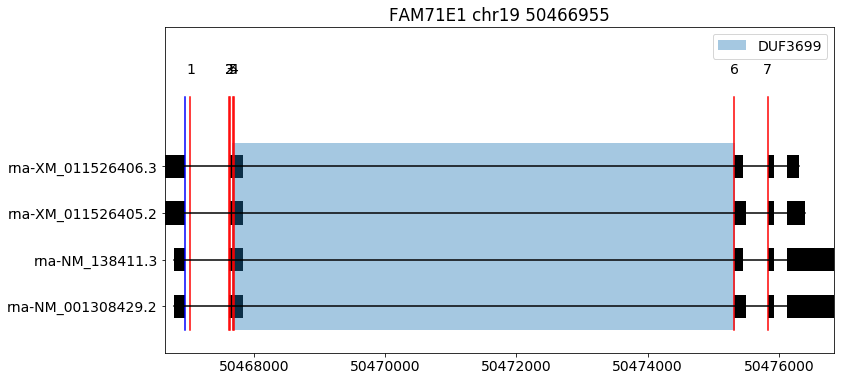

ann_dict {2: True, 3: True, 4: True, 7: True, 6: True, 1: True, 5: True}


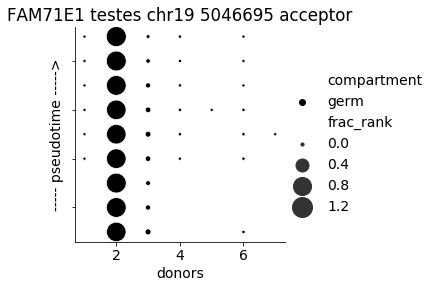

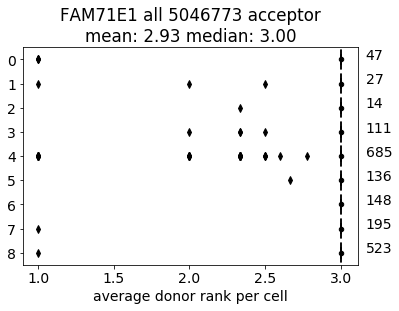

ranks 3.0    9
1.0    8
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50467732_don_ann.png


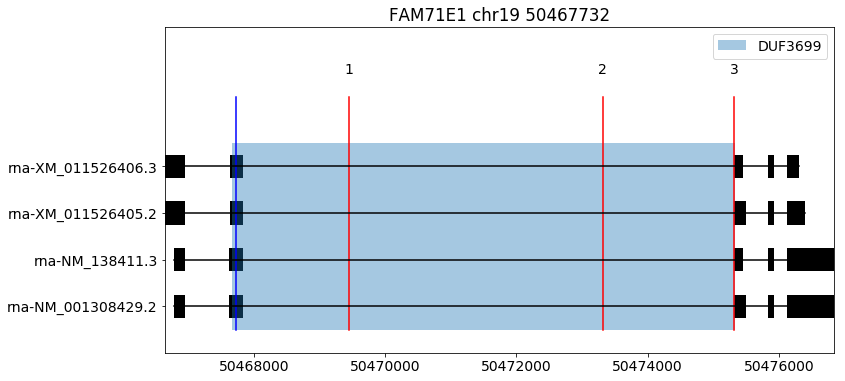

ann_dict {3: True, 1: True, 2: True}


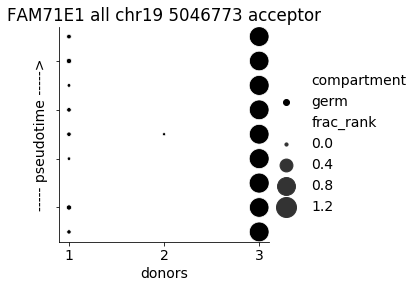

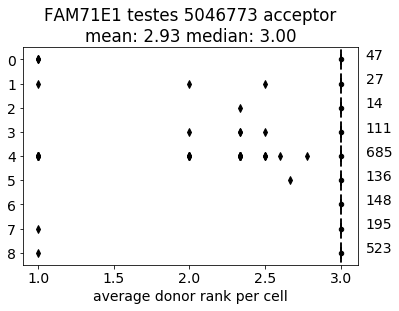

ranks 3.0    9
1.0    8
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50467732_don_ann.png


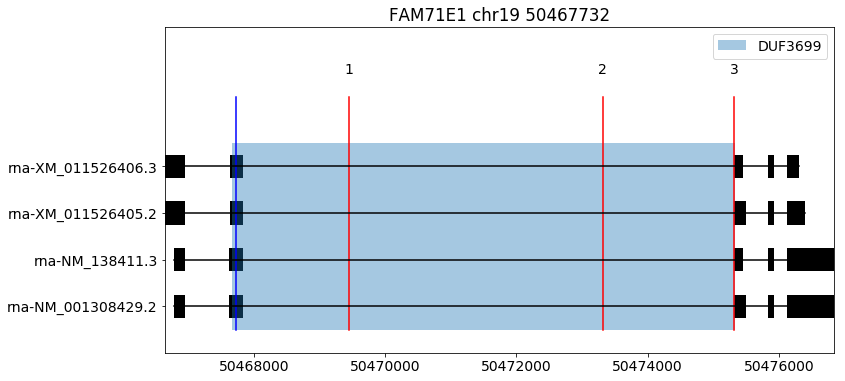

ann_dict {3: True, 1: True, 2: True}


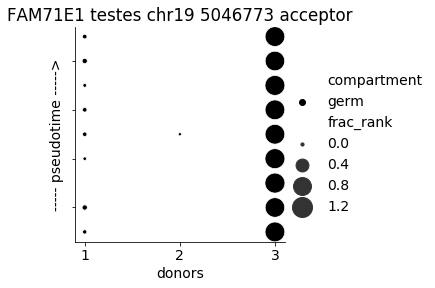

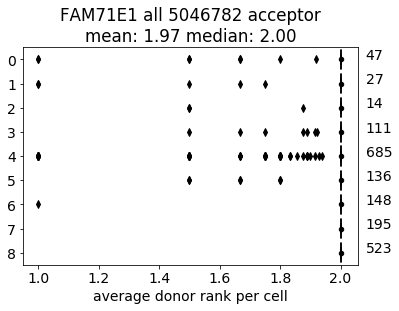

ranks 2.0    9
1.0    7
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50467829_don_ann.png


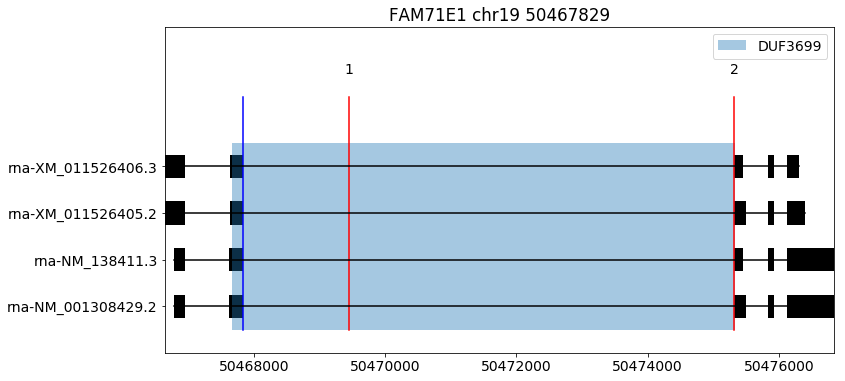

ann_dict {2: True, 1: True}


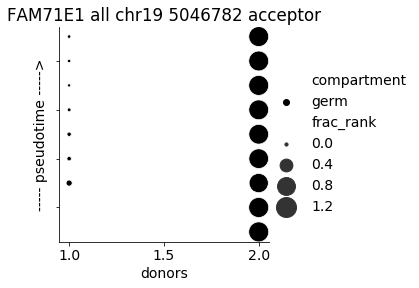

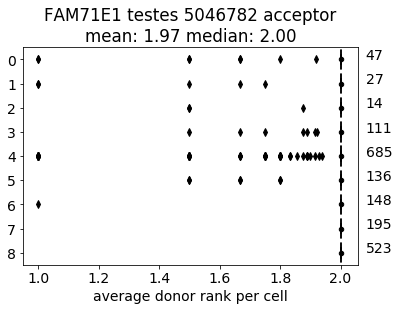

ranks 2.0    9
1.0    7
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/FAM71E1/Spermatogenesis dataFAM71E1_50467829_don_ann.png


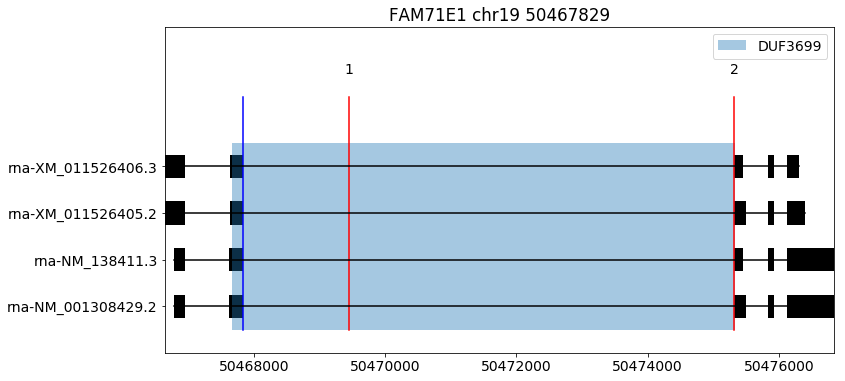

ann_dict {2: True, 1: True}


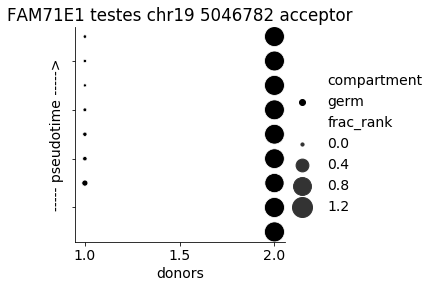

 20%|██        | 1/5 [00:17<01:08, 17.08s/it]

gene MLF1


0    3227
4    2879
8    1671
1     992
2     817
3     704
5     504
7     164
6     144
Name: binned_pt, dtype: int64

size before sub (11102, 30)


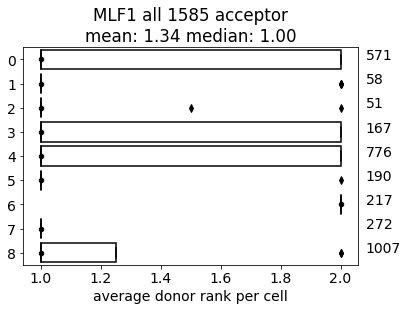

ranks 1.0    8
2.0    8
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158588852_don_ann.png


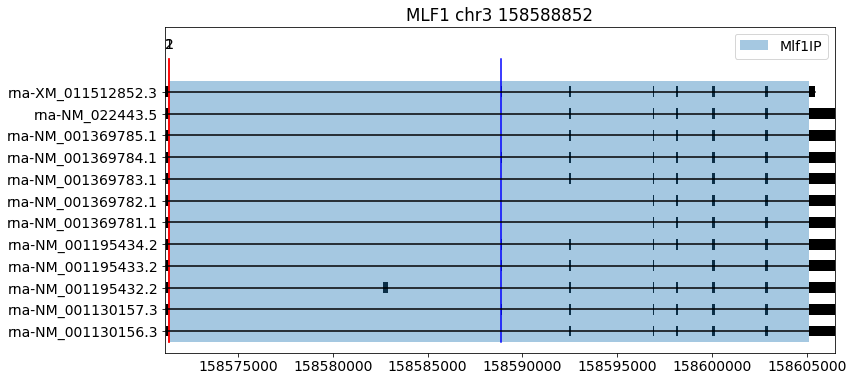

ann_dict {2: True, 1: True}


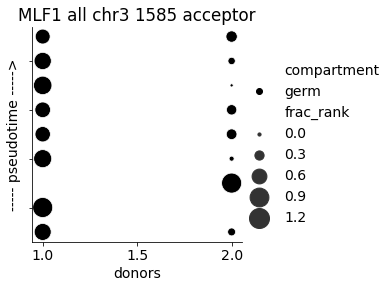

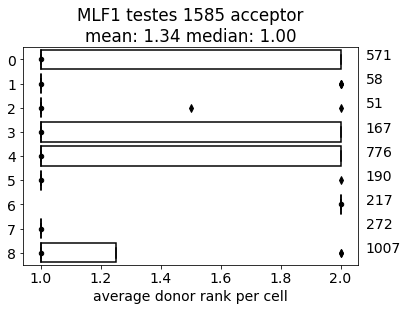

ranks 1.0    8
2.0    8
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158588852_don_ann.png


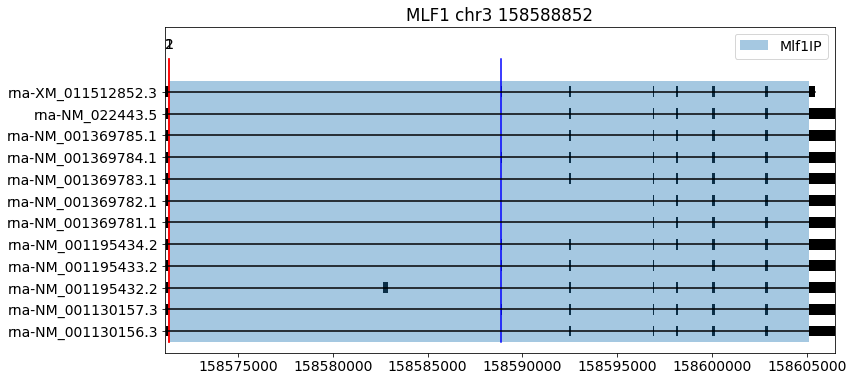

ann_dict {2: True, 1: True}


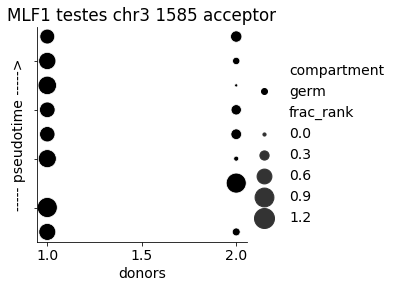

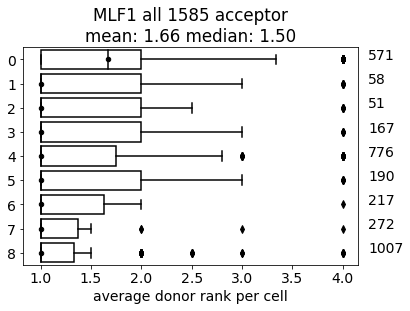

ranks 2.0    9
4.0    9
1.0    9
3.0    4
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158592434_don_ann.png


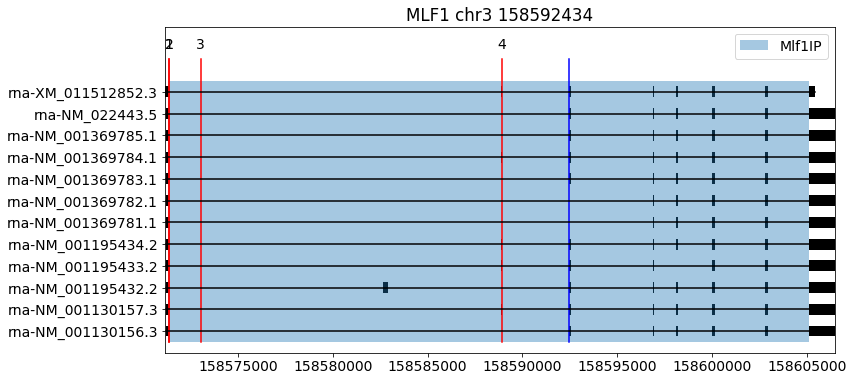

ann_dict {1: True, 4: True, 2: True, 3: True}


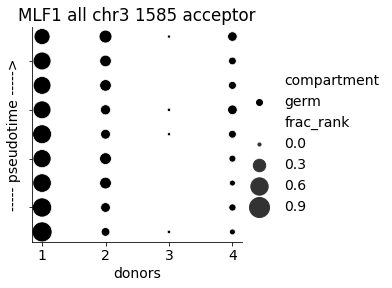

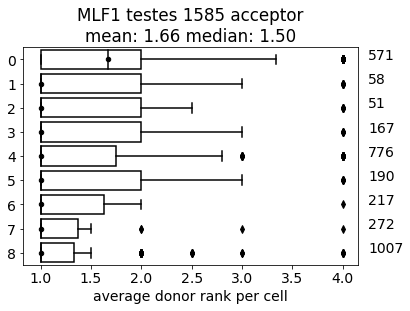

ranks 2.0    9
4.0    9
1.0    9
3.0    4
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158592434_don_ann.png


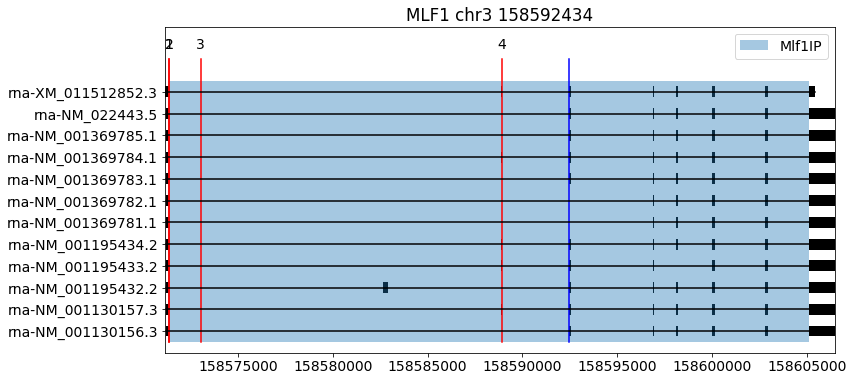

ann_dict {1: True, 4: True, 2: True, 3: True}


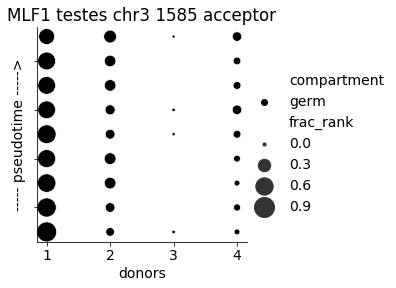

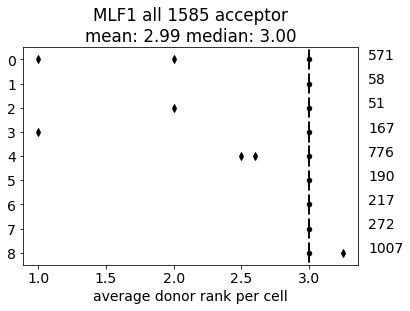

ranks 3.0    9
1.0    4
2.0    2
4.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158596862_don_ann.png


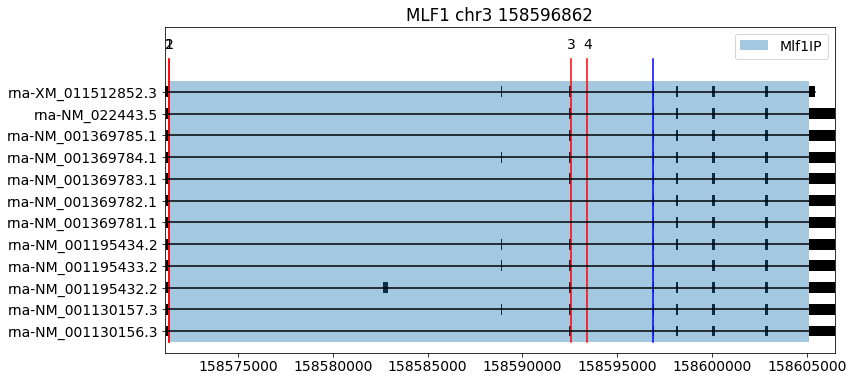

ann_dict {3: True, 1: True, 4: True, 2: True}


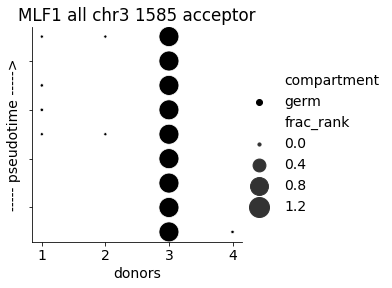

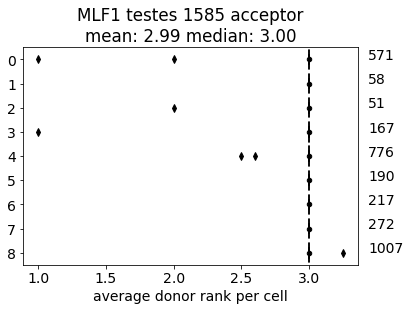

ranks 3.0    9
1.0    4
2.0    2
4.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158596862_don_ann.png


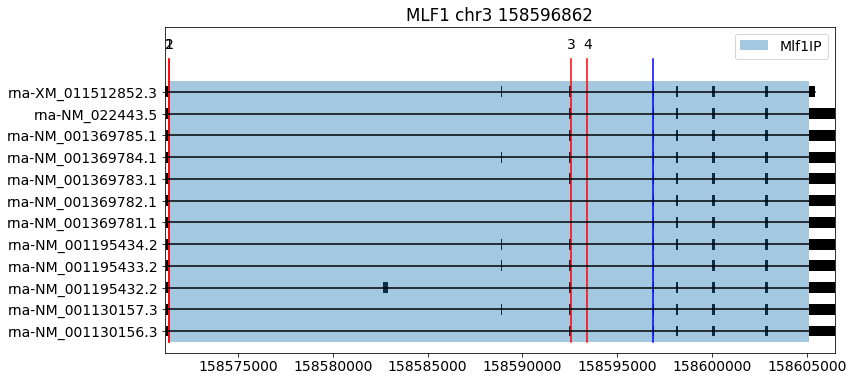

ann_dict {3: True, 1: True, 4: True, 2: True}


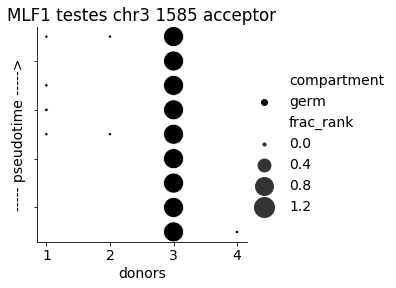

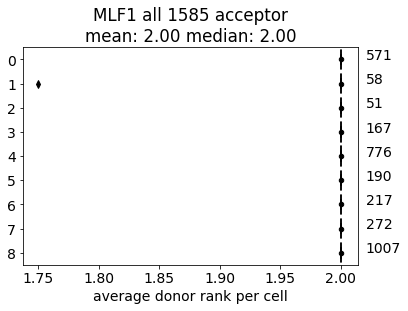

ranks 2.0    9
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158598080_don_ann.png


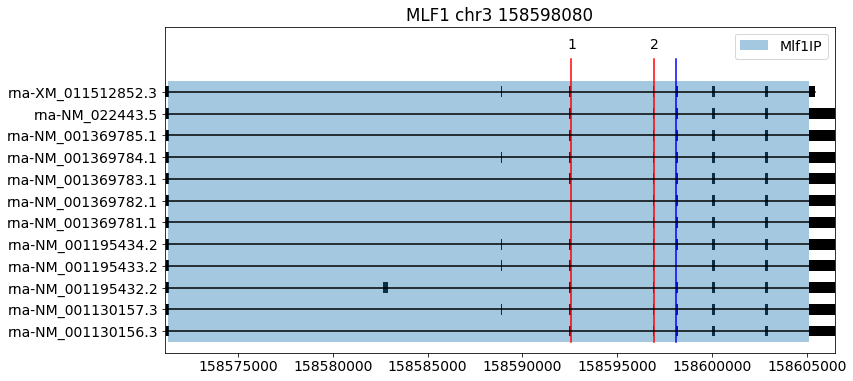

ann_dict {2: True, 1: True}


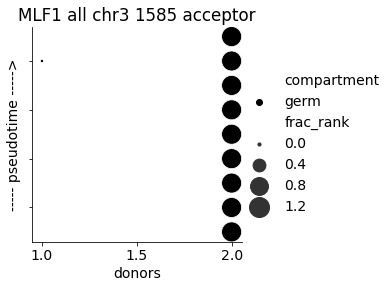

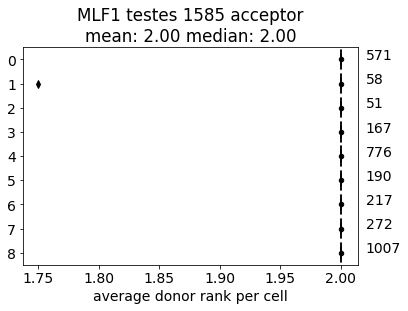

ranks 2.0    9
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158598080_don_ann.png


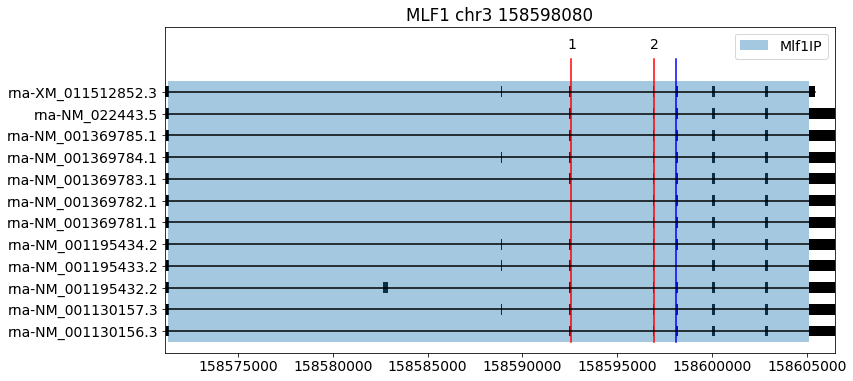

ann_dict {2: True, 1: True}


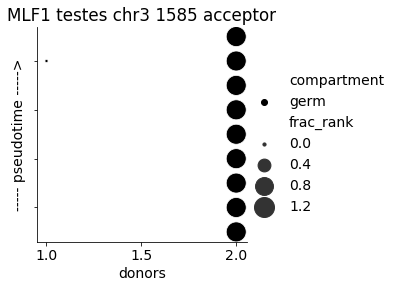

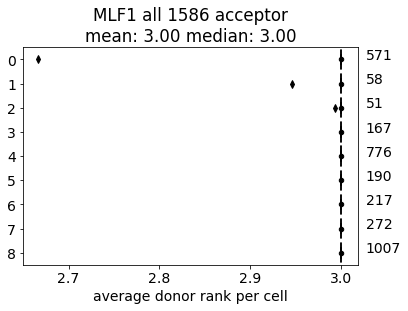

ranks 3.0    9
2.0    2
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158602807_don_ann.png


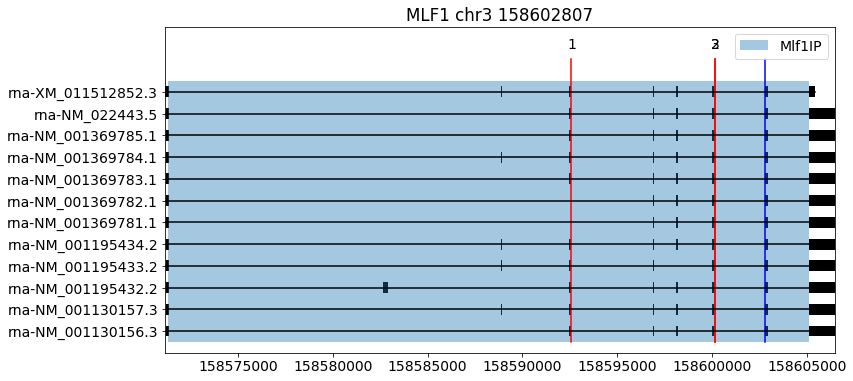

ann_dict {3: True, 2: True, 1: True}


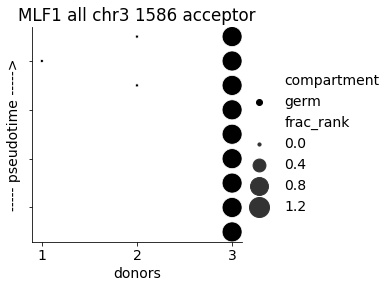

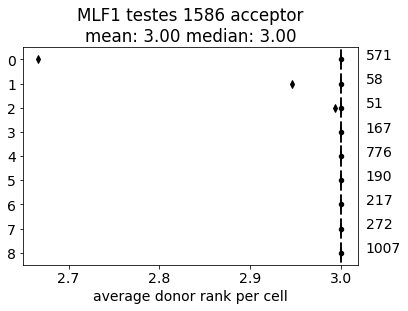

ranks 3.0    9
2.0    2
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158602807_don_ann.png


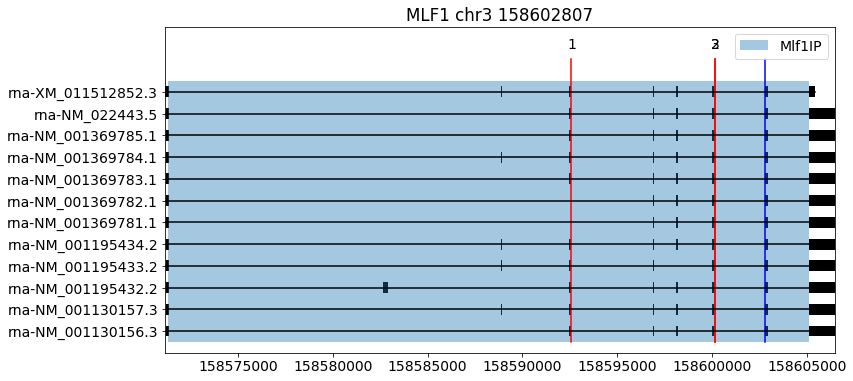

ann_dict {3: True, 2: True, 1: True}


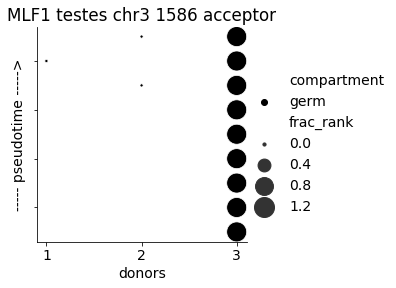

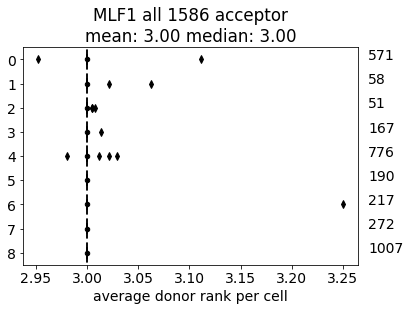

ranks 3.0    9
4.0    6
1.0    1
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158605097_don_ann.png


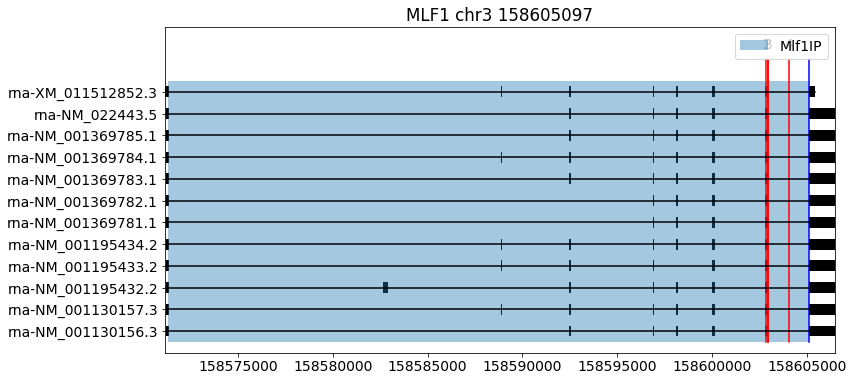

ann_dict {3: True, 4: True, 2: True, 1: True}


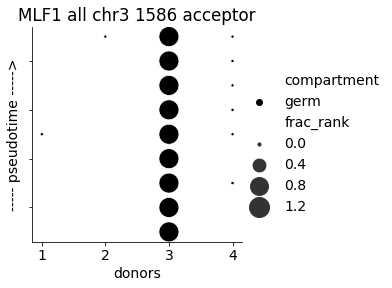

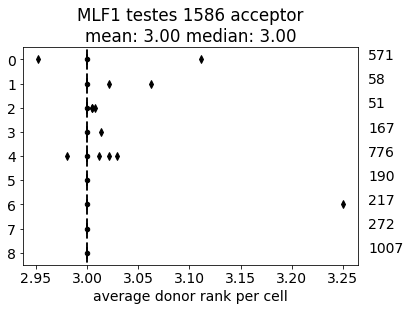

ranks 3.0    9
4.0    6
1.0    1
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158605097_don_ann.png


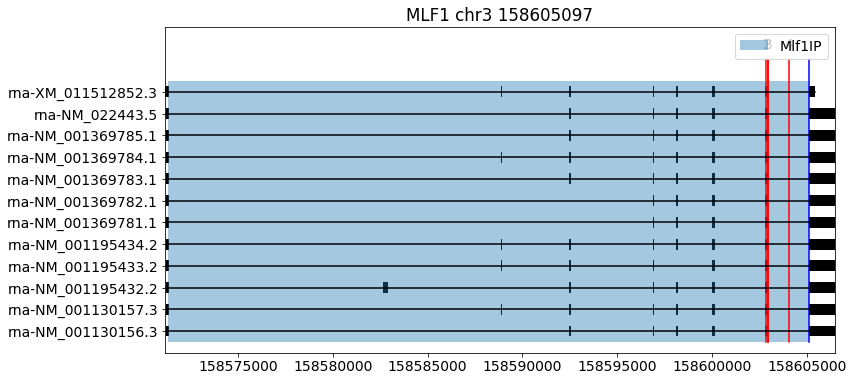

ann_dict {3: True, 4: True, 2: True, 1: True}


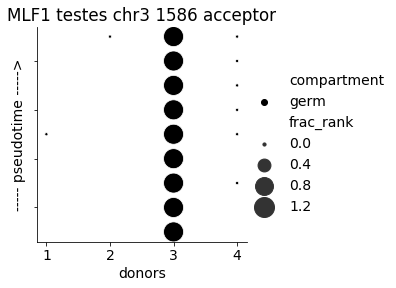

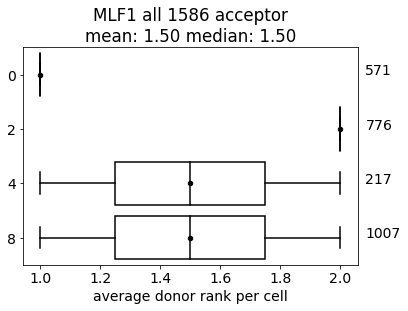

ranks 1.0    3
2.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158605183_don_ann.png


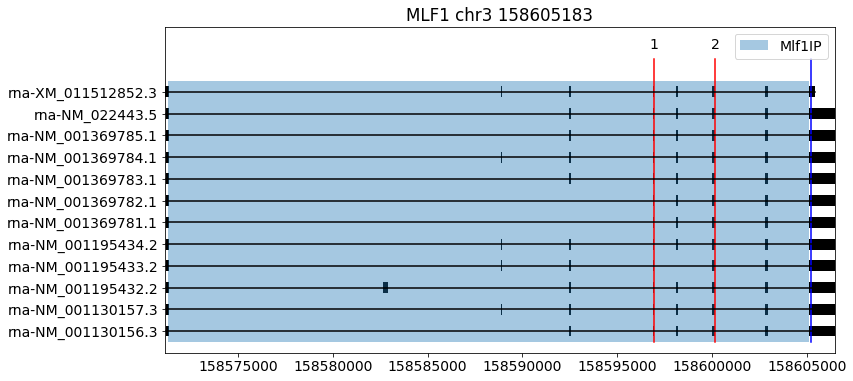

ann_dict {2: True, 1: True}


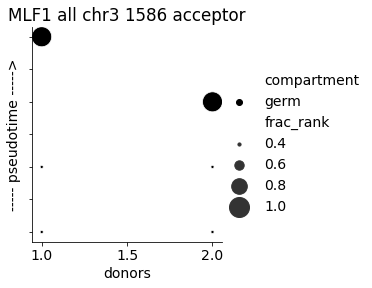

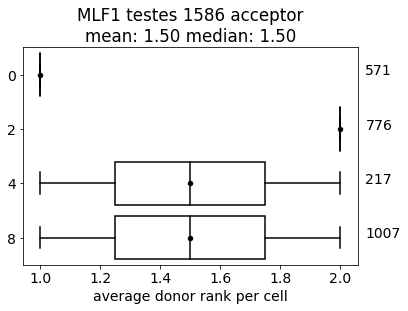

ranks 1.0    3
2.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158605183_don_ann.png


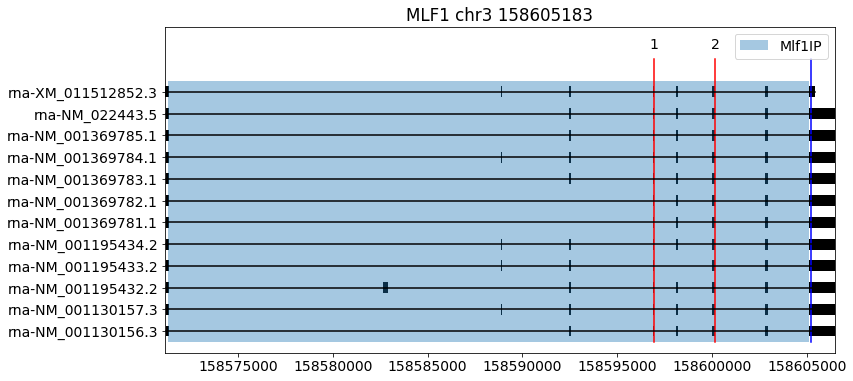

ann_dict {2: True, 1: True}


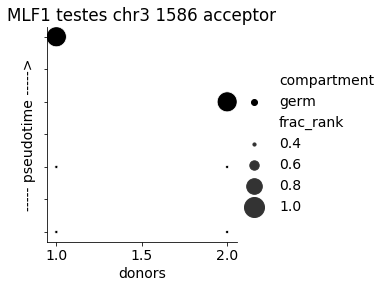

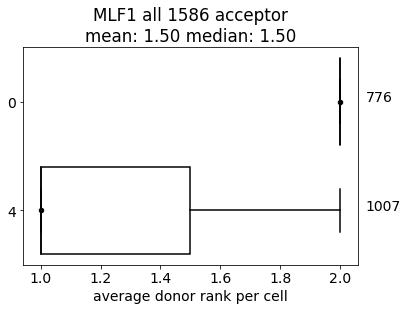

ranks 2.0    2
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158605184_don_ann.png


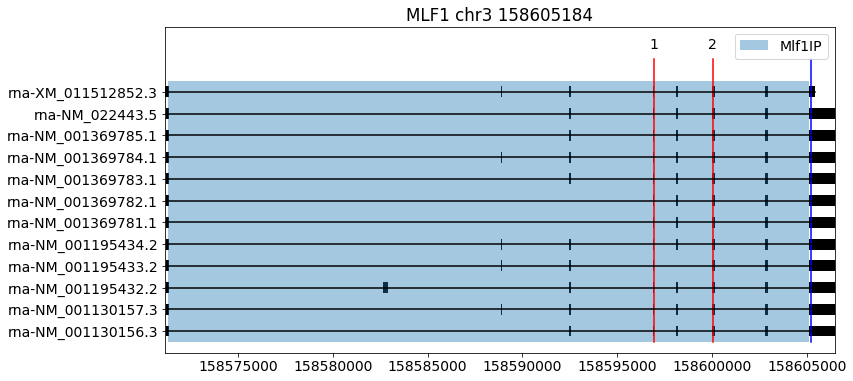

ann_dict {1: True, 2: True}


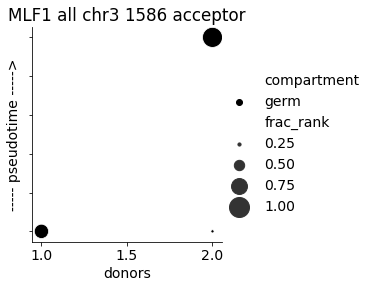

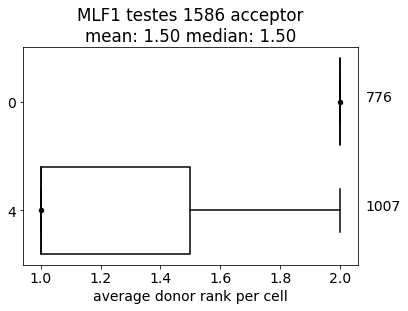

ranks 2.0    2
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MLF1/Spermatogenesis dataMLF1_158605184_don_ann.png


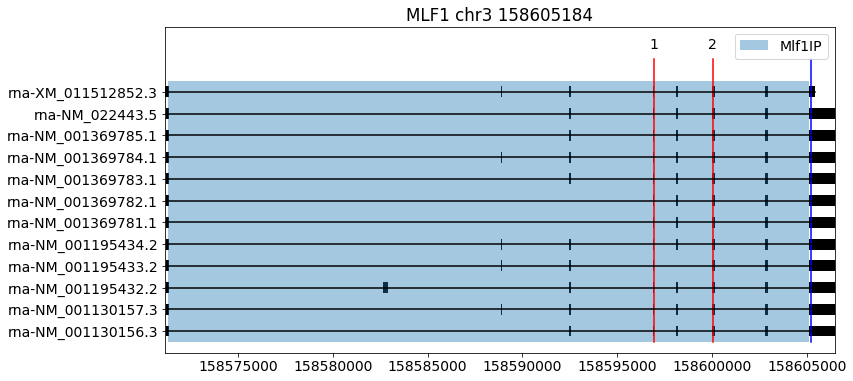

ann_dict {1: True, 2: True}


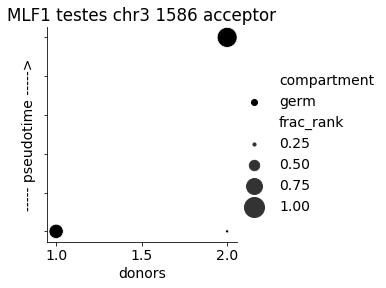

 40%|████      | 2/5 [01:04<01:18, 26.05s/it]

gene MTFR1


4    847
0    566
2    502
1    489
3    415
5      0
6      0
7      0
8      0
Name: binned_pt, dtype: int64

size before sub (2819, 30)


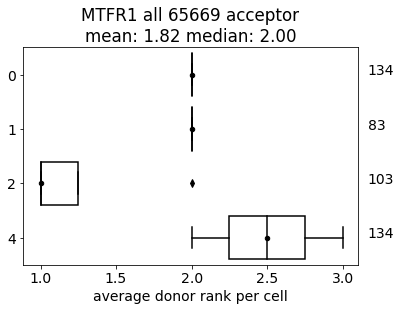

ranks 2.0    4
3.0    1
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65669873_don_ann.png


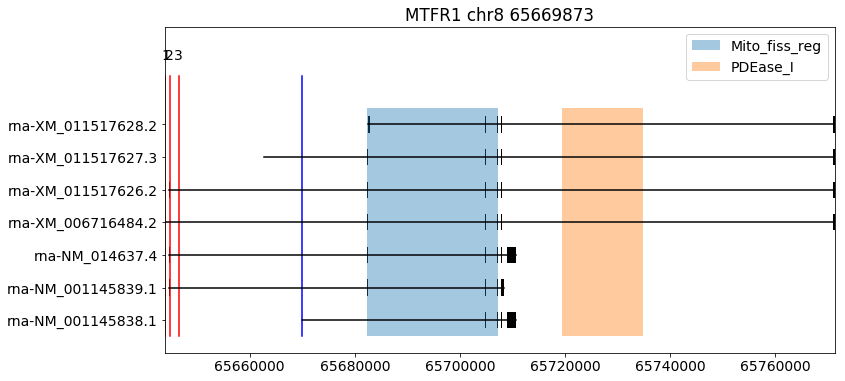

ann_dict {2: True, 1: True, 3: True}


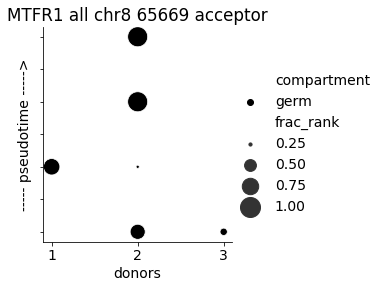

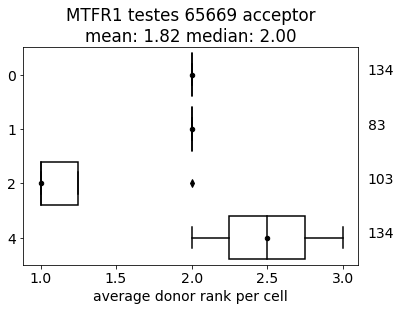

ranks 2.0    4
3.0    1
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65669873_don_ann.png


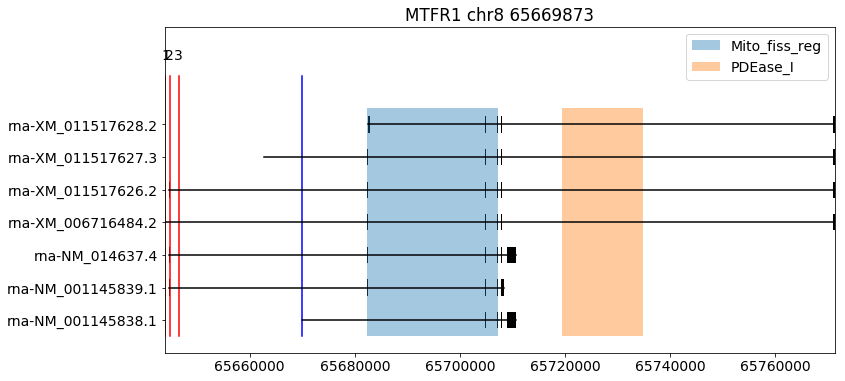

ann_dict {2: True, 1: True, 3: True}


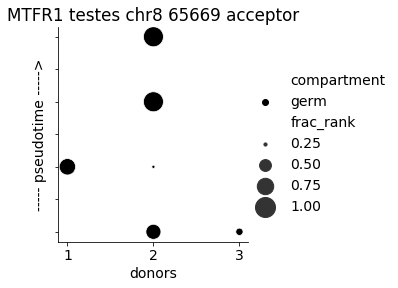

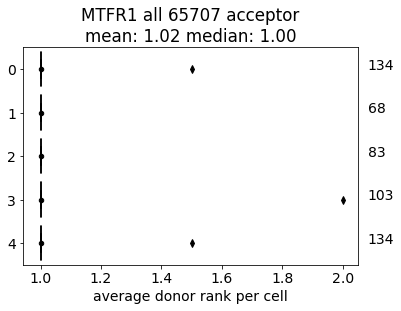

ranks 1.0    5
2.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65707010_don_ann.png


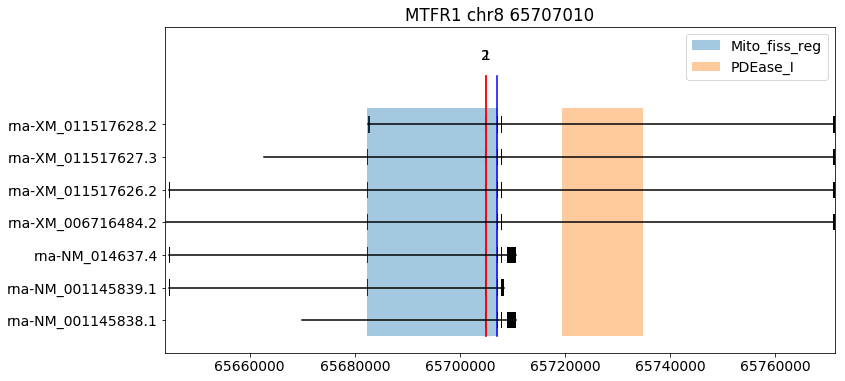

ann_dict {1: True, 2: True}


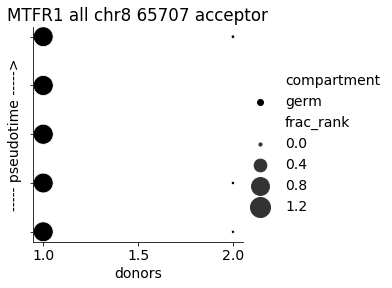

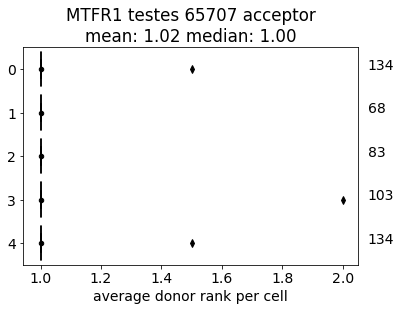

ranks 1.0    5
2.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65707010_don_ann.png


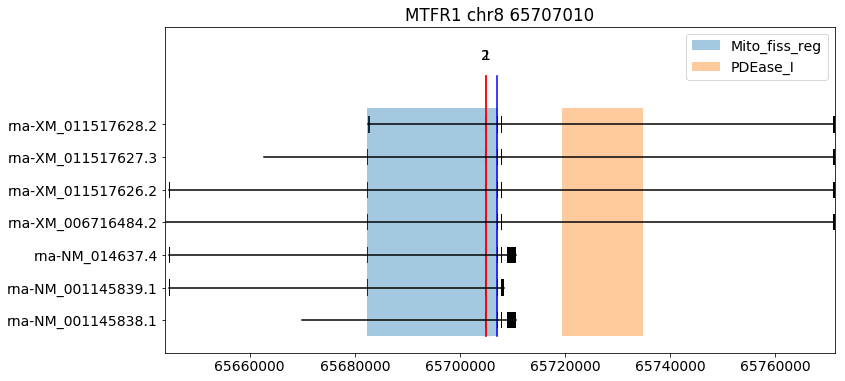

ann_dict {1: True, 2: True}


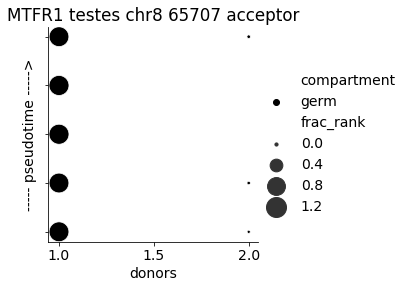

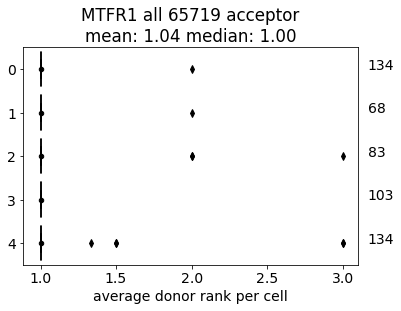

ranks 1.0    5
2.0    4
3.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65719380_don_ann.png


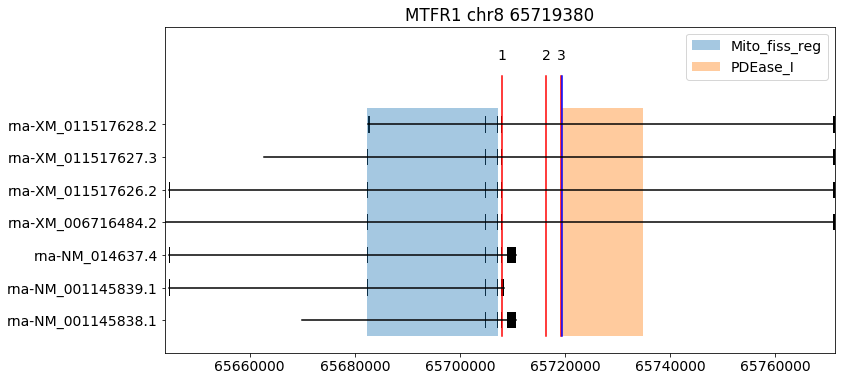

ann_dict {1: True, 2: True, 3: True}


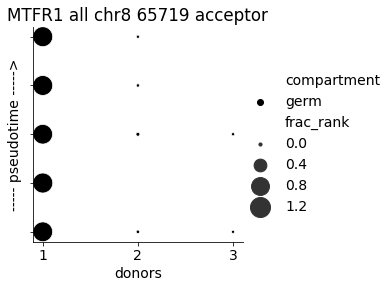

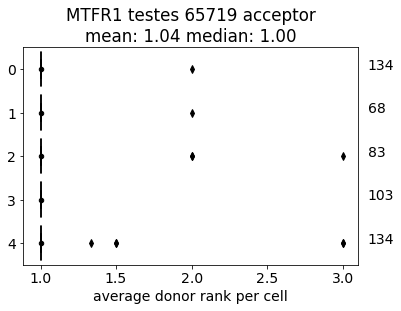

ranks 1.0    5
2.0    4
3.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65719380_don_ann.png


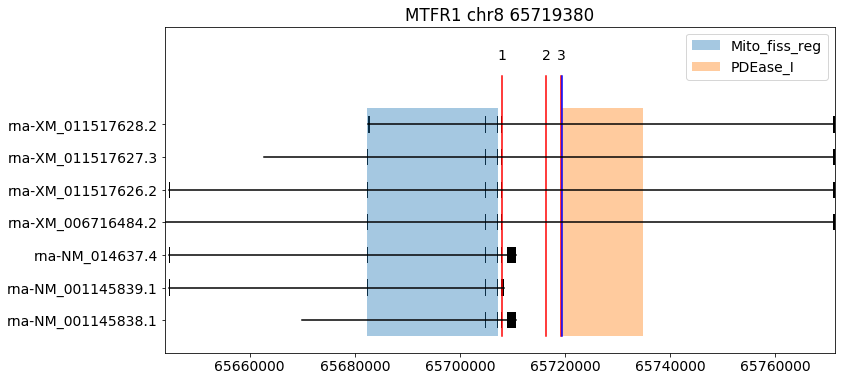

ann_dict {1: True, 2: True, 3: True}


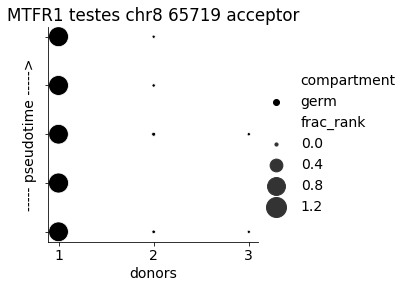

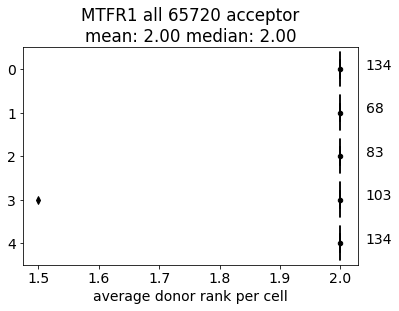

ranks 2.0    5
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65720404_don_ann.png


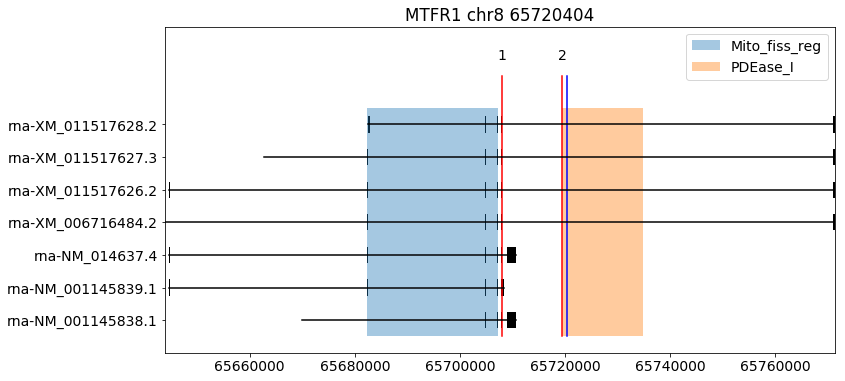

ann_dict {2: True, 1: True}


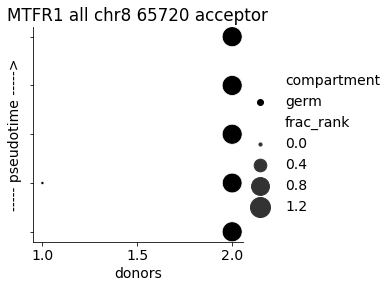

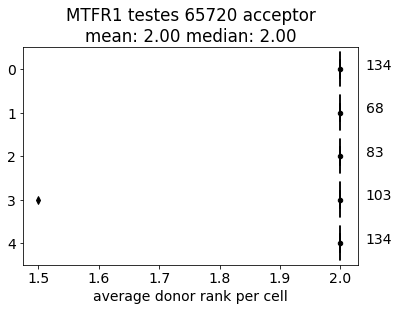

ranks 2.0    5
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65720404_don_ann.png


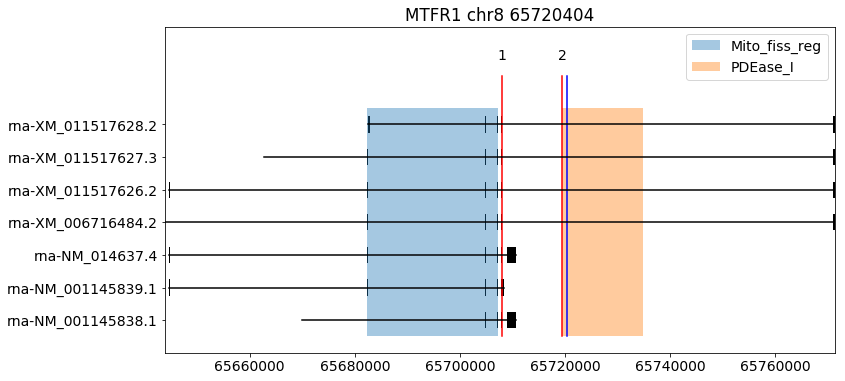

ann_dict {2: True, 1: True}


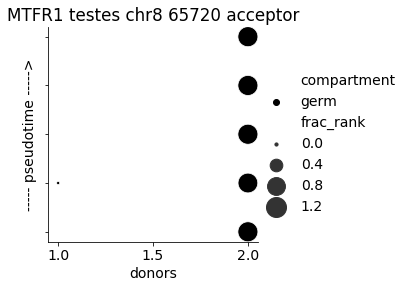

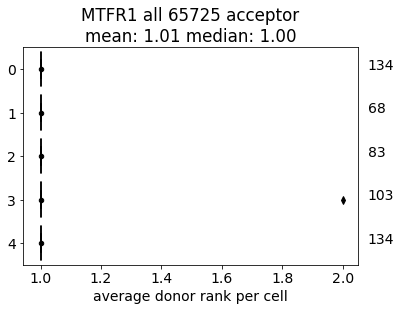

ranks 1.0    5
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65725316_don_ann.png


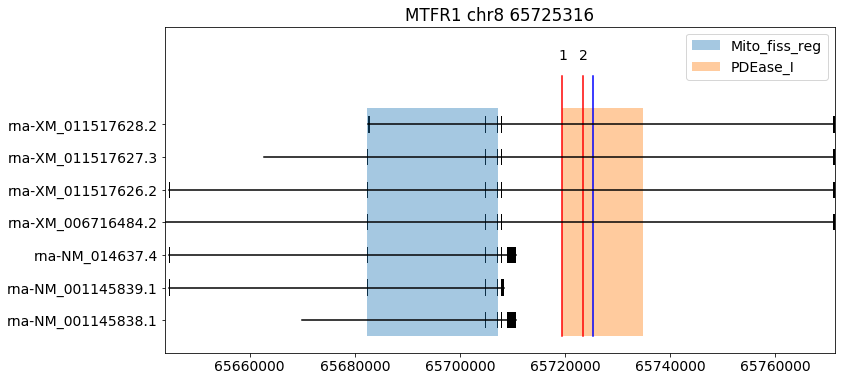

ann_dict {1: True, 2: True}


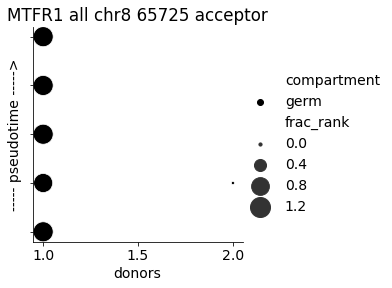

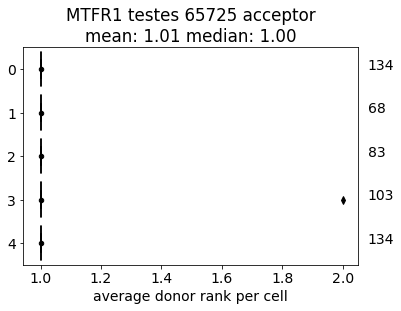

ranks 1.0    5
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65725316_don_ann.png


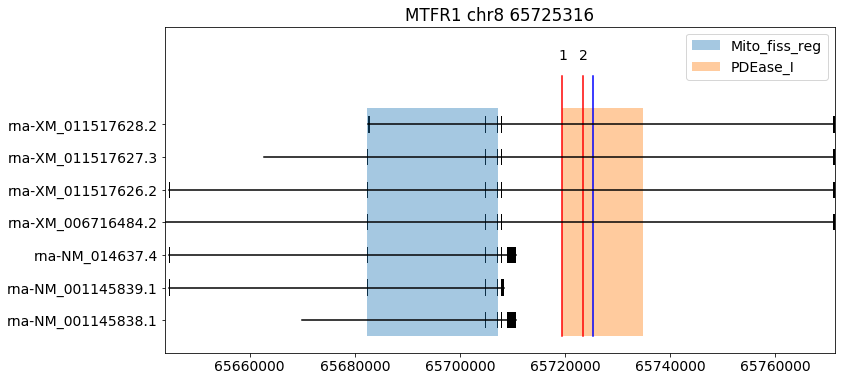

ann_dict {1: True, 2: True}


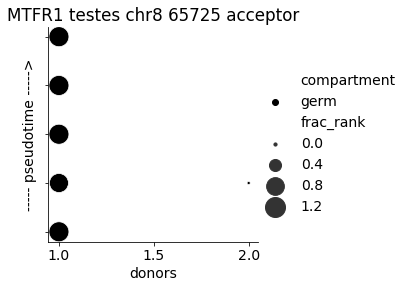

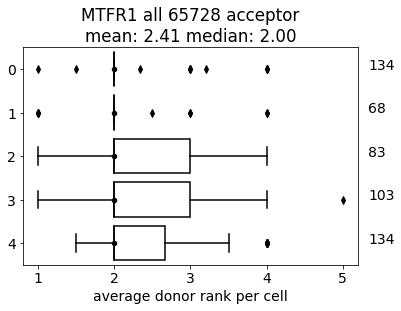

ranks 1.0    5
4.0    5
2.0    5
5.0    3
3.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65728361_don_ann.png


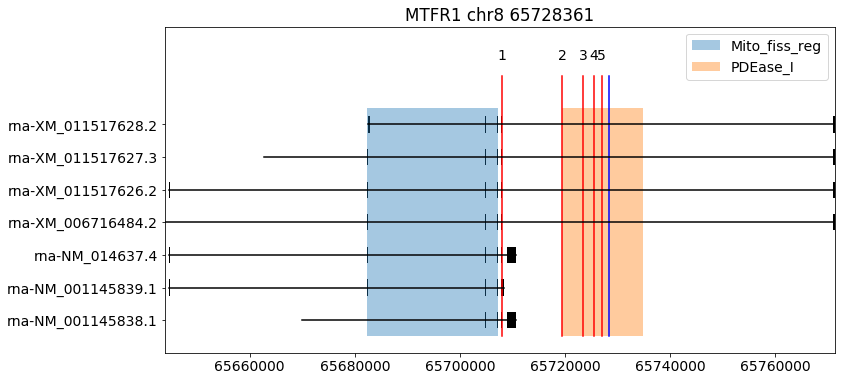

ann_dict {2: True, 4: True, 1: True, 5: True, 3: True}


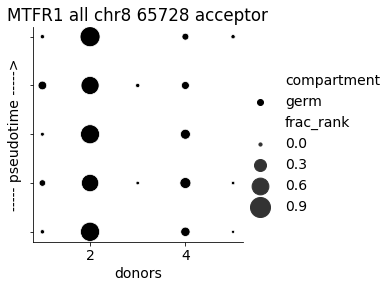

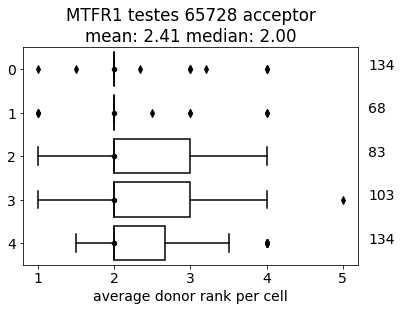

ranks 1.0    5
4.0    5
2.0    5
5.0    3
3.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65728361_don_ann.png


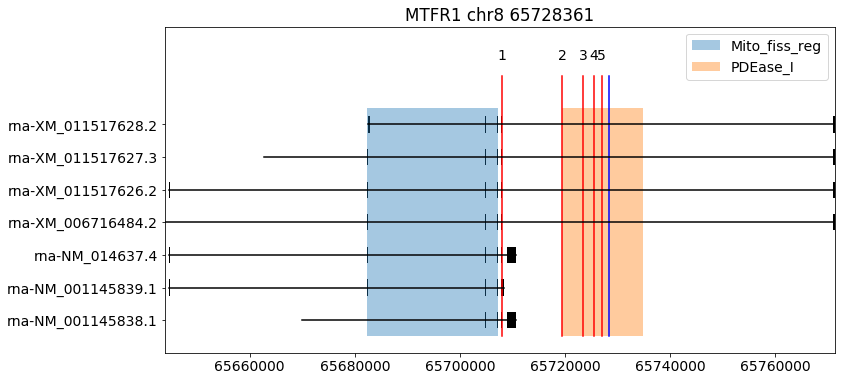

ann_dict {2: True, 4: True, 1: True, 5: True, 3: True}


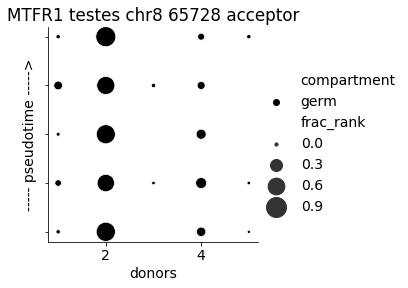

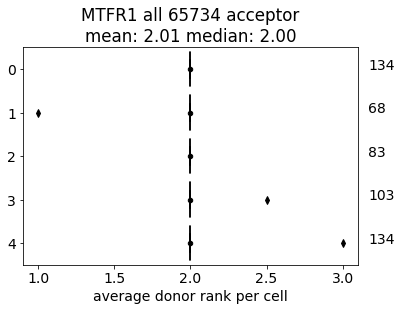

ranks 2.0    5
3.0    2
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65734799_don_ann.png


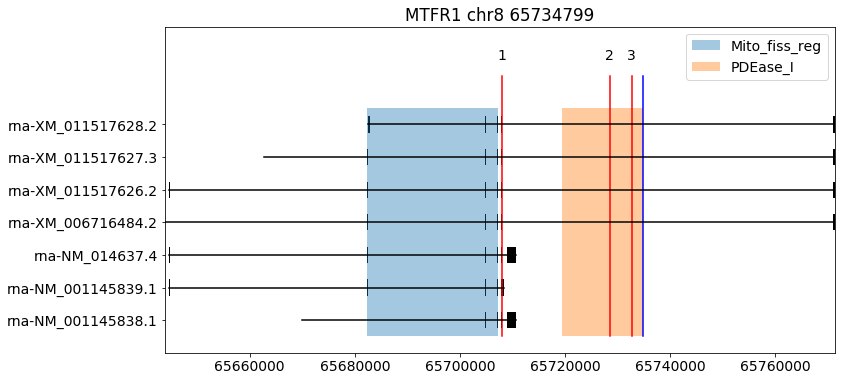

ann_dict {2: True, 3: True, 1: True}


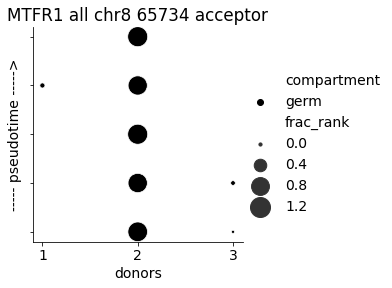

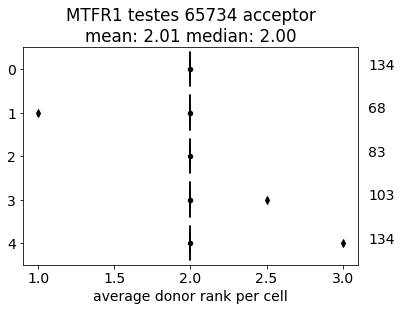

ranks 2.0    5
3.0    2
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65734799_don_ann.png


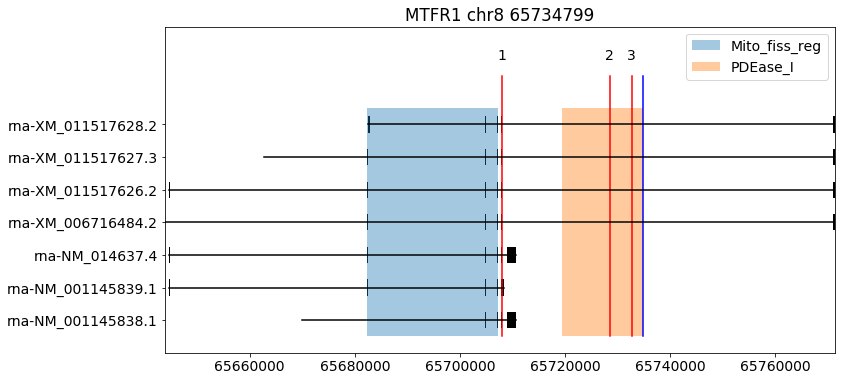

ann_dict {2: True, 3: True, 1: True}


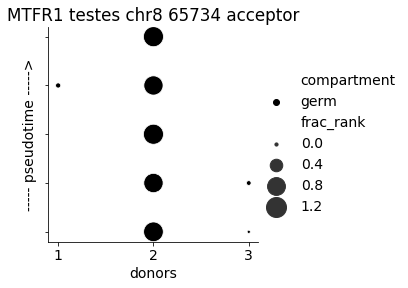

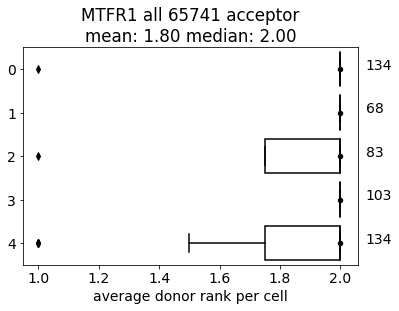

ranks 2.0    5
1.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65741906_don_ann.png


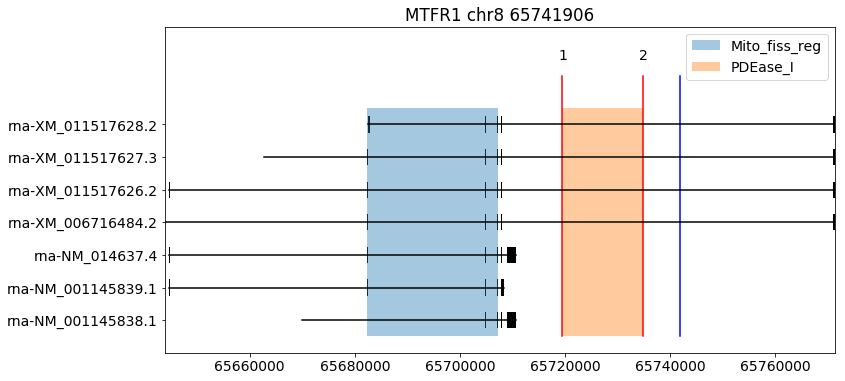

ann_dict {2: True, 1: True}


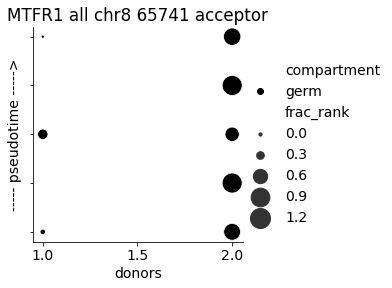

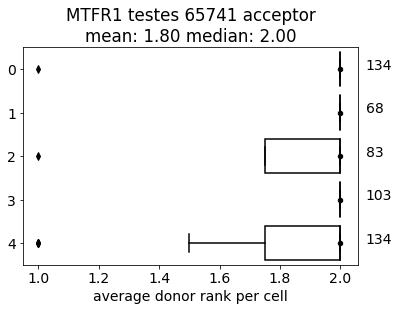

ranks 2.0    5
1.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65741906_don_ann.png


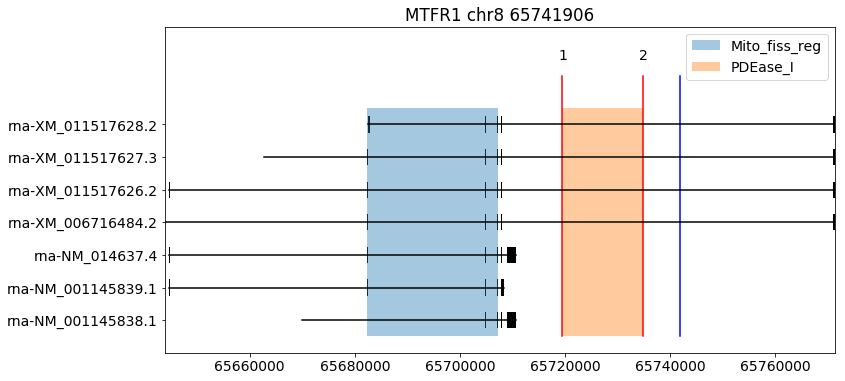

ann_dict {2: True, 1: True}


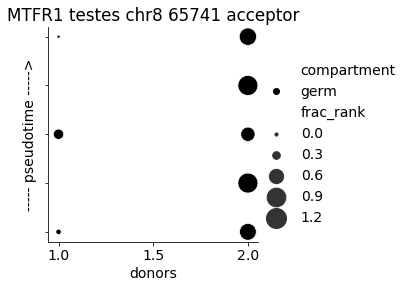

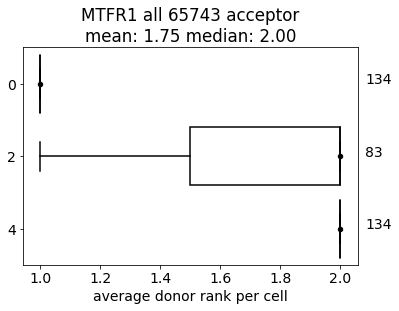

ranks 1.0    2
2.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65743519_don_ann.png


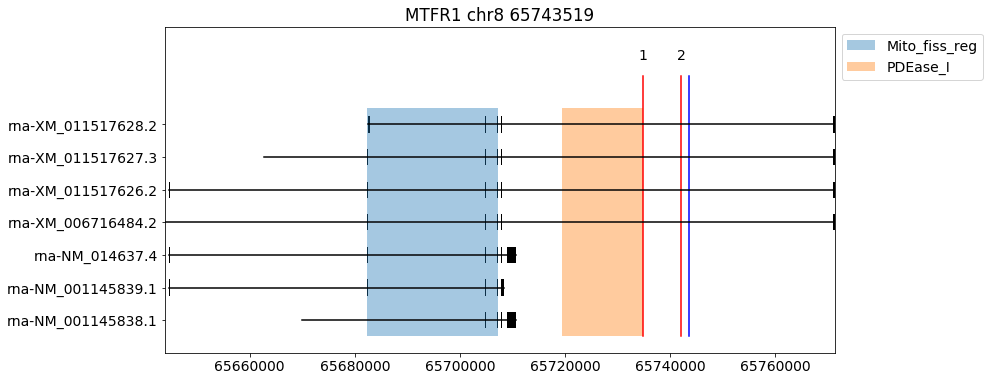

ann_dict {2: True, 1: True}


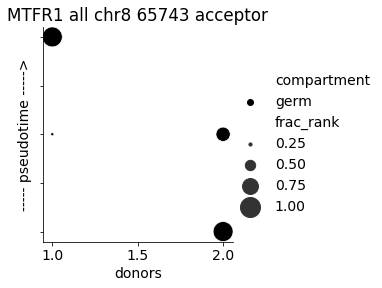

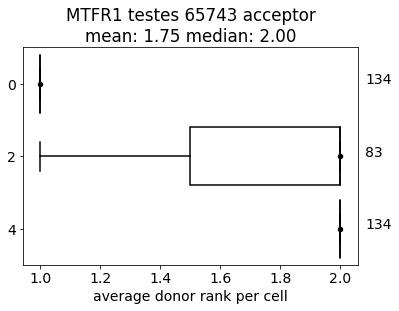

ranks 1.0    2
2.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65743519_don_ann.png


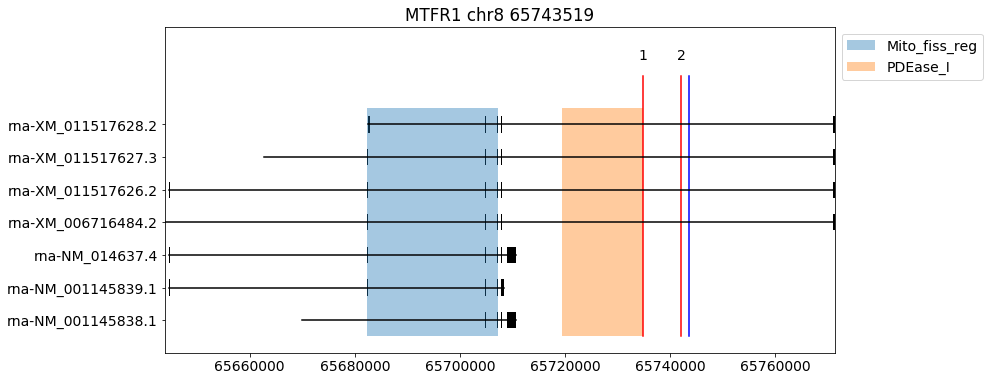

ann_dict {2: True, 1: True}


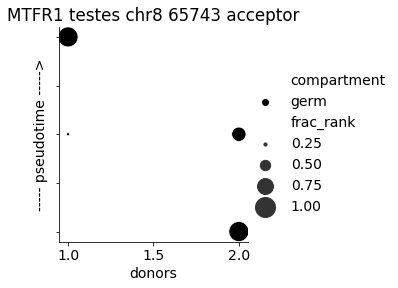

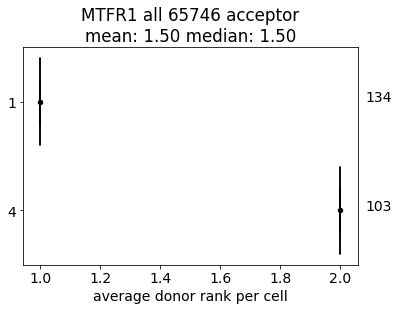

ranks 2.0    1
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65746118_don_ann.png


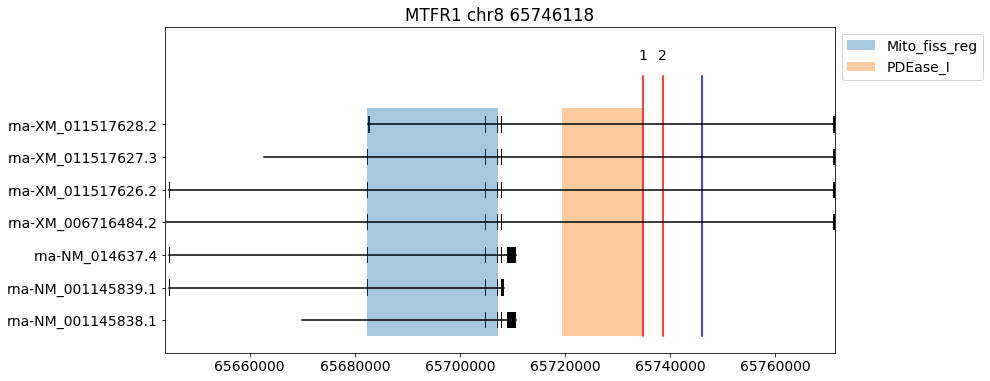

ann_dict {1: True, 2: True}


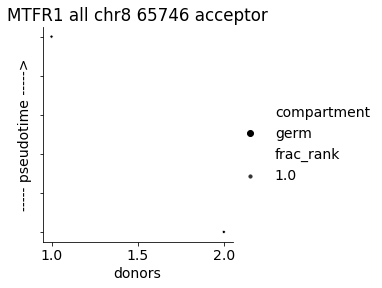

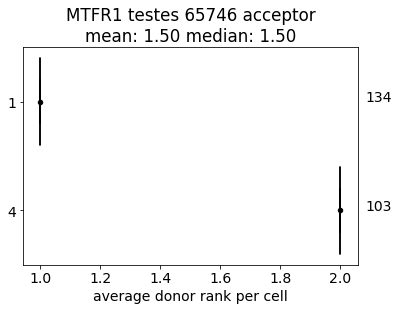

ranks 2.0    1
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65746118_don_ann.png


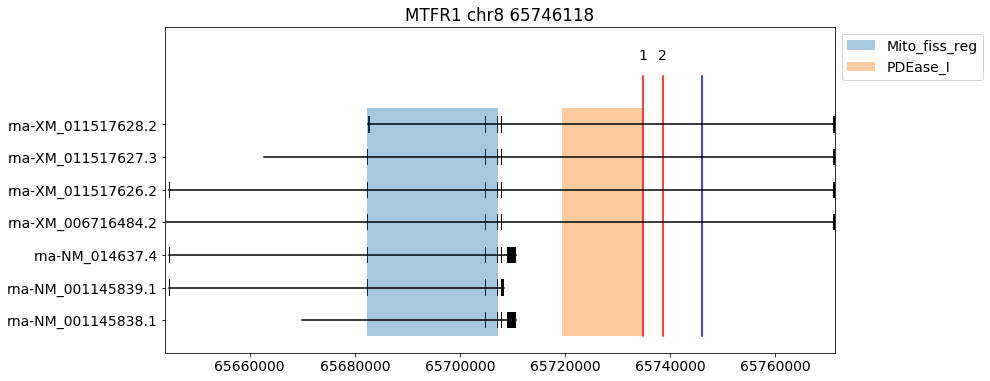

ann_dict {1: True, 2: True}


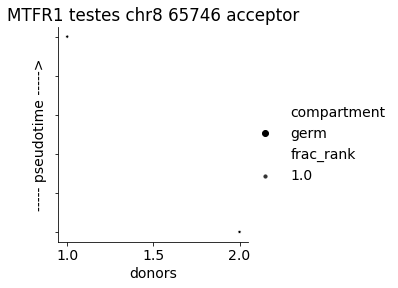

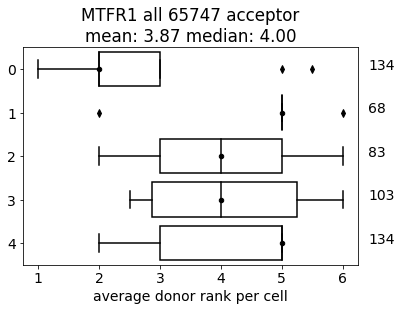

ranks 2.0    5
5.0    5
3.0    4
6.0    4
4.0    2
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65747691_don_ann.png


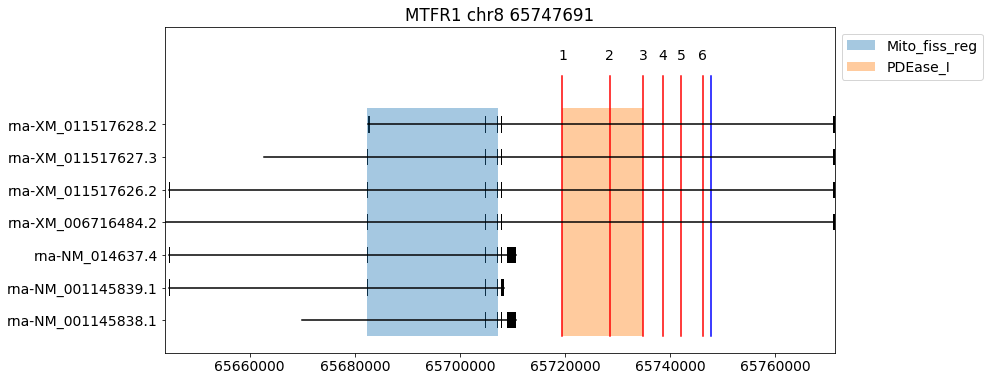

ann_dict {6: True, 5: True, 2: True, 4: True, 3: True, 1: True}


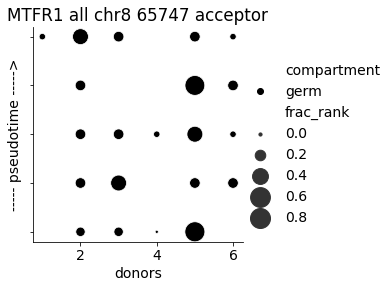

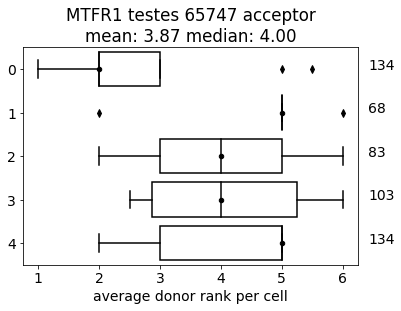

ranks 2.0    5
5.0    5
3.0    4
6.0    4
4.0    2
1.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65747691_don_ann.png


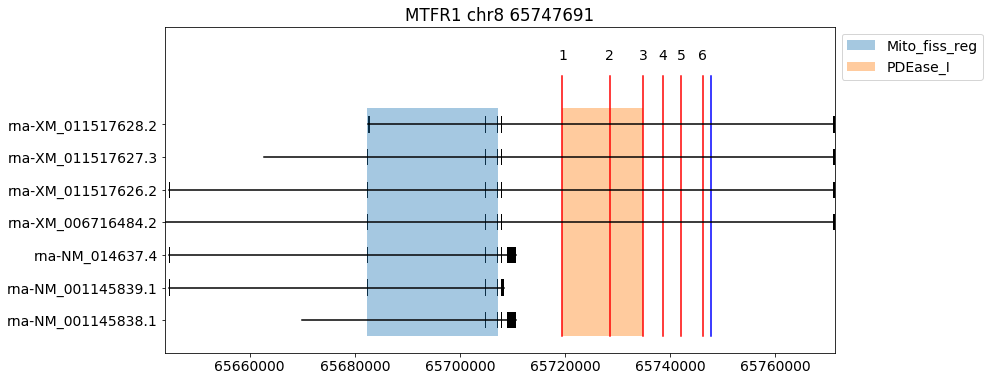

ann_dict {6: True, 5: True, 2: True, 4: True, 3: True, 1: True}


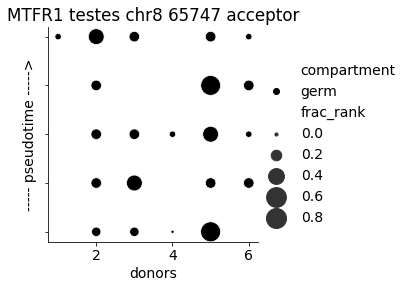

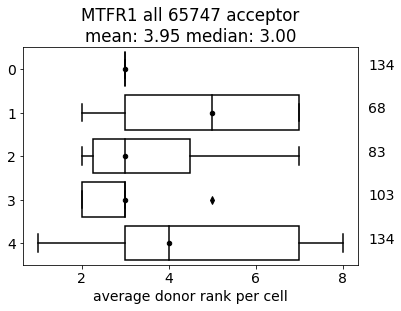

ranks 3.0    5
5.0    4
2.0    4
7.0    3
6.0    2
1.0    2
4.0    1
8.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65747777_don_ann.png


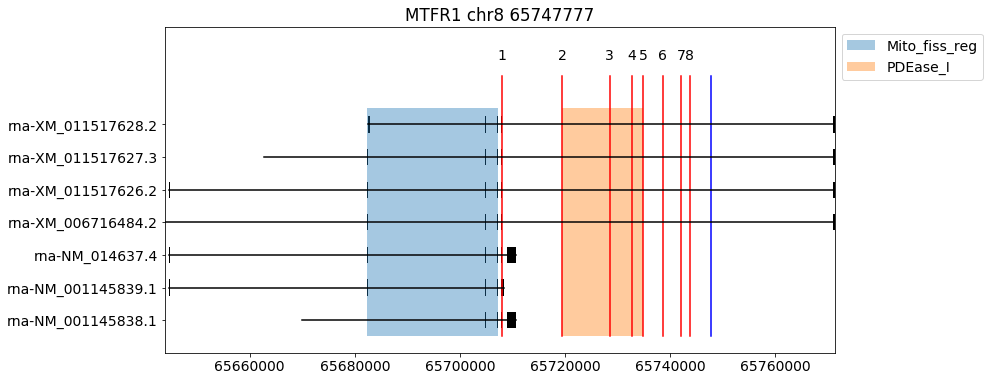

ann_dict {3: True, 2: True, 8: True, 1: True, 7: True, 6: True, 5: True, 4: True}


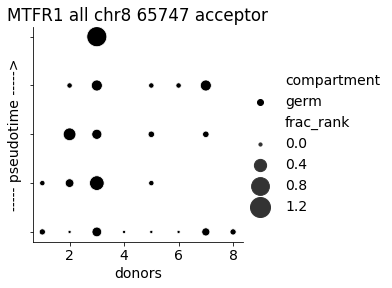

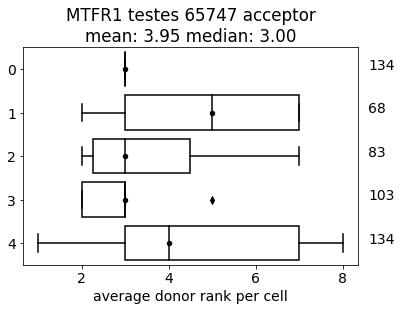

ranks 3.0    5
5.0    4
2.0    4
7.0    3
6.0    2
1.0    2
4.0    1
8.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65747777_don_ann.png


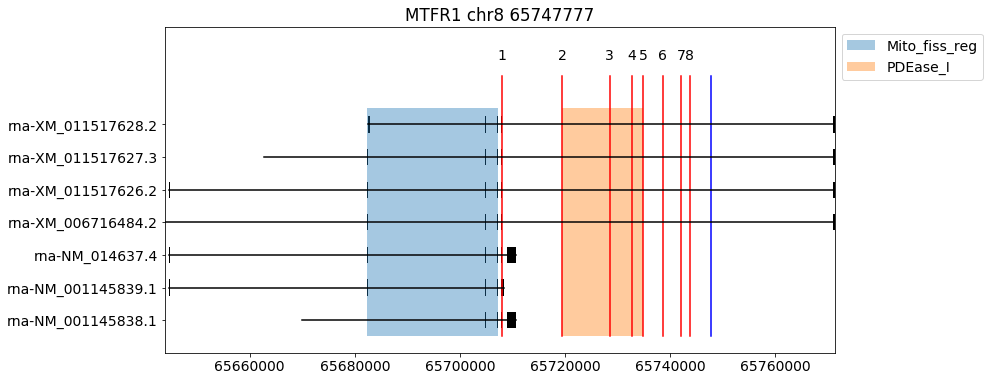

ann_dict {3: True, 2: True, 8: True, 1: True, 7: True, 6: True, 5: True, 4: True}


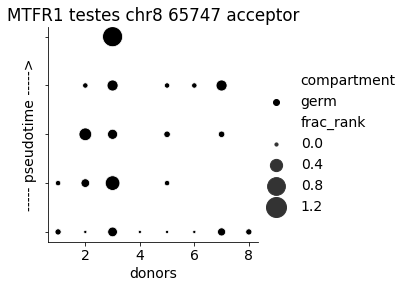

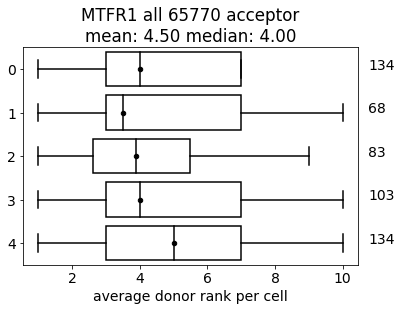

ranks 6.0     5
4.0     5
7.0     5
3.0     5
2.0     5
1.0     5
5.0     4
10.0    4
8.0     2
9.0     1
12.0    1
11.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65770947_don_ann.png


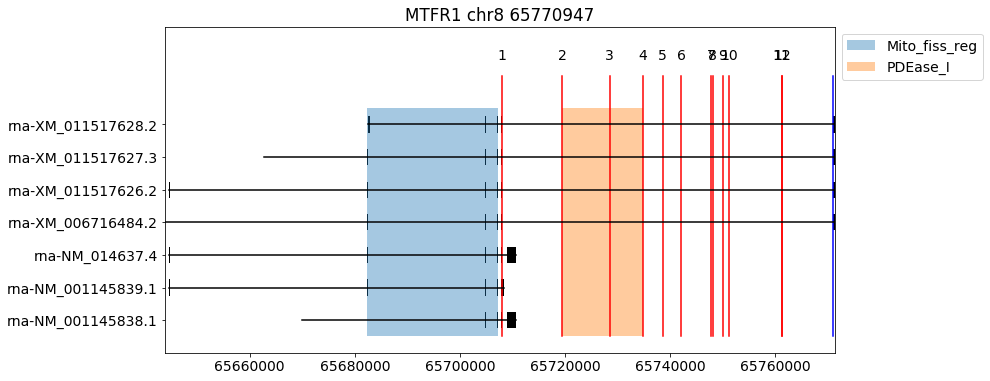

ann_dict {1: True, 2: True, 3: True, 7: True, 4: True, 10: True, 6: True, 5: True, 11: True, 8: True, 12: True, 9: True}


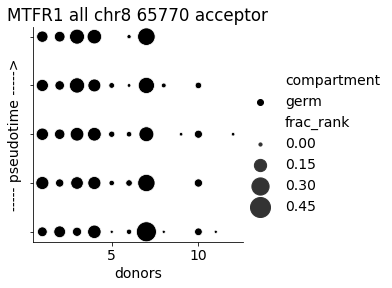

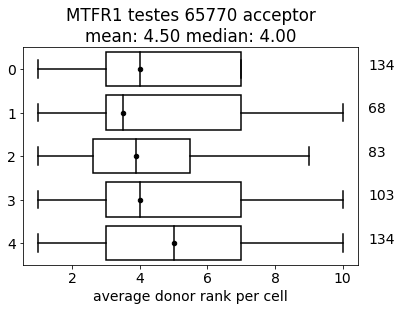

ranks 6.0     5
4.0     5
7.0     5
3.0     5
2.0     5
1.0     5
5.0     4
10.0    4
8.0     2
9.0     1
12.0    1
11.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65770947_don_ann.png


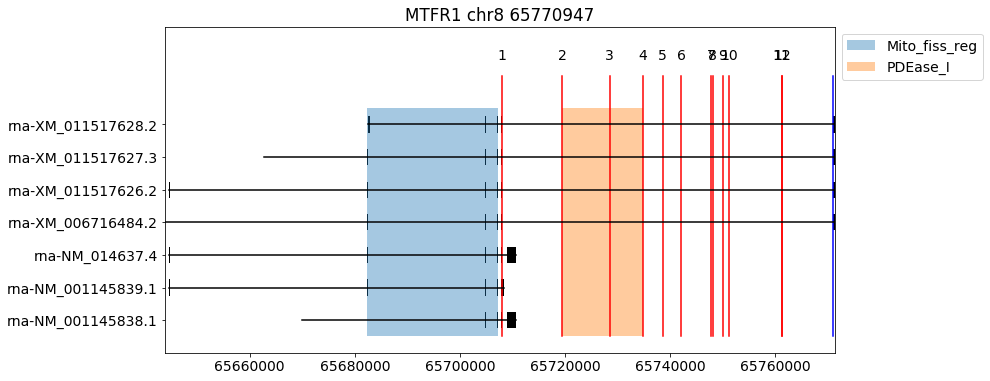

ann_dict {1: True, 2: True, 3: True, 7: True, 4: True, 10: True, 6: True, 5: True, 11: True, 8: True, 12: True, 9: True}


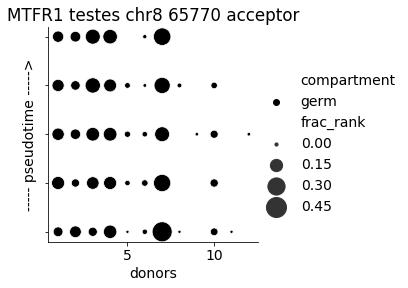

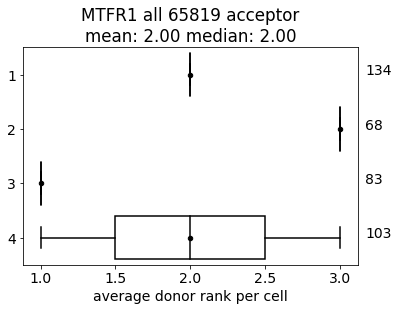

ranks 2.0    2
3.0    2
1.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65819953_don_ann.png


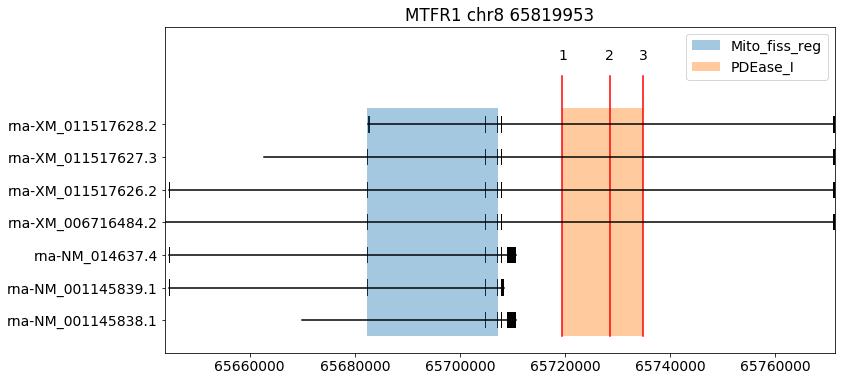

ann_dict {1: True, 3: True, 2: True}


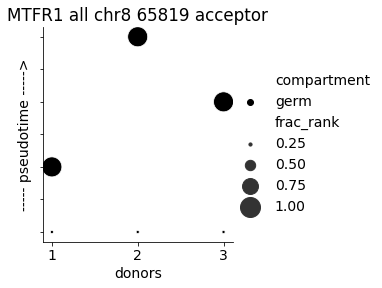

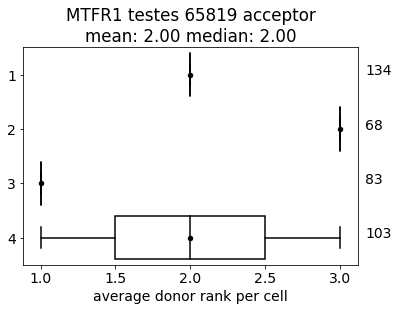

ranks 2.0    2
3.0    2
1.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/MTFR1/Spermatogenesis dataMTFR1_65819953_don_ann.png


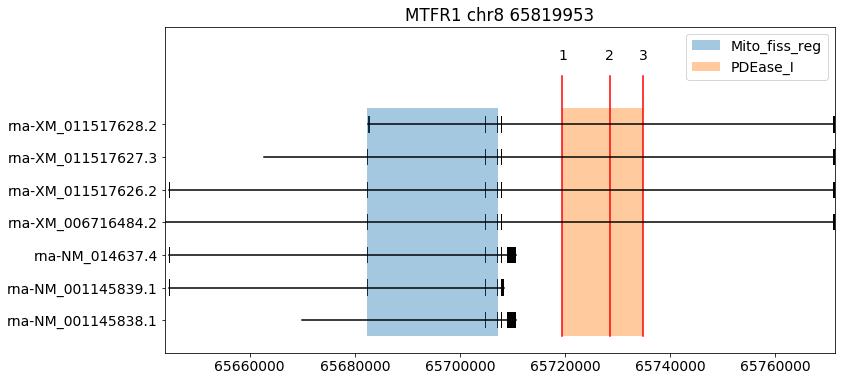

ann_dict {1: True, 3: True, 2: True}


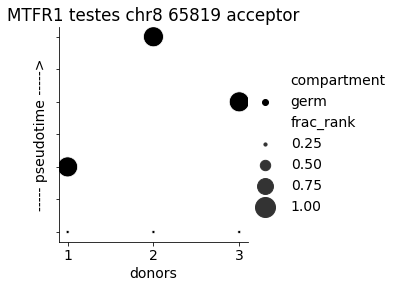

 60%|██████    | 3/5 [02:22<01:23, 41.69s/it]

gene SPATA42


0    657
4    485
3    281
1    227
2    212
5     42
6      0
7      0
8      0
Name: binned_pt, dtype: int64

size before sub (1904, 30)


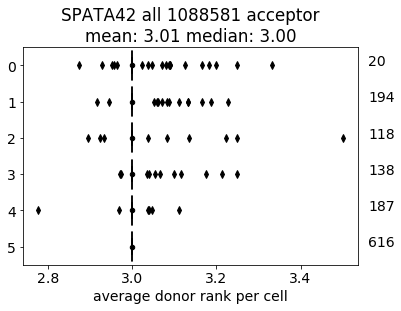

ranks 3.0    6
2.0    5
5.0    5
4.0    4
6.0    4
1.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/SPATA42/Spermatogenesis dataSPATA42_108858158_don_ann.png


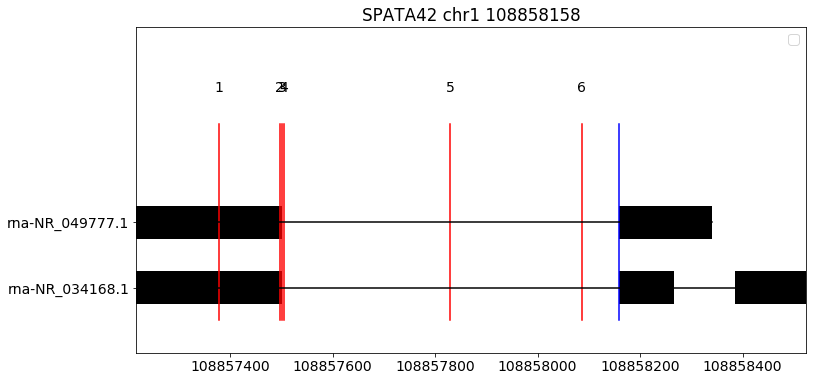

ann_dict {3: True, 1: True, 6: True, 4: True, 5: True, 2: True}


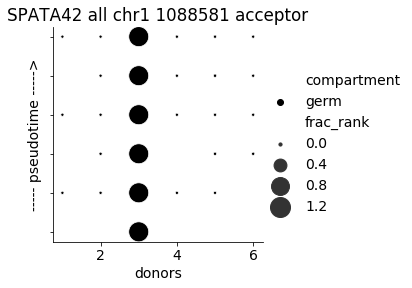

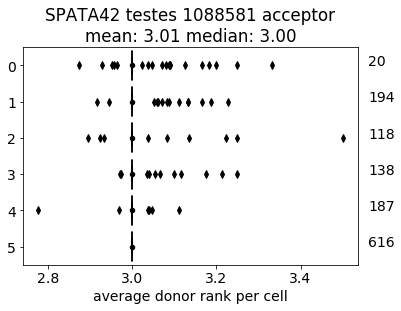

ranks 3.0    6
2.0    5
5.0    5
4.0    4
6.0    4
1.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/SPATA42/Spermatogenesis dataSPATA42_108858158_don_ann.png


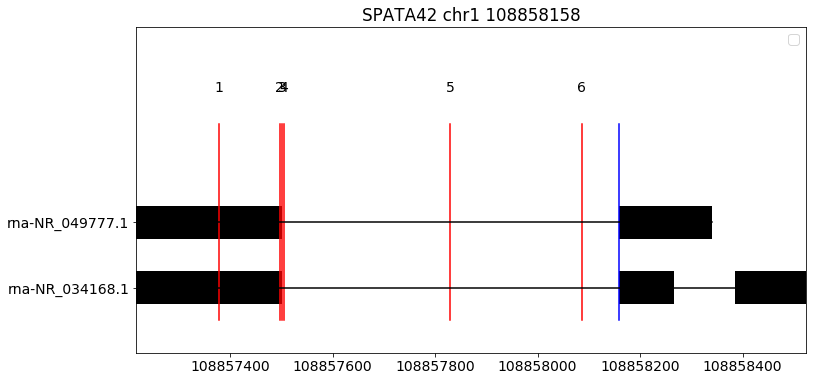

ann_dict {3: True, 1: True, 6: True, 4: True, 5: True, 2: True}


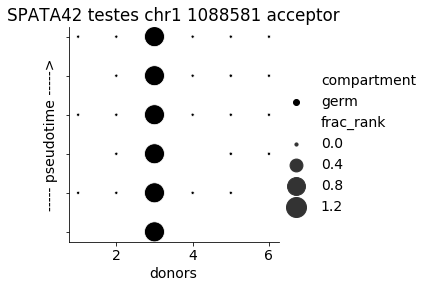

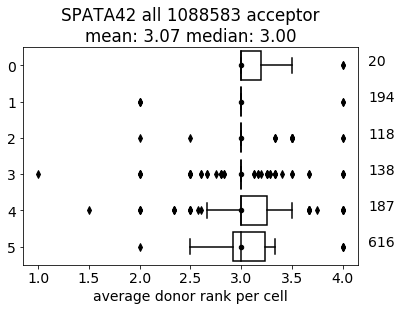

ranks 2.0    6
3.0    6
4.0    6
1.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/SPATA42/Spermatogenesis dataSPATA42_108858385_don_ann.png


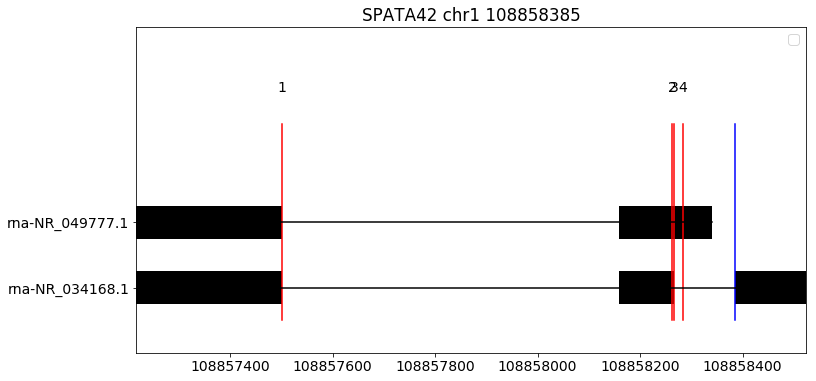

ann_dict {4: True, 3: True, 2: True, 1: True}


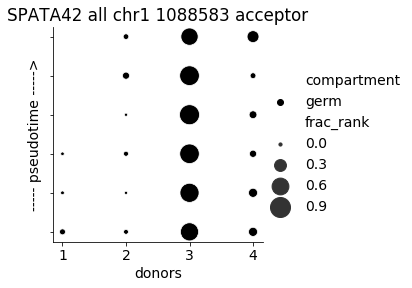

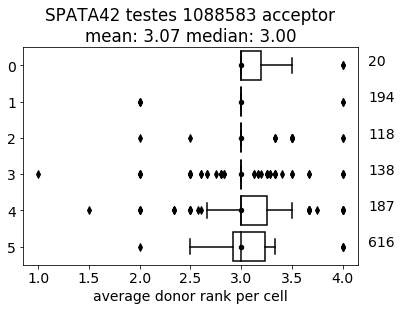

ranks 2.0    6
3.0    6
4.0    6
1.0    3
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/SPATA42/Spermatogenesis dataSPATA42_108858385_don_ann.png


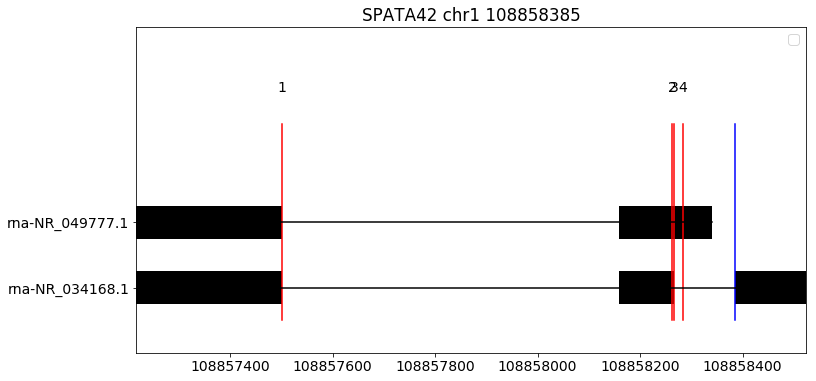

ann_dict {4: True, 3: True, 2: True, 1: True}


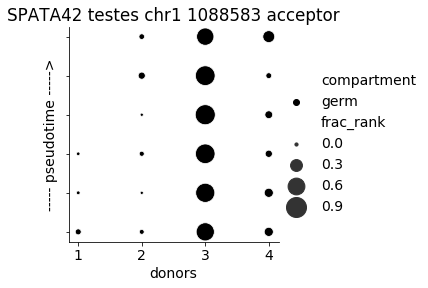

 80%|████████  | 4/5 [02:29<00:31, 31.28s/it]

gene TPPP2


4    1754
0    1205
1     567
2     465
3     407
5     228
6       0
7       0
8       0
Name: binned_pt, dtype: int64

size before sub (4626, 30)


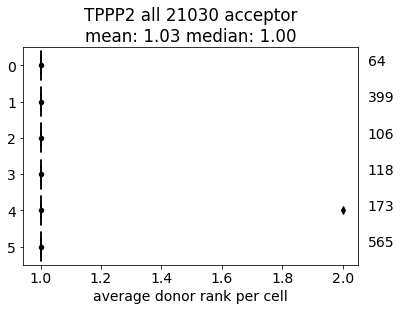

ranks 1.0    6
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21030513_don_ann.png


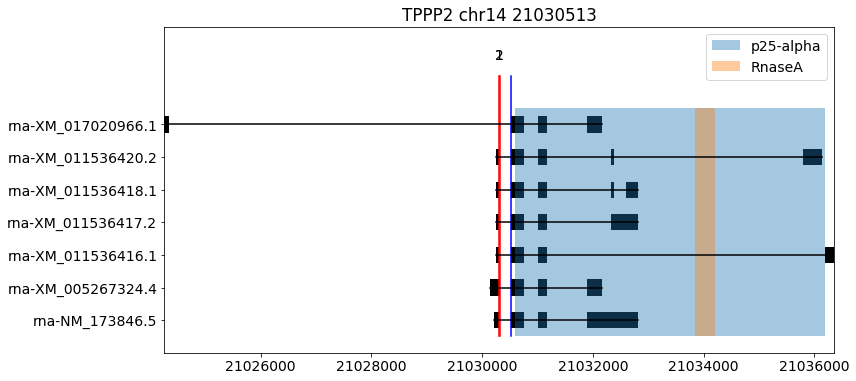

ann_dict {1: True, 2: True}


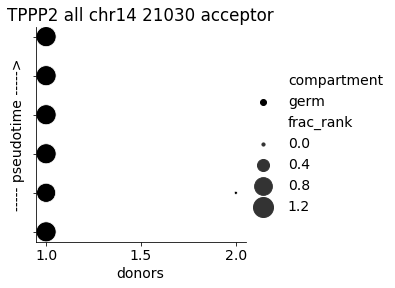

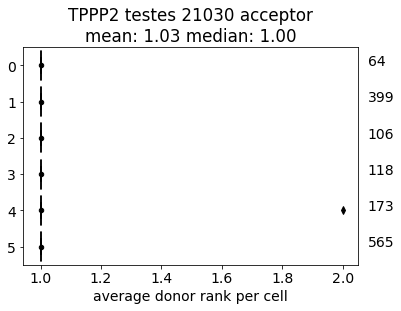

ranks 1.0    6
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21030513_don_ann.png


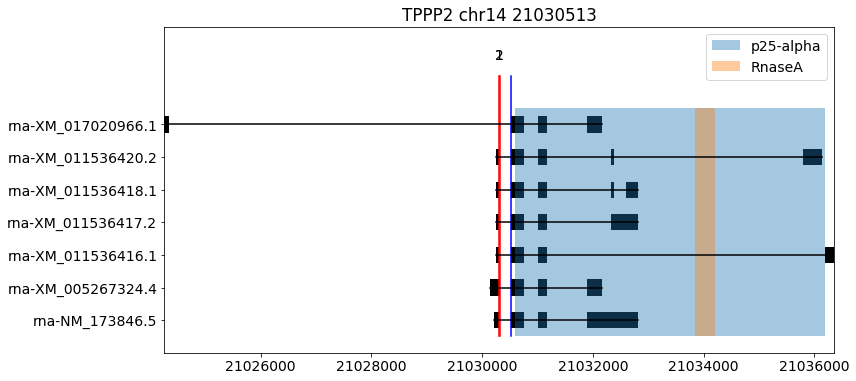

ann_dict {1: True, 2: True}


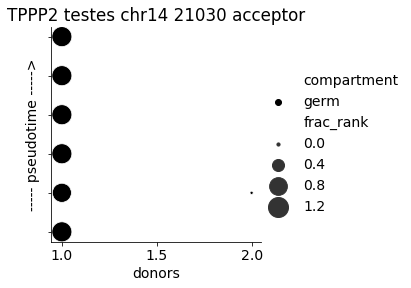

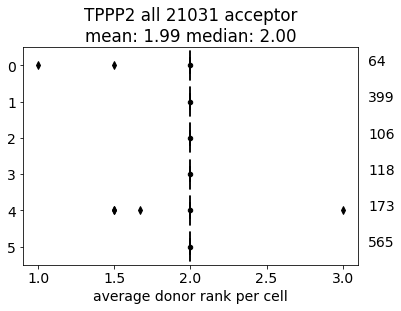

ranks 2.0    6
1.0    2
3.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21031012_don_ann.png


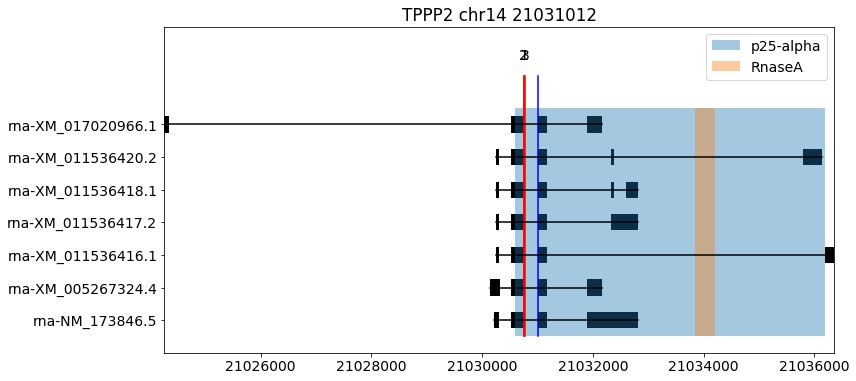

ann_dict {2: True, 1: True, 3: True}


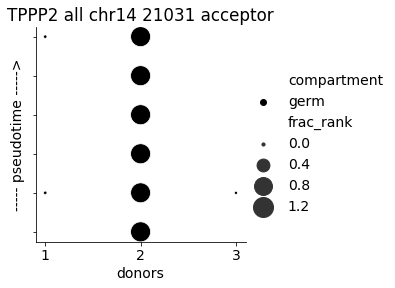

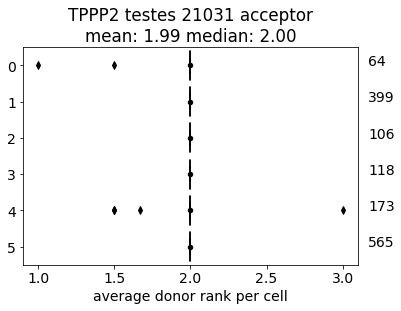

ranks 2.0    6
1.0    2
3.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21031012_don_ann.png


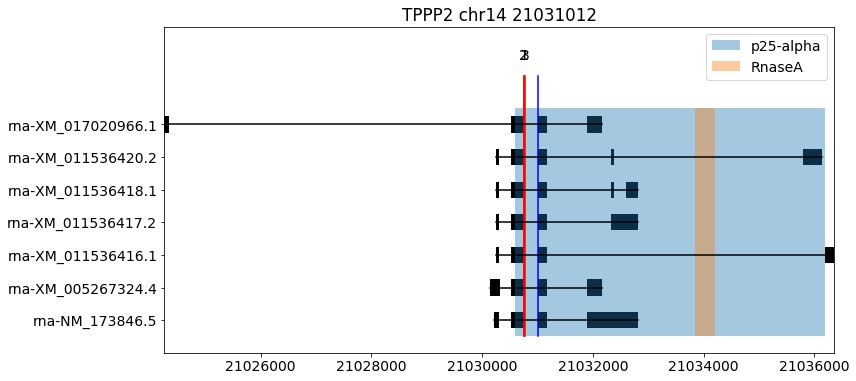

ann_dict {2: True, 1: True, 3: True}


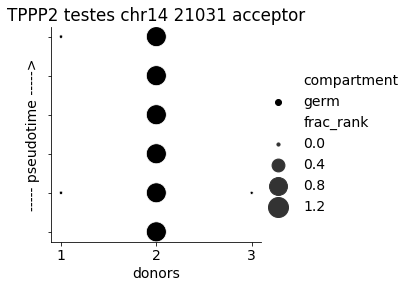

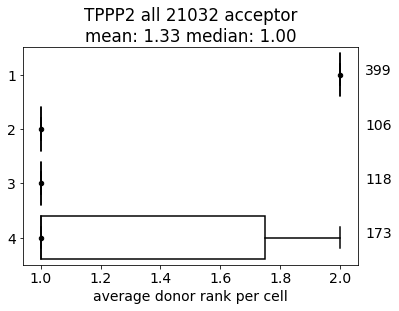

ranks 1.0    3
2.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032278_don_ann.png


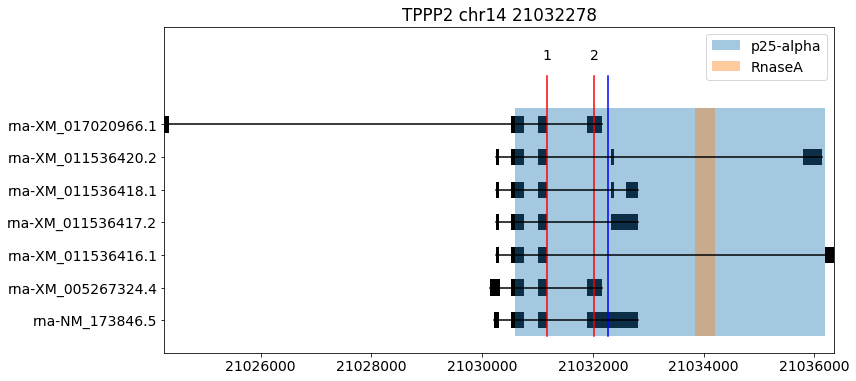

ann_dict {1: True, 2: True}


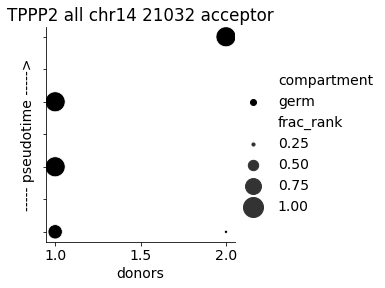

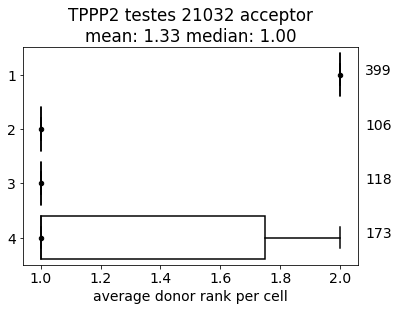

ranks 1.0    3
2.0    2
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032278_don_ann.png


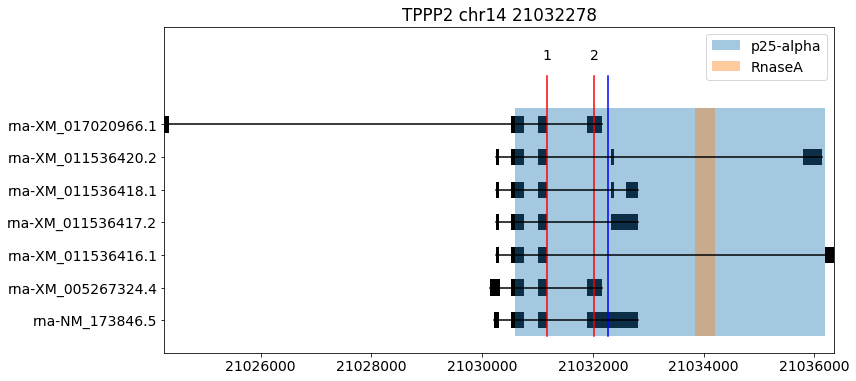

ann_dict {1: True, 2: True}


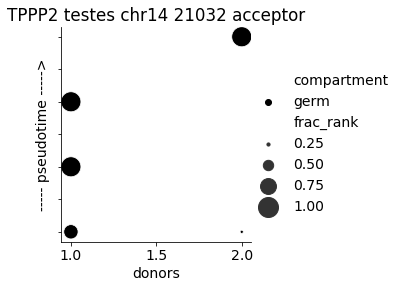

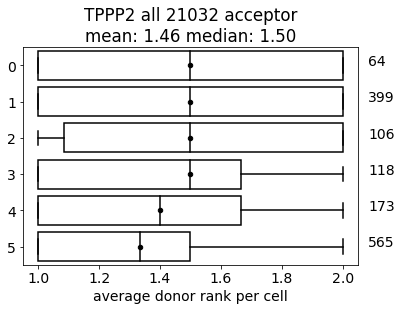

ranks 2.0    6
1.0    6
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032320_don_ann.png


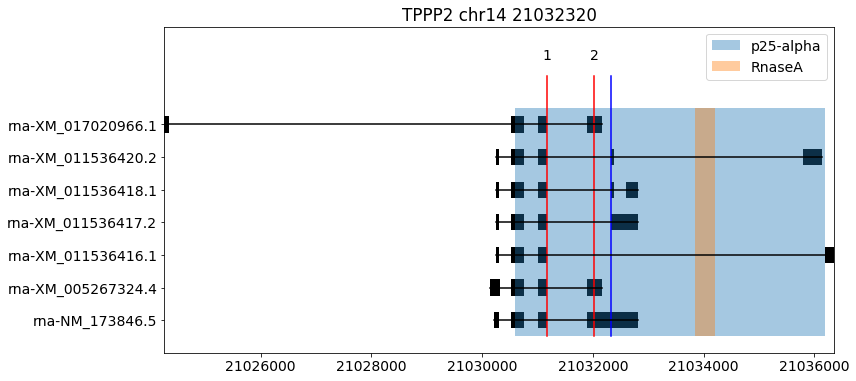

ann_dict {1: True, 2: True}


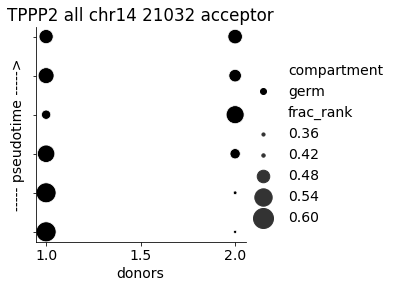

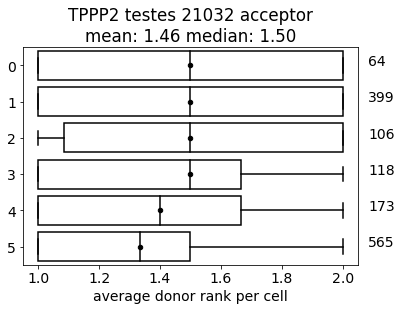

ranks 2.0    6
1.0    6
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032320_don_ann.png


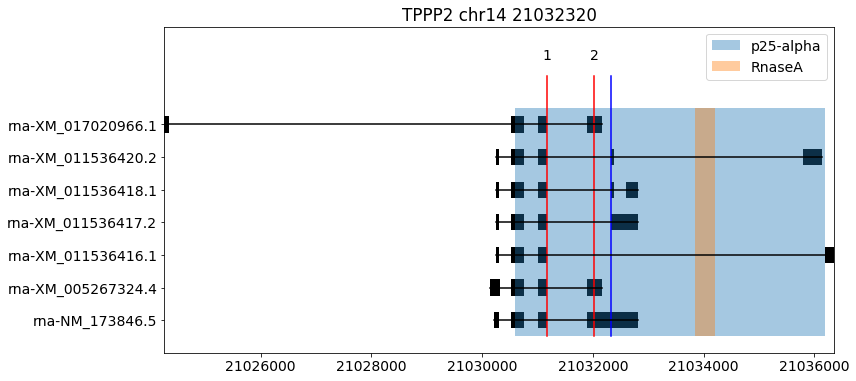

ann_dict {1: True, 2: True}


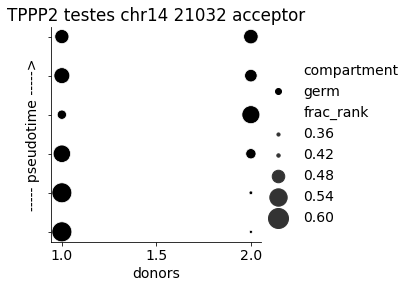

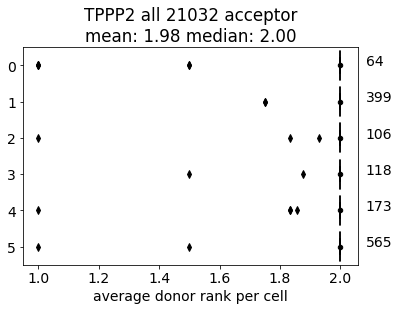

ranks 1.0    6
2.0    6
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032605_don_ann.png


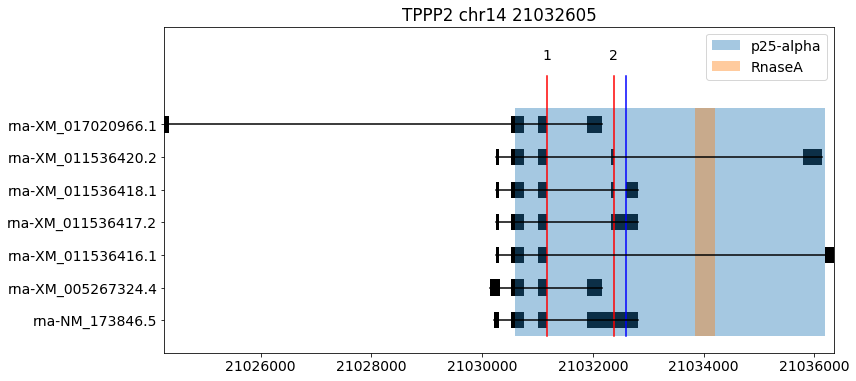

ann_dict {2: True, 1: True}


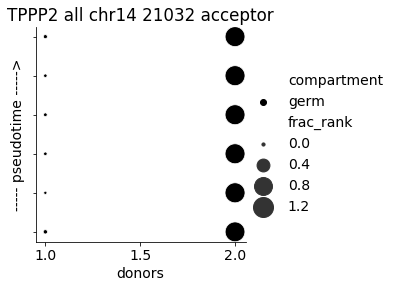

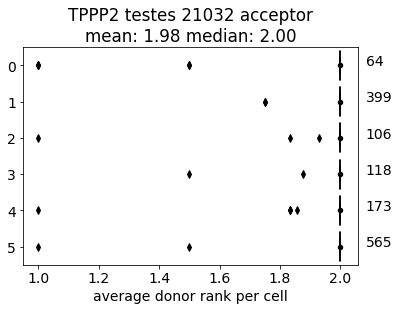

ranks 1.0    6
2.0    6
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21032605_don_ann.png


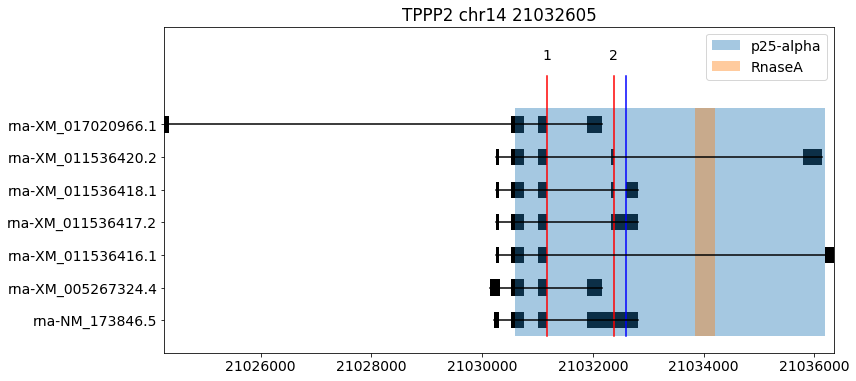

ann_dict {2: True, 1: True}


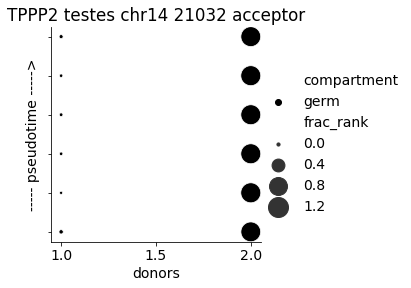

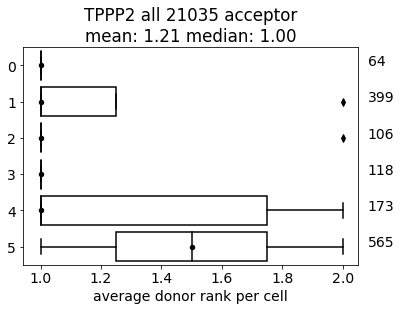

ranks 1.0    6
2.0    4
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21035794_don_ann.png


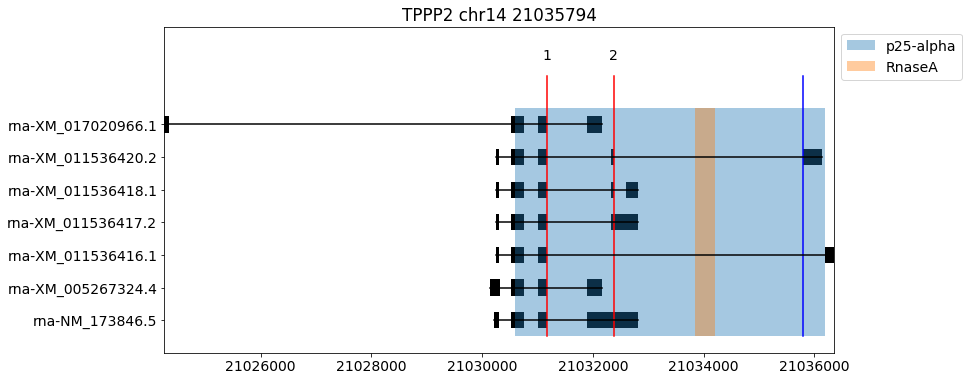

ann_dict {1: True, 2: True}


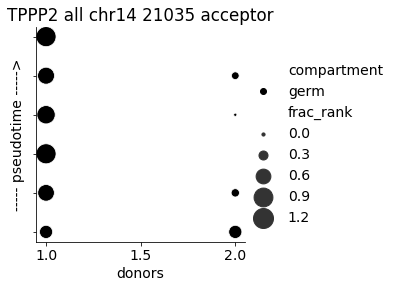

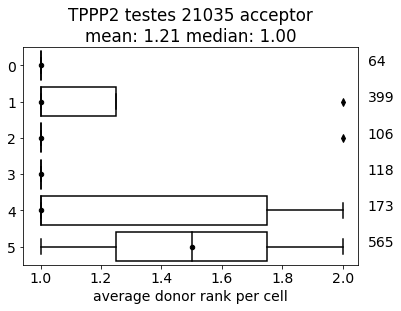

ranks 1.0    6
2.0    4
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21035794_don_ann.png


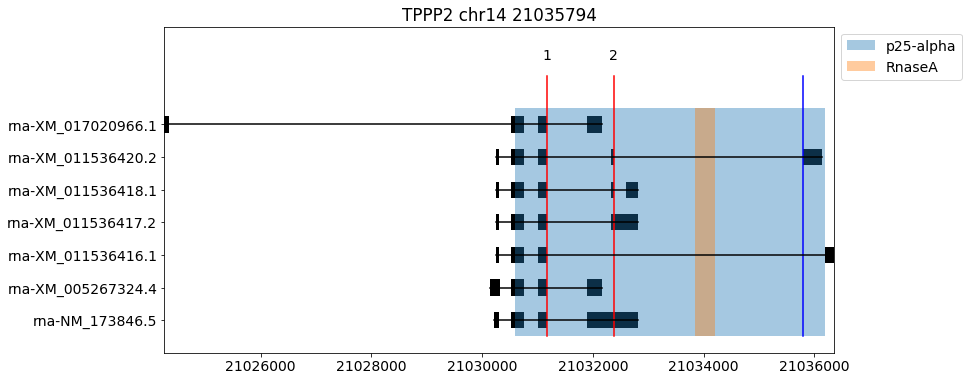

ann_dict {1: True, 2: True}


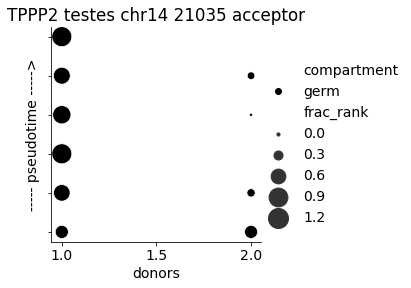

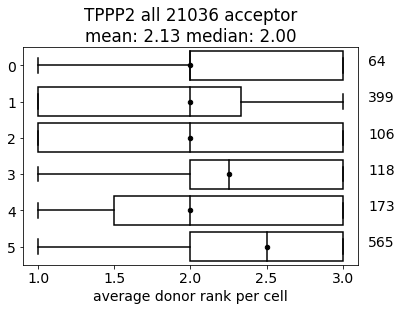

ranks 3.0    6
2.0    6
1.0    6
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21036191_don_ann.png


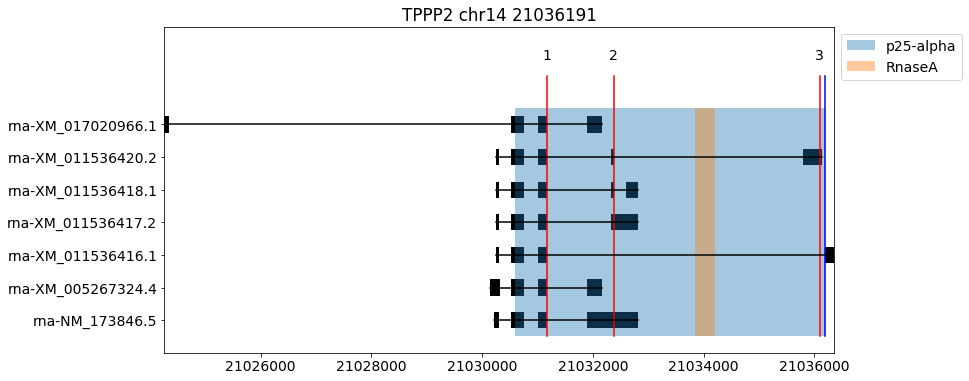

ann_dict {1: True, 2: True, 3: True}


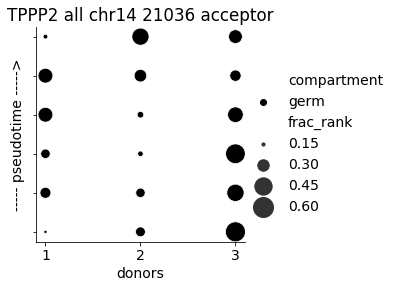

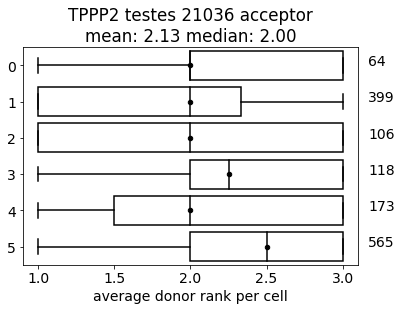

ranks 3.0    6
2.0    6
1.0    6
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21036191_don_ann.png


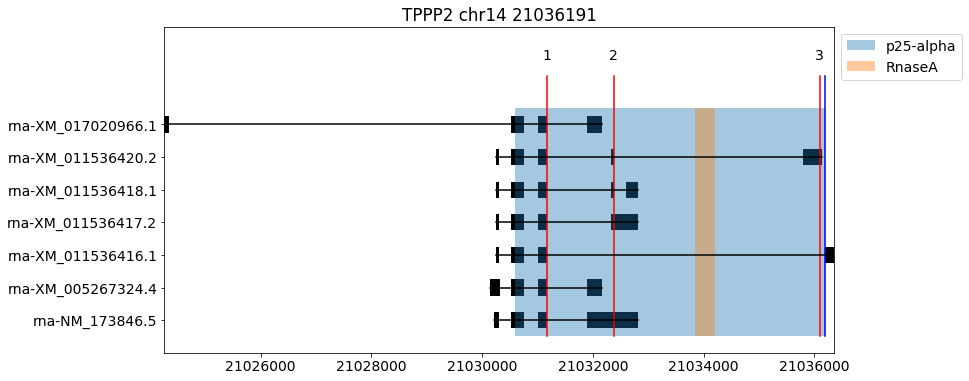

ann_dict {1: True, 2: True, 3: True}


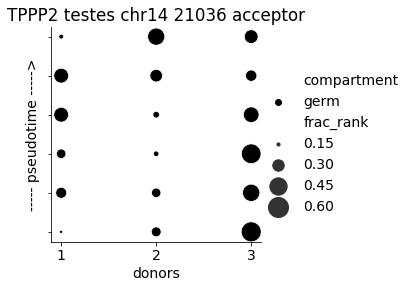

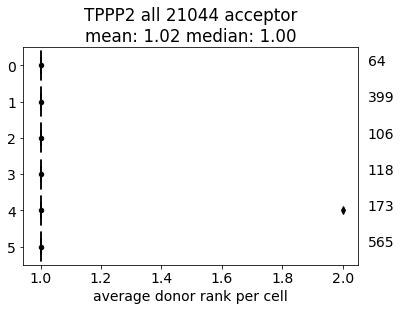

ranks 1.0    6
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21044080_don_ann.png


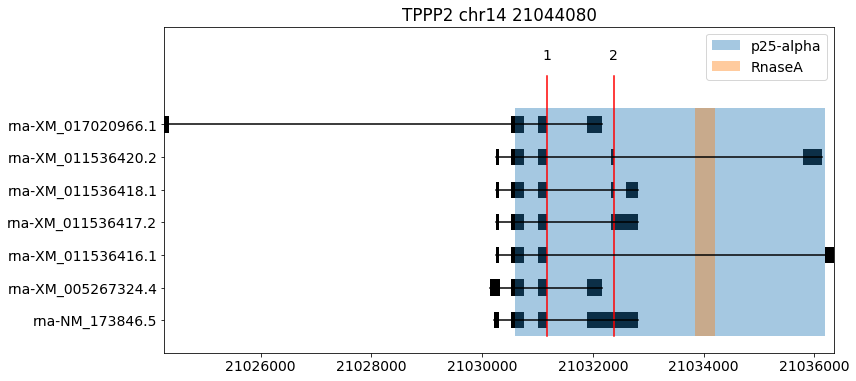

ann_dict {1: True, 2: True}


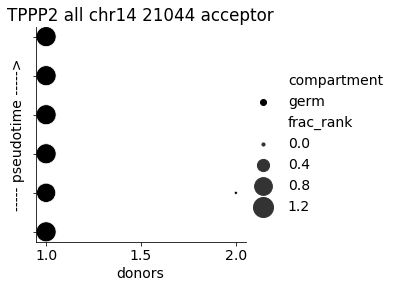

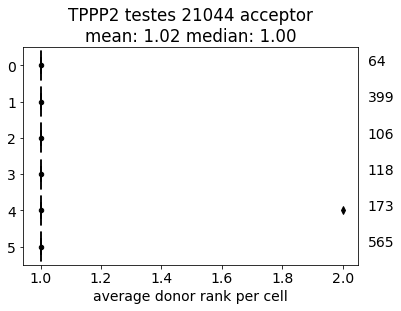

ranks 1.0    6
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21044080_don_ann.png


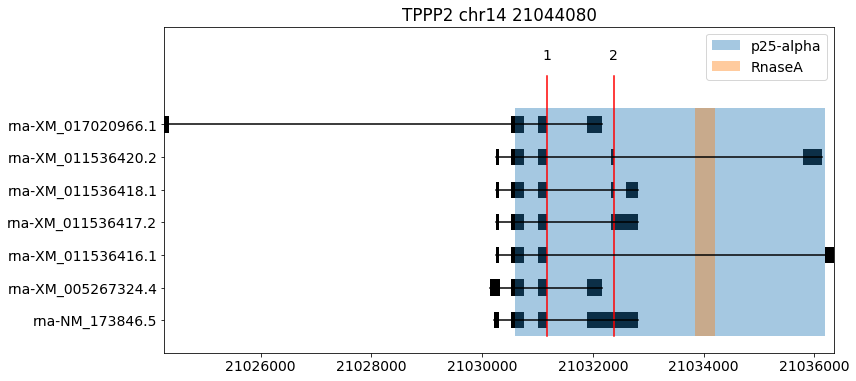

ann_dict {1: True, 2: True}


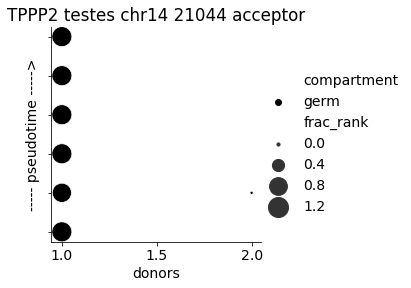

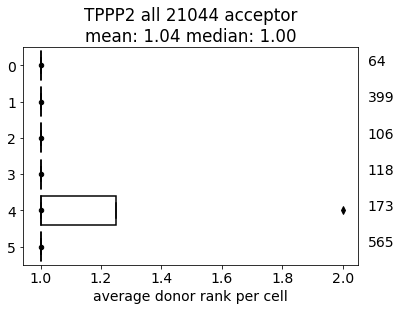

ranks 1.0    6
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21044100_don_ann.png


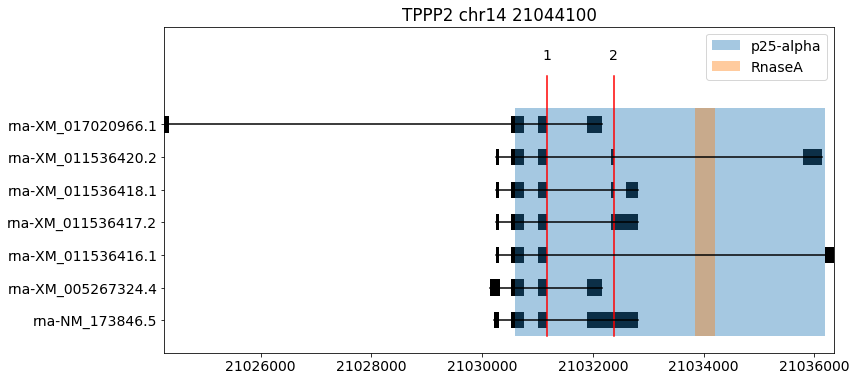

ann_dict {1: True, 2: True}


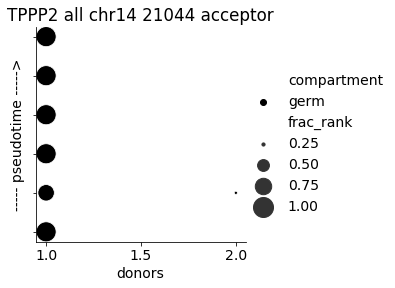

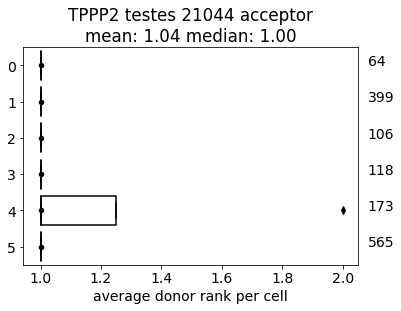

ranks 1.0    6
2.0    1
Name: rank_don, dtype: int64
/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/plot_human_spermatogenesis/TPPP2/Spermatogenesis dataTPPP2_21044100_don_ann.png


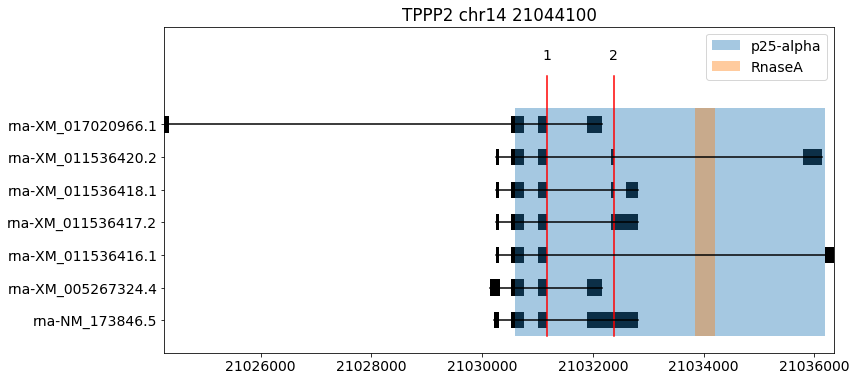

ann_dict {1: True, 2: True}


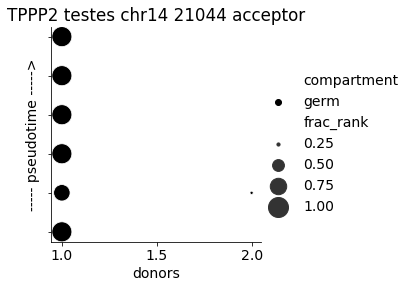

100%|██████████| 5/5 [03:16<00:00, 39.22s/it]


In [23]:
# split_col = "dev_stage"
# for split_col in ["dev_stage","binned_pt"]:
for split_col in ["binned_pt"]:
  # letter = "B"
  dataname="Spermatogenesis data"
  cell_lim = 10

  for letter in ["A","B"]:
    #  gtf["gene_id"] = gtf["gene_id"].replace("FYB1","FYB")
    #  gtf["gene_id"] = gtf["gene_id"].replace("ATP5F1C","ATP5C1")
    display(df[split_col].value_counts())
    # only include ontology/gene pairs with at least 20 cells

    df["ontology"] = df[split_col].astype(str)
    df["ontology_gene"] = df["ontology"] + df["geneR1A_uniq"]
    df["ontology_don"] = df["ontology"] + df["posA_group"]
    df["ontology_acc"] = df["ontology"] + df["posB_group"]
    df["num_cells"] = df["ontology_gene"].map(df.groupby("ontology_gene")["cell"].nunique())
    display(df[split_col].value_counts())
    df = df[df["num_cells"] > cell_lim]
    df["num_cell_ont"] = df["ontology_gene"].map(df.groupby("ontology_gene")["cell"].nunique())
    df = df[df["num_cell_ont"] > cell_lim]
    display(df[split_col].value_counts())
    # load in coords
    #  f = open("/oak/stanford/groups/horence/julias/tsp/scripts/TS_10x_redo_sym_S_0.1_z_0.0_b_5_light.tsvsplice_coor{}.tab".format(args.letter),"r")
    #  pos_dict = defaultdict(lambda: [])
    #  for line in f.readlines():
    #    if not line.startswith("geneR1A_uniq"):
    #      
    #      line = line.split()
    #      try:
    #        pos_dict[line[1]].append(line[2] + line[1])
    #      except:
    #        print(line)
    #  f.close()

    pos_dict = {}
    #  params = pd.read_csv("/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/notebooks/output/zcontribs_to_plot/params_ATP5F1C.tsv",sep="\t")
    # params = pd.read_csv(args.params,sep="\t")

    #  params = params[params["let"] == args.letter]

    params = pd.DataFrame.from_dict({"gene" : ["MTFR1","MTFR1","TPPP2","TPPP2","FAM71E1","FAM71E1","SPATA42","SPATA42","MLF1","MLF1"],"let" : ["B","A","B","A","B","A","B","A","B","A"], "end" : [0,0,0,0,0,0,0,0,0,0]})

    pos_dict = {}
    for gene, gene_df in params.groupby("gene"):
      pos_dict[gene] = list(gene_df["end"].unique())



    #  pos_dict = {"MYL6" : [56160320],"ATP5C1": [7802854],"IRF1" : [132490545], "CD47" : [108047292]}
    #  print("pos_dict",pos_dict)
    #  genes = []
    #  f = open("/scratch/PI/horence/JuliaO/single_cell/Differential_Splicing/sig_genes.txt","r")
    #  for line in f.readlines():
    #    genes.append(line[:-1])
    #  f.close()

    sub = False
    const_color = True
    comp_sort = True

    let_dict = {"A" : "acc", "B" : "don"}
    rev_dict = {"A" : "B", "B" : "A"}

    #  compartments = ['germ', 'lymphoid', 'myeloid', 'stromal', 'epithelial',
    #             'neural', 'endothelial', 'megakaryocyte-erythroid',
    #                    'hematopoietic']
    #  compartments = ['Endothelial', 'Epithelial', 'Immune', 'Stromal']
    alpha = 1
    if const_color:
      palette = defaultdict(lambda : "black")
    else:
      compartments = sorted([x for x in list(df["compartment"].unique()) if x != None])

      palette = compartment_colors(compartments) #{"Endothelial" : u'#1f77b4', "Stromal" : u'#ff7f0e', "Epithelial" : u'#2ca02c', "Immune" : u'#d62728'}

    genes = list(pos_dict.keys())
    #  genes = ["TTC23","TEX43","WDR31","TRNAR-UCU","MLF1","STMN1","LOC105861217","LOC105872934"]
    #  genes = ["MYL6","RPS24","ATP5C1"]
    for gene in tqdm(genes):
    #    try:
        print("gene",gene)
        genepath = outpath + gene + "/"
        if not os.path.exists(genepath):
          os.makedirs(genepath)
        gene_df = df[df["geneR1A_uniq"] == gene]
        display(gene_df[split_col].value_counts())
        print("size before sub",gene_df.shape)
        if sub:
          gene_df = gene_df[gene_df["juncPosR1{}".format(letter)].isin(pos_dict[gene])]
          print("size gene_df",gene_df.shape)
        for let in [letter]:

          gene_df["num_" + let_dict[let]] = gene_df["pos{}_group".format(let)].map(gene_df.groupby("pos{}_group".format(let))["pos{}_group".format(rev_dict[let])].nunique())
          gene_df = gene_df[gene_df["num_" + let_dict[let]] > 1]
          gene_df["pos{}_cell".format(let)] = gene_df["pos{}_group".format(let)] + gene_df["cell"]
          gene_df["rank_{}".format(let_dict[let])] = gene_df.groupby("pos{}_group".format(let))["juncPosR1{}".format(rev_dict[let])].rank(method="dense")
          gene_df["scaled_rank"] = gene_df["rank_" + let_dict[let]] * gene_df["numReads"]
          gene_df["num"] = gene_df["pos{}_cell".format(let)].map(gene_df.groupby("pos{}_cell".format(let))["scaled_rank"].sum())
          gene_df["denom"] = gene_df["pos{}_cell".format(let)].map(gene_df.groupby("pos{}_cell".format(let))["numReads"].sum())
          gene_df["avg_rank"] = gene_df["num"]/gene_df["denom"]
  #         \print("gene size 2",gene_df.shape)
     #     gene_df = gene_df.drop_duplicates("pos{}_cell".format(let))
          box(gene_df, let, cell_lim, genepath, gene, dataname, let_dict, palette, rev_dict, domains, gtf,alpha, comp_sort,split_col)
    #    except Exception as e:
    #      print(e)

In [9]:
df = pd.read_csv("/oak/stanford/groups/horence/Roozbeh/single_cell_project/processed_files/zscores/zscore_files/spermatogenesis_human_10x_unselected_sym_S_0.1_z_0.0_b_5_light_subcol_pseudotime.tsv",sep="\t")

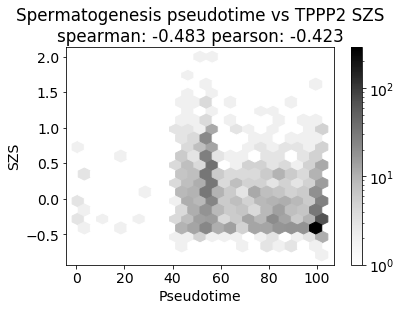

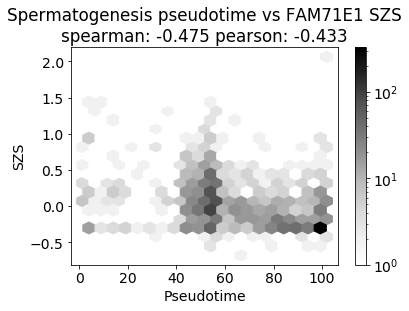

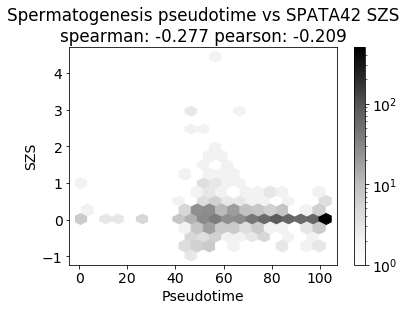

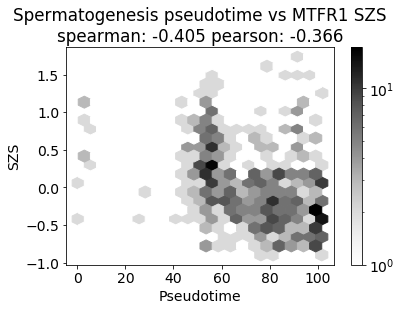

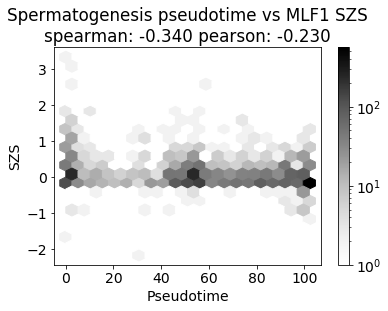

In [10]:
genes = ["TPPP2","FAM71E1","SPATA42","MTFR1","MLF1"]
for gene in genes:
  gene_df = df[df["geneR1A_uniq"] == gene]
  plt.hexbin(gene_df["Pseudotime"],gene_df["scZ"],gridsize=20,cmap="Greys",bins="log")
  plt.title("Spermatogenesis pseudotime vs {} SZS\nspearman: {:.3f} pearson: {:.3f}".format(gene,gene_df["Pseudotime"].corr(gene_df["scZ"],method="spearman"),gene_df["Pseudotime"].corr(gene_df["scZ"],method="pearson")))
  plt.xlabel("Pseudotime")
  plt.ylabel("SZS")
  plt.colorbar()
  plt.savefig("{}{}_corr.png".format(outpath,gene),bbox_inches="tight")
  plt.show()